In [1]:
import os
import numpy as np

import matplotlib.pyplot as plt

from obspy.signal.filter import bandpass
#from noisepy.monitoring.attenuation_utils import *
from noisepy.monitoring.monitoring_utils import *
from noisepy.seis.noise_module import mad
from noisepy.seis.io.asdfstore import ASDFStackStore

from attenuation_utils_mulwin import *
# from datetimerange import DateTimeRange
# from datetime import datetime, timezone



/home/kffeng/NoisePy/src/noisepy/seis/io/utils.py:13: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [2]:
path='NCF_stack/'
ref_store = ASDFStackStore(path)

path='NCF_substack/'
scf_store = ASDFStackStore(path)

In [3]:
pairs = ref_store.get_station_pairs()
print(f"Found {len(pairs)} station pairs")
print('pairs: ',pairs)

stations = set(pair[0] for pair in pairs)
print('Stations: ', stations)

src = stations.pop()
rec = src

print('src: ', src) 
print('rec: ', rec)

Found 1 station pairs
pairs:  [(CI.LJR, CI.LJR)]
Stations:  {CI.LJR}
src:  CI.LJR
rec:  CI.LJR


ref_span:  [2016-01-01T00:00:00+0000 - 2022-12-31T00:00:00+0000]
maxlag: 60 ; delta: 0.05 ; npts: 2401 ; ncmp: 6
skip EE
skip NN
skip ZZ


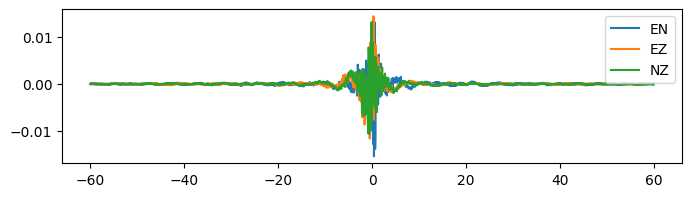

In [4]:
ref_span = ref_store.get_timespans(src, rec)
print('ref_span: ', ref_span)
wave_temp=ref_store.read(ref_span[0], src, rec)

maxlag, delta = wave_temp[0].parameters['maxlag'], wave_temp[0].parameters['dt']
npts = wave_temp[0].data.size
ncmp=len(ref_store.read(ref_span[0], src, rec))
samp_freq=1/delta

print(f'maxlag: {maxlag} ; delta: {delta} ; npts: {npts} ; ncmp: {ncmp}')


enz_system = ["EN","EZ","NZ"]
num_cmp=len(enz_system)
ref_wave=np.zeros((num_cmp, npts))
k=0
for i in range(ncmp):
    if (wave_temp[i].component == 'ZZ'):
        print(f'skip {wave_temp[i].component}')
        continue
    elif (wave_temp[i].component == 'NN'):
        print(f'skip {wave_temp[i].component}')
        continue 
    elif (wave_temp[i].component == 'EE'):
        print(f'skip {wave_temp[i].component}')
        continue
    else:
        ref_wave[k]=wave_temp[i].data
        k=k+1
ref_tvec = np.arange(npts)*delta - maxlag

plt.figure(figsize=(8,2))
plt.plot(ref_tvec,ref_wave[0],label='EN')
plt.plot(ref_tvec,ref_wave[1],label='EZ')
plt.plot(ref_tvec,ref_wave[2],label='NZ')
plt.legend(loc='upper right')
plt.show()

In [5]:
scf_span = scf_store.get_timespans(src, rec)
print('scf_span: ', scf_span)
print(f'Length of scf_span: {len(scf_span)}')
nev=len(scf_span)

ev=[]
scf_tvec = ref_tvec.copy()
scf_wave=np.zeros((len(scf_span), num_cmp, npts))
for tn in range(len(scf_span)):
    #ev.append(scf_span[tn])
    wave_temp=scf_store.read(scf_span[tn], src, rec)
    print(f'tn {tn}; timespan: {scf_span[tn]}; wave_temp: {wave_temp}')
    k=0
    for i in range(ncmp):
        if (wave_temp[i].component == 'ZZ'):
            print(f'skip {wave_temp[i].component}')
            continue
        elif (wave_temp[i].component == 'NN'):
            print(f'skip {wave_temp[i].component}')
            continue 
        elif (wave_temp[i].component == 'EE'):
            print(f'skip {wave_temp[i].component}')
            continue
        else:
            scf_wave[tn, k]=wave_temp[i].data
            k=k+1
    # plt.figure(figsize=(8,2))
    # plt.plot(scf_tvec,scf_wave[tn, 0],label='EN')
    # plt.plot(scf_tvec,scf_wave[tn, 1],label='EZ')
    # plt.plot(scf_tvec,scf_wave[tn, 2],label='NZ')
    # plt.legend(loc='upper right')
        

scf_span:  [2015-12-16T00:00:00+0000 - 2016-02-14T00:00:00+0000, 2016-01-16T00:00:00+0000 - 2016-03-16T00:00:00+0000, 2016-02-14T00:00:00+0000 - 2016-04-14T00:00:00+0000, 2016-03-16T00:00:00+0000 - 2016-05-15T00:00:00+0000, 2016-04-15T00:00:00+0000 - 2016-06-14T00:00:00+0000, 2016-05-16T00:00:00+0000 - 2016-07-15T00:00:00+0000, 2016-06-15T00:00:00+0000 - 2016-08-14T00:00:00+0000, 2016-07-16T00:00:00+0000 - 2016-09-14T00:00:00+0000, 2016-08-16T00:00:00+0000 - 2016-10-15T00:00:00+0000, 2016-09-15T00:00:00+0000 - 2016-11-14T00:00:00+0000, 2016-10-16T00:00:00+0000 - 2016-12-15T00:00:00+0000, 2016-11-15T00:00:00+0000 - 2017-01-14T00:00:00+0000, 2016-12-16T00:00:00+0000 - 2017-02-14T00:00:00+0000, 2017-01-16T00:00:00+0000 - 2017-03-17T00:00:00+0000, 2017-02-13T00:00:00+0000 - 2017-04-14T00:00:00+0000, 2017-03-16T00:00:00+0000 - 2017-05-15T00:00:00+0000, 2017-04-15T00:00:00+0000 - 2017-06-14T00:00:00+0000, 2017-05-16T00:00:00+0000 - 2017-07-15T00:00:00+0000, 2017-06-15T00:00:00+0000 - 2017-08

In [6]:
lag=maxlag
print(f"Lag-time: {lag}, total data length in points: {npts}")

fmin, fmax = 2,4
freq=[fmin,fmax]


Lag-time: 60, total data length in points: 2401


In [7]:
# %%
vdist=np.zeros((2,1))  # S-R distance array
bpuu=np.zeros((nev, num_cmp, npts))
bpref=np.zeros((num_cmp, npts))


In [8]:
# filter data
ev=[]
for nfile in range(nev):
    for ncmp, ccomp in enumerate(enz_system):
        sdata=scf_wave[nfile, ncmp]
        print(f'Filtering {ccomp} component of event {nfile}')
        bpuu[nfile, ncmp] = bandpass(sdata, fmin, fmax, int(1 / delta), corners=4, zerophase=True)
        bpuu[nfile, ncmp] = bpuu[nfile, ncmp]/np.max(np.abs(bpuu[nfile, ncmp]))

# filter reference data
for ncmp, ccomp in enumerate(enz_system):
    sdata=ref_wave[ncmp]
    bpref[ncmp] = bandpass(sdata, fmin, fmax, int(1 / delta), corners=4, zerophase=True)
    bpref[ncmp] = bpref[ncmp]/np.max(np.abs(bpref[ncmp]))  
print('Filtering done')
print()

Filtering EN component of event 0
Filtering EZ component of event 0
Filtering NZ component of event 0
Filtering EN component of event 1
Filtering EZ component of event 1
Filtering NZ component of event 1
Filtering EN component of event 2
Filtering EZ component of event 2
Filtering NZ component of event 2
Filtering EN component of event 3
Filtering EZ component of event 3
Filtering NZ component of event 3
Filtering EN component of event 4
Filtering EZ component of event 4
Filtering NZ component of event 4
Filtering EN component of event 5
Filtering EZ component of event 5
Filtering NZ component of event 5
Filtering EN component of event 6
Filtering EZ component of event 6
Filtering NZ component of event 6
Filtering EN component of event 7
Filtering EZ component of event 7
Filtering NZ component of event 7
Filtering EN component of event 8
Filtering EZ component of event 8
Filtering NZ component of event 8
Filtering EN component of event 9
Filtering EZ component of event 9
Filtering NZ c

Filtering EN component of event 11
Filtering EZ component of event 11
Filtering NZ component of event 11
Filtering EN component of event 12
Filtering EZ component of event 12
Filtering NZ component of event 12
Filtering EN component of event 13
Filtering EZ component of event 13
Filtering NZ component of event 13
Filtering EN component of event 14
Filtering EZ component of event 14
Filtering NZ component of event 14
Filtering EN component of event 15
Filtering EZ component of event 15
Filtering NZ component of event 15
Filtering EN component of event 16
Filtering EZ component of event 16
Filtering NZ component of event 16
Filtering EN component of event 17
Filtering EZ component of event 17
Filtering NZ component of event 17
Filtering EN component of event 18
Filtering EZ component of event 18
Filtering NZ component of event 18
Filtering EN component of event 19
Filtering EZ component of event 19
Filtering NZ component of event 19
Filtering EN component of event 20
Filtering EZ compone

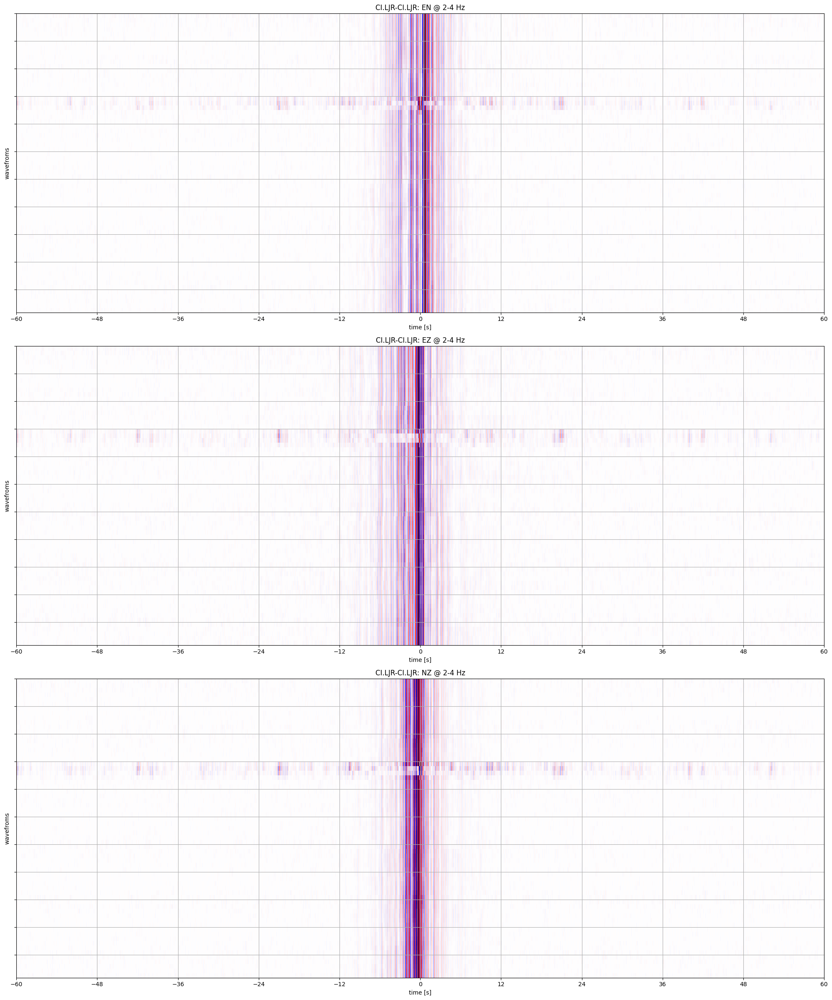

In [9]:
tick_inc=6
t = np.arange(-int(lag), int(lag) + delta, step=int(2 * int(lag) / 10))


fig, ax = plt.subplots(3,1, figsize=(20, 24), sharex=True)
for ncmp, ccomp in enumerate(enz_system):
    cax = ax[ncmp].matshow(bpuu[:, ncmp], cmap="seismic", extent=[-lag, lag, nev , 0], aspect="auto",vmin=-1, vmax=1)
    ax[ncmp].set_title(f"{src}-{rec}: {ccomp} @ {fmin}-{fmax} Hz")
    fig.colorbar = (cax, ax[ncmp].images)
    
    ax[ncmp].set_xlabel("time [s]")
    ax[ncmp].set_ylabel("wavefroms")
    ax[ncmp].set_xticks(t)
    ax[ncmp].set_yticks(np.arange(0, nev, step=tick_inc))
    ax[ncmp].set_yticklabels((ev[0:nev:tick_inc]))
    ax[ncmp].xaxis.set_ticks_position("bottom")
    ax[ncmp].grid(True)
    
plt.tight_layout()
plt.show()

#outfname=f"{netst}_stack_{cctype}_{fmin}-{fmax}Hz.png"
#fig.savefig(outfname, format="png", dpi=200)
#plt.close()

tick_inc=6
t = np.arange(-int(lag), int(lag) + delta, step=1)

fig, ax = plt.subplots(3,1, figsize=(20, 24), sharex=True)
for ncmp, ccomp in enumerate(enz_system):
    cax = ax[ncmp].matshow(bpuu[:, ncmp], cmap="seismic", extent=[-lag, lag, nev , 0], aspect="auto",vmin=-1/2, vmax=1/2)
    ax[ncmp].set_title(f"{src}-{rec}:  {ccomp} @ {fmin}-{fmax} Hz")
    fig.colorbar = (cax, ax[ncmp].images)
    
    ax[ncmp].set_xlabel("time [s]")
    ax[ncmp].set_ylabel("wavefroms")
    ax[ncmp].set_xticks(t)
    ax[ncmp].set_yticks(np.arange(0, nev, step=tick_inc))
    ax[ncmp].set_yticklabels((ev[0:nev:tick_inc]))
    ax[ncmp].xaxis.set_ticks_position("bottom")
    ax[ncmp].grid(True)
    ax[ncmp].set_xlim(-20,20)

plt.tight_layout()
plt.show()

#outfname=f"{netst}_stack_{cctype}_{fmin}-{fmax}Hz.png"
#fig.savefig(outfname, format="png", dpi=200)
#plt.close()

In [10]:
# slide window for cc
#from scipy.signal import hilbert

window_len=1/fmin*6
print("window length (sec)", window_len)
# Parameters
window_size = int(window_len / delta)  # Size of the moving window
print("window size (npts)", window_size)

nstep=window_size//10
window_num = (len(bpref[ncmp]) - window_size)//nstep + 1
print("window number", window_num)


ccmatrix=np.zeros((num_cmp, nev, window_num))
for ncmp, comp in enumerate(enz_system):
    print("Component: ", comp)
    
    tvec=ref_tvec    
    time_series = bpref[ncmp]
    time_series = time_series - np.mean(time_series)
    envelopes = time_series**2
    print("data length", len(time_series))
    
    for tn in range(nev):
        time_series2 = bpuu[tn, ncmp]
        time_series2 = time_series2 - np.mean(time_series2)
        envelopes2 = time_series2**2
        
        # fig, ax= plt.subplots(2, figsize=(20, 4))
        # ax[0].set_title(f"{comp} @ {fmin}-{fmax} Hz")
        # ax[0].plot(tvec, time_series ,label=ref_span[0])
        # ax[0].plot(tvec, time_series2, ls='--',  alpha=0.5, label=scf_span[tn])
        # ax[1].plot(tvec, envelopes)
        # ax[1].plot(tvec, envelopes2, ls='--', alpha=0.5)
        # ax[1].set_yscale("log")
        # ax[1].set_ylim(1e-6,10)
        # ax[1].set_xlim(-lag,lag)
        # ax[0].set_xlim(-lag,lag)
        # ax[0].legend()


        # Compute moving window cross-correlation
        correlations = []
        for i in np.arange(0, len(time_series)-window_size, nstep):
            # Extract segments of the time series
            segment1 = time_series[i :i+window_size]
            segment2 = time_series2[i :i+window_size]
            # Compute cross-correlation
            cross_corr = np.corrcoef(segment1, segment2)[0,1]
            #print(f'window {i} {i} {i+window_size}, {cross_corr:.2f}')
            correlations.append(cross_corr)
        
        ccmatrix[ncmp, tn]=correlations
        
        # plt.figure(figsize=(20, 2))
        # plt.ylim(0,1)
        # plt.plot(correlations, label='value')
        # plt.plot(np.abs(correlations),'--', label='abs value')
        # plt.xlim(0, window_num)
        # plt.xlabel('window (i)')
        # plt.ylabel('Average Cross-correlation')
        # plt.title('Average Cross-correlation Across Segments2')
        # plt.legend()
        # plt.grid(True)
        # plt.show()


window length (sec) 3.0
window size (npts) 60
window number 391
Component:  EN
data length 2401


Component:  EZ
data length 2401
Component:  NZ
data length 2401


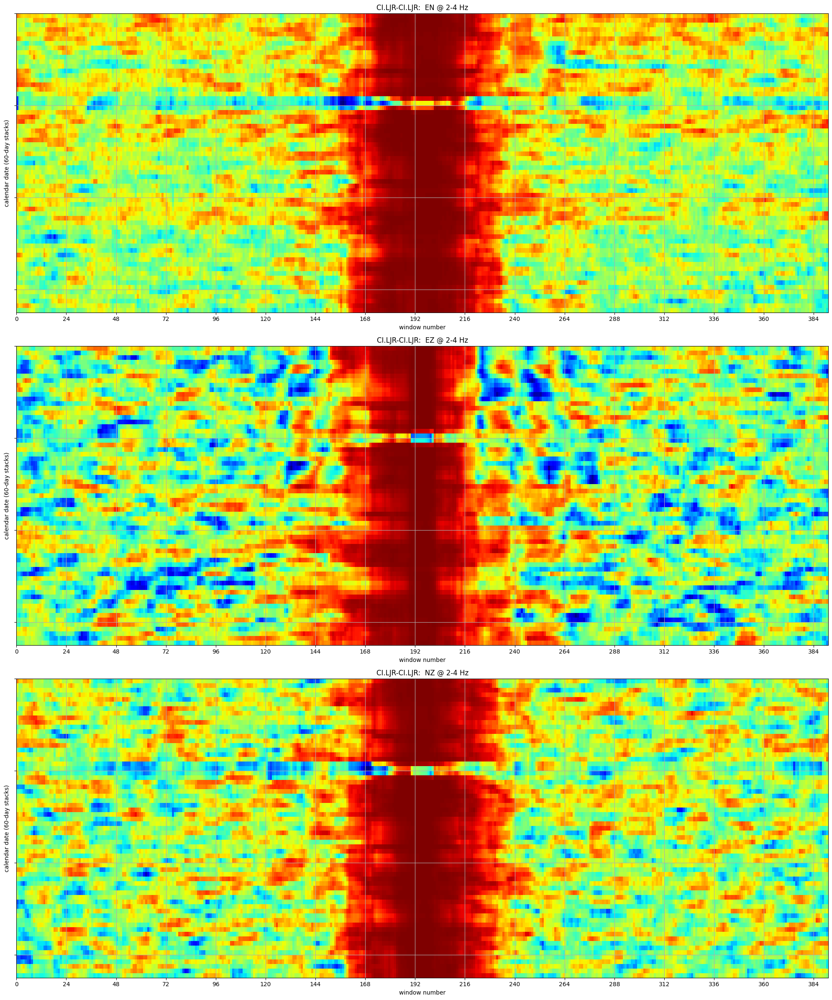

In [11]:
tick_inc=20
t = np.arange(0, window_num, nstep*4)

fig, ax = plt.subplots(3,1, figsize=(20, 24), sharex=True)
for ncmp, ccomp in enumerate(enz_system):
    cax = ax[ncmp].matshow(ccmatrix[ncmp], cmap="jet", extent=[0, window_num, nev , 0], aspect="auto",)
    ax[ncmp].set_title(f"{src}-{rec}:  {ccomp} @ {fmin}-{fmax} Hz")
    fig.colorbar = (cax, ax[ncmp].images)
    
    ax[ncmp].set_xlabel("window number")
    ax[ncmp].set_ylabel("calendar date (60-day stacks)")
    ax[ncmp].set_xticks(t)
    ax[ncmp].set_yticks(np.arange(0, nev, step=tick_inc))
    ax[ncmp].set_yticklabels((ev[0:nev:tick_inc]))
    ax[ncmp].xaxis.set_ticks_position("bottom")
    ax[ncmp].grid(True)


plt.tight_layout()
plt.show()

#outfname=f"{netst}_stack_{cctype}_{fmin}-{fmax}Hz.png"
#fig.savefig(outfname, format="png", dpi=200)
#plt.close()

In [12]:
print(ccmatrix.shape)
print(bpref.shape)
print(bpuu.shape)
correspond_tlag = ((np.where(ccmatrix[0,0,:])[0] * (nstep)) * delta + window_len/2) - lag
print(f'window size: {window_size} (npt); sliding step: {nstep} (npt);\ncorrespond_tlag: {correspond_tlag}')


print(type(correspond_tlag))

(3, 65, 391)
(3, 2401)
(65, 3, 2401)
window size: 60 (npt); sliding step: 6 (npt);
correspond_tlag: [-58.5 -58.2 -57.9 -57.6 -57.3 -57.  -56.7 -56.4 -56.1 -55.8 -55.5 -55.2
 -54.9 -54.6 -54.3 -54.  -53.7 -53.4 -53.1 -52.8 -52.5 -52.2 -51.9 -51.6
 -51.3 -51.  -50.7 -50.4 -50.1 -49.8 -49.5 -49.2 -48.9 -48.6 -48.3 -48.
 -47.7 -47.4 -47.1 -46.8 -46.5 -46.2 -45.9 -45.6 -45.3 -45.  -44.7 -44.4
 -44.1 -43.8 -43.5 -43.2 -42.9 -42.6 -42.3 -42.  -41.7 -41.4 -41.1 -40.8
 -40.5 -40.2 -39.9 -39.6 -39.3 -39.  -38.7 -38.4 -38.1 -37.8 -37.5 -37.2
 -36.9 -36.6 -36.3 -36.  -35.7 -35.4 -35.1 -34.8 -34.5 -34.2 -33.9 -33.6
 -33.3 -33.  -32.7 -32.4 -32.1 -31.8 -31.5 -31.2 -30.9 -30.6 -30.3 -30.
 -29.7 -29.4 -29.1 -28.8 -28.5 -28.2 -27.9 -27.6 -27.3 -27.  -26.7 -26.4
 -26.1 -25.8 -25.5 -25.2 -24.9 -24.6 -24.3 -24.  -23.7 -23.4 -23.1 -22.8
 -22.5 -22.2 -21.9 -21.6 -21.3 -21.  -20.7 -20.4 -20.1 -19.8 -19.5 -19.2
 -18.9 -18.6 -18.3 -18.  -17.7 -17.4 -17.1 -16.8 -16.5 -16.2 -15.9 -15.6
 -15.3 -15.  -14.7 -14.4 -

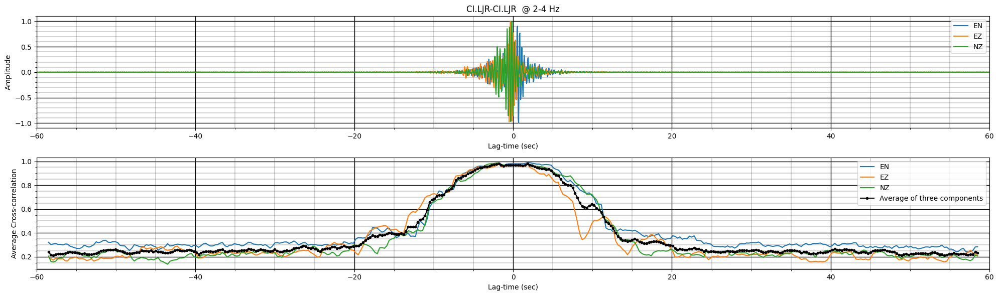

In [13]:
import matplotlib as mpl
fig,ax = plt.subplots(2,figsize=(20, 6))

mean_ccmatrix=np.zeros((num_cmp, window_num))
for ncmp, ccomp in enumerate(enz_system):
    mean_ccmatrix[ncmp]=np.mean(ccmatrix[ncmp], axis=0)
    ax[0].plot(ref_tvec, bpref[ncmp], label=ccomp)
    ax[1].plot(correspond_tlag, mean_ccmatrix[ncmp], label=ccomp)
ax[1].plot(correspond_tlag, np.mean(mean_ccmatrix[:], axis=0) , label='Average of three components', color='k',marker='.', )    

ax[0].set_title(f"{src}-{rec}  @ {fmin}-{fmax} Hz")

ax[0].set_ylabel('Amplitude')  
ax[1].set_ylabel('Average Cross-correlation')

for k in range(2):
    ax[k].set_xlim(ref_tvec[0], ref_tvec[-1])
    ax[k].set_xlabel('Lag-time (sec)')
    ax[k].grid(True)
    ax[k].legend(loc='upper right')
    ax[k].get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax[k].get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax[k].grid( which='major', color='k', linewidth=1.0)
    ax[k].grid( which='minor', color='k', linewidth=0.25)
plt.tight_layout()


In [14]:
def fold_arr(cc):
    folded_cc = []
    n = len(cc) // 2  # Assuming cc length is 121, n = 60

    for i in range(n + 1):  # Iterate from 0 to 60
        folded_value = (cc[n + i] + cc[n - i]) / 2  # Average of cc[lag] and cc[-lag]
        folded_cc.append(folded_value)

    return folded_cc


def find_index_below_threshold(arr, threshold=0.8):
    for i, value in enumerate(arr):
        if value < threshold:
            return i
    return None  # If no value below threshold is found


In [15]:
cc_thred = 0.8
fold_cc=fold_arr(np.mean(mean_ccmatrix[:], axis=0))
index = find_index_below_threshold(fold_cc, cc_thred)
print(index, fold_cc[index])
coda_tbeg =  (1/fmin) * 3
coda_tend = correspond_tlag[len(fold_cc)-1+index]

25 0.7873648140607937


391 196


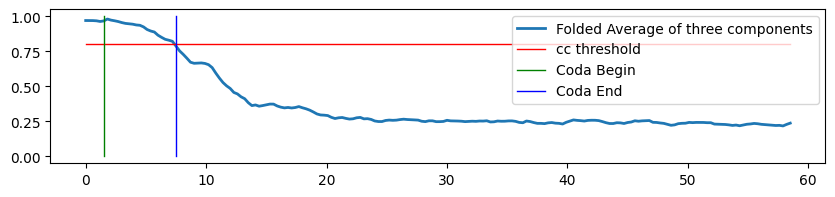

In [16]:
plt.figure(figsize=(10, 2))

print(len((np.mean(mean_ccmatrix[:], axis=0))),len(fold_cc))
plt.plot(correspond_tlag[len(fold_cc)-1:], fold_cc, label='Folded Average of three components', lw=2)
plt.plot([correspond_tlag[len(fold_cc)-1], correspond_tlag[-1]], [cc_thred, cc_thred] , label='cc threshold', color='r', lw=1 )
plt.plot([coda_tbeg, coda_tbeg], [0, 1] , label='Coda Begin', color='g', lw=1 )
plt.plot([coda_tend, coda_tend], [0, 1] , label='Coda End', color='b', lw=1 )
plt.legend(loc='upper right')

We got the coda window and the bandpass scfs and reference by the steps above. Now, we are calculating dv/v and attenuation based on these waveforms and parameters. Eventually, we save results into a pandas dataframe.

In [17]:
from noisepy.monitoring.monitoring_utils import *     # modules for monitoring utils
from noisepy.monitoring.monitoring_methods import stretching
#from noisepy.monitoring.attenuation_utils import *    # modules for attenuation monitoring
from noisepy.seis import noise_module


In [18]:
config_monito = ConfigParameters_monitoring() # default config parameters which can be customized

# --- parameters for measuring velocity changes ---
# pre-defined group velocity to window direct and code waves
config_monito.vmin = 2.0  # minimum velocity of the direct waves -> start of the coda window
config_monito.lwin = 10.0  # window length in sec for the coda waves

# basic parameters
config_monito.freq = [fmin, fmax]  # targeted frequency band for waveform monitoring
nfreq = len(config_monito.freq) - 1
config_monito.onelag = False  # make measurement one one lag or two
config_monito.norm_flag = True  # whether to normalize the cross-correlation waveforms
config_monito.do_stretch = True  # use strecthing method or not

# parameters for stretching method
config_monito.epsilon = 0.02  # limit for dv/v (in decimal)
config_monito.nbtrial = 100  # number of increment of dt [-epsilon,epsilon] for the streching

# coda window 
config_monito.coda_tbeg = coda_tbeg  # begin time (sec) of the coda window in lag time
config_monito.coda_tend = coda_tend  # end time (sec) of the coda window in lag time

# --- parameters for measuring attenuation ---
config_monito.smooth_winlen = (1/fmin)*2    # smoothing window length
config_monito.cvel = 2.6                    # Rayleigh wave velocities over the freqency bands
config_monito.atten_tbeg = coda_tbeg
config_monito.atten_tend = coda_tend
config_monito.intb_interval_base = 0.01 

In [19]:
timespans = scf_span
sta_pair = src, rec

In [20]:
import yaml
from noisepy.seis.io.datatypes import ConfigParameters,  StackMethod

def load_config(config_file):
    with open(config_file, 'r') as file:
        config = yaml.safe_load(file)
    return config

# load config of the stackstore data products
config =  ConfigParameters()
config_file = 'config.yml'
config = load_config(config_file)
print(config)


{'acorr_only': True, 'cc_len': 600, 'cc_method': 'xcorr', 'channels': ['HHE', 'HHN', 'HHZ', 'BHE', 'BHN', 'BHZ'], 'client_url_key': 'IRIS', 'correction': False, 'correction_csv': None, 'down_list': False, 'end_date': '2022-12-31T00:00:00Z', 'freq_norm': 'rma', 'freqmax': 10.0, 'freqmin': 0.08, 'inc_hours': 24, 'keep_substack': False, 'lamax': 42.0, 'lamin': 32.0, 'lomax': -114.0, 'lomin': -124.0, 'max_over_std': 10, 'maxlag': 60, 'ncomp': 3, 'net_list': ['CI'], 'respdir': None, 'rm_resp': False, 'rm_resp_out': 'VEL', 'rotation': True, 'samp_freq': 20.0, 'single_freq': False, 'smooth_N': 12000, 'smoothspect_N': 1, 'stack_method': 'linear', 'start_date': '2016-01-01T00:00:00Z', 'stations': ['DLA', 'LAF', 'LJR'], 'stations_file': None, 'stationxml': False, 'step': 600.0, 'storage_options': {}, 'substack': False, 'substack_len': 600, 'time_norm': 'one_bit', 'xcorr_only': False}


In [21]:
# calculate the number of segments
num_chunk = len(timespans)

npts_one_segmt = int(2 * maxlag * samp_freq) + 1
num_segmts = 1
print(f"there are ",num_segmts," segments/windows and ",npts_one_segmt," points in each segments and overall",num_chunk," number of time chunks")

there are  1  segments/windows and  2401  points in each segments and overall 65  number of time chunks


In [22]:
nccomp = num_cmp
cc_time  = np.zeros( (num_chunk * num_segmts), dtype=np.float32)
print(cc_time.shape)

(65,)


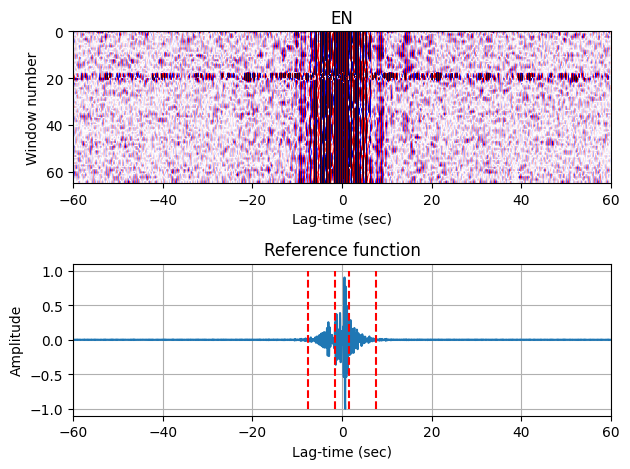

In [23]:
# in single-station cross-component case : enz_system = [ "EN", "EZ", "NZ"]
freq1=config_monito.freq[0]
freq2=config_monito.freq[1]
dt=1/samp_freq

## Choose a targeted component
comp = "EN"

## using the stackstore ref to replace the stacking here for long-term monitoring
tref=bpref[0]
tcur=bpuu[:,0,:]


# Plot
fig,ax=plt.subplots(2,1)
ax[0].imshow(tcur,extent=[-maxlag, maxlag, nev, 0], aspect='auto',vmin=-0.01,vmax=0.01, cmap='seismic')
ax[0].set_title(comp)
ax[0].set_xlabel('Lag-time (sec)')
ax[0].set_ylabel('Window number')

ax[1].set_xlim(-maxlag, maxlag);ax[1].grid(True)
ax[1].plot(ref_tvec, tref)
ax[1].set_title('Reference function')
ax[1].set_xlabel('Lag-time (sec)')
ax[1].set_ylabel('Amplitude')

ax[1].plot([coda_tbeg, coda_tbeg], [-1, 1], 'r--', label='Coda Begin')
ax[1].plot([-coda_tbeg, -coda_tbeg], [-1, 1], 'r--', label='Coda Begin')
ax[1].plot([coda_tend, coda_tend], [-1, 1], 'r--', label='Coda End')
ax[1].plot([-coda_tend, -coda_tend], [-1, 1], 'r--', label='Coda End')

plt.tight_layout()
plt.show()

In [24]:
# define the window index for positive and negative lag time
pwin_indx, nwin_indx = window_indx_def(npts_one_segmt, config_monito.coda_tbeg, config_monito.coda_tend, dt)

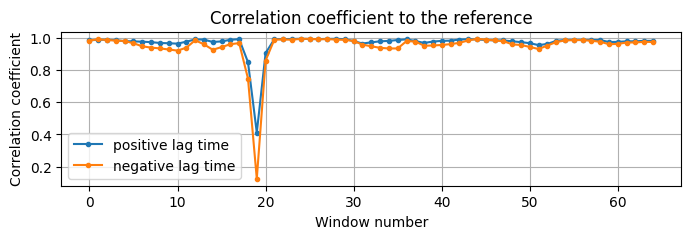

In [25]:
nwin=nev

# Calculate the correlation coefficient between the coda and the reference coda
pcor_cc = np.zeros(shape=(nwin), dtype=np.float32)
ncor_cc = np.zeros(shape=(nwin), dtype=np.float32)
for i in range(nwin):
  pcor_cc[i] = np.corrcoef(tref[pwin_indx], tcur[i, pwin_indx])[0, 1]
  ncor_cc[i] = np.corrcoef(tref[nwin_indx], tcur[i, nwin_indx])[0, 1]

# Plot
plt.figure(figsize=(8,2));plt.grid(True)
plt.plot(pcor_cc, '.-', label='positive lag time')
plt.plot(ncor_cc, '.-', label='negative lag time')
plt.title('Correlation coefficient to the reference')
plt.ylabel('Correlation coefficient')
plt.xlabel('Window number')
plt.legend()

In [26]:
# initializing arrays
dvv_stretch = np.zeros(shape=(nwin, 4), dtype=np.float32)

# define the parameters for stretching
para=dict()
para["t"] = np.arange(-maxlag, maxlag+dt,dt)
para["freq"] = [freq1, freq2]
para["twin"] = [config_monito.coda_tbeg, config_monito.coda_tend]
para["dt"] = dt

In [27]:
print( src, rec, nwin)
nccomp=len(enz_system)

# initializing arrays
all_dvv= np.zeros(shape=(nccomp, nwin), dtype=np.float32)
all_err= np.zeros(shape=(nccomp, nwin), dtype=np.float32)
results_dvv= np.zeros(shape=(nwin), dtype=np.float32)
results_err= np.zeros(shape=(nwin), dtype=np.float32)
   
for icomp in range(0,nccomp):
    comp = enz_system[icomp]   
    
    for ii in range(nwin):
        # casual and acasual lags for both ref and cur waveforms
        pcur = bpuu[ii, icomp , pwin_indx]
        ncur = bpuu[ii, icomp, nwin_indx]
        pref = bpref[icomp, pwin_indx]
        nref = bpref[icomp, nwin_indx]
        # functions working in time domain
        if config_monito.do_stretch:
            (
                dvv_stretch[ii, 0],
                dvv_stretch[ii, 1],
                cc,
                cdp,
            ) = stretching(pref, pcur, config_monito.epsilon, config_monito.nbtrial, para)
            (
                dvv_stretch[ii, 2],
                dvv_stretch[ii, 3],
                cc,
                cdp,
            ) = stretching(nref, ncur, config_monito.epsilon, config_monito.nbtrial, para)
    all_dvv[icomp]=(dvv_stretch[:, 0]+dvv_stretch[:, 2])/2.0
    all_err[icomp]=np.sqrt(dvv_stretch[:, 1]**2+dvv_stretch[:, 3]**2)
    print('component: ',comp,' completed. ')
    results_dvv+=all_dvv[icomp]
    results_err+=all_err[icomp]**2
results_dvv=results_dvv/nccomp
results_err=np.sqrt(results_err)
print(all_dvv.shape, results_dvv.shape, )
nwin=len(results_dvv)
            

CI.LJR CI.LJR 65
component:  EN  completed. 
component:  EZ  completed. 
component:  NZ  completed. 
(3, 65) (65,)


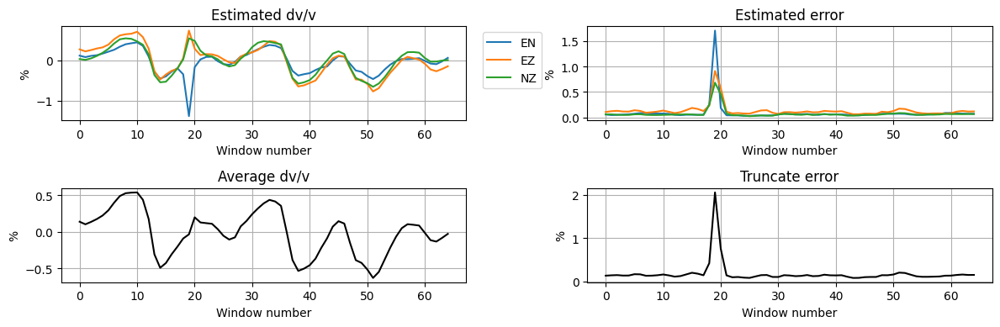

In [28]:
fig,ax=plt.subplots(2,2,figsize=(12,4))
ax[0,0].plot(all_dvv.T)
ax[0,0].legend(enz_system, loc='upper right', bbox_to_anchor=(1.2,1))
ax[0,0].grid(True)
ax[0,0].set_title('Estimated dv/v')
ax[0,0].set_xlabel('Window number')
ax[0,0].set_ylabel('%')

ax[0,1].plot(all_err.T);ax[0,1].grid(True);#ax[0,1].set_ylim(0,100)
ax[0,1].set_title('Estimated error')
ax[0,1].set_xlabel('Window number')
ax[0,1].set_ylabel('%')

ax[1,0].plot(results_dvv.T, 'k');ax[1,0].grid(True)
ax[1,0].set_title('Average dv/v')
ax[1,0].set_xlabel('Window number')
ax[1,0].set_ylabel('%')

ax[1,1].plot(results_err.T, 'k');ax[1,1].grid(True)
ax[1,1].set_title('Truncate error')
ax[1,1].set_xlabel('Window number')
ax[1,1].set_ylabel('%')

plt.tight_layout()

### Step 5: Measure attenuation parameter -- intrinsic absorption parameter b
Preparing mean-squared values in time seires for measuring intrinsic parameter. We follow these steps:
* Prepare smoothed mean-squared data (msv) in a given frequency band,
* Get the average msv (msv_mean) from all components, and also the symmetric msv (fmsv_mean)
* Measure intrinsic absorption parameter b (results_intb) and transfer it to intrinsic Q (Qi)

temp1: (65, 2401), msv (3, 65, 2401), msv_temp (65, 2401)


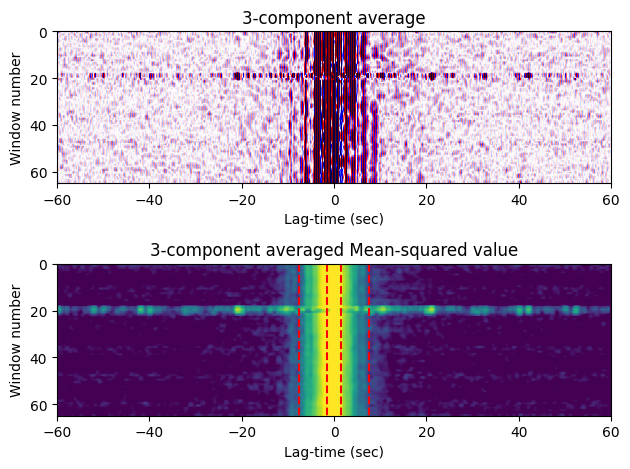

In [29]:
from matplotlib.colors import LogNorm
#enz_system = ["EN", "EZ", "NZ"]
nccomp=len(enz_system)
winlen=config_monito.smooth_winlen

# Restore calendar time from cc_time array 
win_time=[]

# initializing arrays 
tcur_temp1 = np.zeros(shape=(nev, npts_one_segmt))
msv=np.zeros((nccomp, nev, npts_one_segmt))
msv_temp=np.zeros((nev, npts_one_segmt))
print(f'temp1: {tcur_temp1.shape}, msv {msv.shape}, msv_temp {msv_temp.shape}')

# get all components average
for icomp in range(0,nccomp):
    comp = enz_system[icomp]
    
    # bandpass filter the data.
    tcur_temp2 = np.zeros(shape=(nev, npts_one_segmt))
    for iev in range(nev):
        tcur_temp2[iev]=bpuu[iev, icomp]
        win_time.append((timespans[i])) #.strftime("%Y-%m-%dT%H:%M"))
        #print((timespans[i])) #.strftime("%Y-%m-%dT%H:%M"))
        
        para = { 'winlen':winlen, 'dt':dt , 'npts': len(tcur_temp2[iev])}
        msv[icomp,iev] = get_smooth(tcur_temp2[iev], para)
        #print(tcur_temp2.shape, msv[icomp].shape)

        tcur_temp1[iev] = tcur_temp1[iev] + tcur_temp2[iev]
        
    msv_temp = msv_temp + msv[icomp]

tcur_avef = np.zeros(shape=(nwin, npts_one_segmt))
msv_mean = np.zeros(shape=(nwin, npts_one_segmt))
#print(nwin, tcur_avef.shape, msv.shape, msv_mean.shape)

tcur_avef = tcur_temp1[:nwin,:]/nccomp
msv_mean = msv_temp[:nwin,:]/nccomp
msv_mean = msv_mean/np.max(msv_mean)
del  tcur_temp1, tcur_temp2, msv_temp 

fig,ax=plt.subplots(2,1)
ax[0].imshow(tcur_avef, extent=[-maxlag, maxlag, nev,0],aspect='auto',vmin=-0.01,vmax=0.01, cmap='seismic')
ax[0].set_title(str(nccomp)+"-component average")
ax[0].set_ylabel('Window number')
ax[0].set_xlabel('Lag-time (sec)')
ax[1].imshow(msv_mean, extent=[-maxlag, maxlag, nev,0],aspect='auto', norm=LogNorm(vmin=0.0001, vmax=0.1))
ax[1].set_title(str(nccomp)+'-component averaged Mean-squared value')
ax[1].set_xlabel('Lag-time (sec)')
ax[1].set_ylabel('Window number')
plt.tight_layout()
ax[1].plot([coda_tbeg, coda_tbeg], [0, nev], 'r--', label='Coda Begin')
ax[1].plot([-coda_tbeg, -coda_tbeg], [0, nev], 'r--', label='Coda Begin')
ax[1].plot([coda_tend, coda_tend], [0, nev], 'r--', label='Coda end')
ax[1].plot([-coda_tend, -coda_tend], [0, nev], 'r--', label='Coda end')

    

In [30]:
half_npts=(npts_one_segmt-1)//2
fmsv_mean=np.zeros((nwin,2,half_npts+1))

for ntw in range(nwin):
    sym=get_symmetric(msv_mean[ntw],half_npts)
    fmsv_mean[ntw][0]=np.arange(0, maxlag+dt,dt)
    fmsv_mean[ntw][1]=sym


In [31]:
fnum=1
twinbe=np.ndarray((fnum,nfreq,2))
twinbe[:,:,0]=coda_tbeg
twinbe[:,:,1]=coda_tend

cvel=config_monito.cvel # Rayleigh wave velocities over the freqency bands
vdist=np.zeros((1))     # station distance
mfpx=np.zeros(10)        # mean_free_path search array
intby=np.zeros(60)      # intrinsic_b search array
config_monito.intb_interval_base=0.02 # interval base for a grid-searching process

In [32]:
print(coda_tbeg, coda_tend)

1.5 7.5


In [33]:
def plot_fmsv_multiwindows(freq,wav,fname,twin,pretwin):
    nfreq = len(freq) - 1
    fig, ax = plt.subplots(1,nfreq, figsize=(12,2), sharex=False)

    for fb in range(nfreq):
        fmin=freq[fb]
        fmax=freq[fb+1]
        absy=1 #max(wav[fb], key=abs)
        #ax[fb].plot([wav[0][0],wav[0][-1]],[noise_level[fb],noise_level[fb]],c='blue',marker='.',ls='--', linewidth=2)
        for ncoda in range(len(twin[fb])):
            ax[fb].plot([twin[fb][ncoda][0],twin[fb][ncoda][0]],[-0.1,absy],c='red',ls='-', linewidth=1)
            ax[fb].plot([twin[fb][ncoda][1],twin[fb][ncoda][1]],[-0.1,absy],c='red',ls='-', linewidth=1)
        ax[fb].plot([pretwin[fb][0],pretwin[fb][0]],[-0.1,absy],c='orange',marker='.',ls='--', linewidth=2)
        ax[fb].plot([pretwin[fb][1],pretwin[fb][1]],[-0.1,absy],c='orange',marker='.',ls='--', linewidth=2)
        ax[fb].set_yscale('log', base=10)
        ax[fb].plot(wav[0],wav[fb+1], "k-", linewidth=0.5)
        ax[fb].set_xlim(wav[0][0],500)
        ax[fb].set_xlabel("Time [s]")
        ax[fb].set_ylabel("Amplitude in log-scale")
        ax[fb].set_title( "%s   @%4.2f-%4.2f Hz" % ( fname,fmin,fmax ) )
    fig.tight_layout()
    plt.show()

In [34]:
def plot_fmsv_multiwindows(wav,fname,twin,pretwin):

    plt.imshow(wav[:,1,:], extent=[0, maxlag, nev,0],aspect='auto', norm=LogNorm(vmin=0.0001, vmax=0.1))
    plt.title( "%s   @%4.2f-%4.2f Hz" % ( fname,fmin,fmax ) )
    plt.xlabel('Lag-time (sec)')
    plt.ylabel('Window number')
    plt.tight_layout()
    plt.plot([pretwin[0],pretwin[0]],[0,nev],c='orange',marker='.',ls='--', linewidth=2)
    plt.plot([pretwin[1],pretwin[1]],[0,nev],c='orange',marker='.',ls='--', linewidth=2)
    
    for ncoda in range(len(twin)):
        plt.plot([twin[ncoda][0],twin[ncoda][0]], [0, nev], 'r--', label='Coda Begin')
        plt.plot([twin[ncoda][1], twin[ncoda][1]], [0, nev], 'r--', label='Coda end')


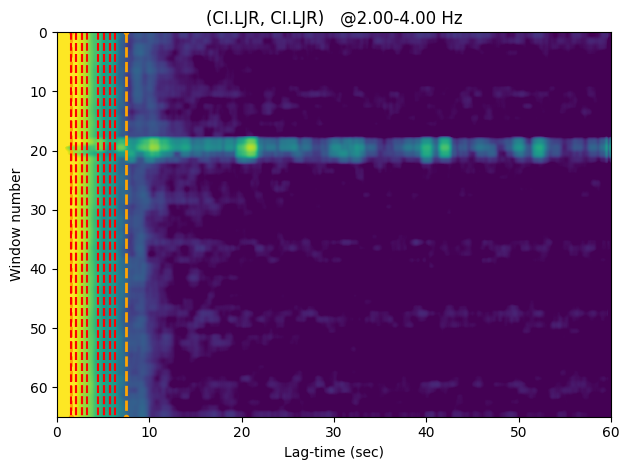

In [35]:

from attenuation_utils_mulwin import *
fnum=1
nwindows=6
new_twin = np.zeros((fnum,nfreq,nwindows,2))
for aa in range(fnum):
    for fb in range(nfreq):
        tb=twinbe[aa,fb,0]
        te=twinbe[aa,fb,1]
        new_twin[aa,fb] = window_determine(tb,te)

plot_fmsv_multiwindows(fmsv_mean,sta_pair,new_twin[fnum-1,nfreq-1], twinbe[fnum-1,nfreq-1])

In [36]:
# getting the sum of squared residuals (SSR) between Eobs and Esyn  
SSR_final=np.zeros((len(mfpx),len(intby)))
SSR=np.zeros((nwin,len(mfpx),len(intby)))

c=cvel
coda_single_band = new_twin[fnum-1,:,:,:]

for ntw in range(nwin):

    fmsv_mean_single = np.zeros((fnum,half_npts+1))
    fmsv_mean_single[0] = fmsv_mean[ntw,1,:]
    
    # parameters for getting the sum of squared residuals (SSR) between Eobs and Esyn 
    para={ 'vdist':vdist, 'npts':npts_one_segmt, 'dt':dt, 'cvel':cvel, \
        'mfp':mfpx, 'intb':intby, 'twin':coda_single_band, 'fmsv':fmsv_mean_single  }
    # call function get_SSR
    SSR_final, mfpx, intby = get_SSR_codawindows(para)

    SSR[ntw]=SSR_final
print(SSR.shape)

(65, 10, 60)


In [37]:
def plot_grid_searching(SSR, twn):
    
    loc=np.where(SSR.T == np.amin(SSR.T))
    print("%4.2f-%4.2f Hz " % (fmin,fmax),"loc ",loc)
    if len(loc[0])>1:
        loc=(loc[0][0],loc[1][0])
    ymin=intby[loc[0]]
    xmin=mfpx[loc[1]]
    print(" intrinsic_b %.2f " % ymin,"mean_free: %.2f " % xmin)

    grid = SSR.T
    im=plt.imshow(grid,extent=(mfpx.min(), mfpx.max(), intby.max(), intby.min()), aspect='auto',cmap = 'GnBu_r',interpolation='none' )
    im.set_clim(1,1.1)
    cb=plt.colorbar(im,extend='max')
    cb.set_label('SSR/SSR_min', rotation=90, labelpad=14)
    plt.title(f"Window No {twn:d}, SSR  @{fmin:.3f}-{fmax:.3f} Hz")
    plt.xlabel("mean free path")
    plt.ylabel("intrinsic_b")
    plt.plot(xmin,ymin,"+", markersize=20, color='red')

    plt.tight_layout() 
    plt.show()     


2.00-4.00 Hz  loc  (array([8]), array([7]))
 intrinsic_b 0.09  mean_free: 1.60 


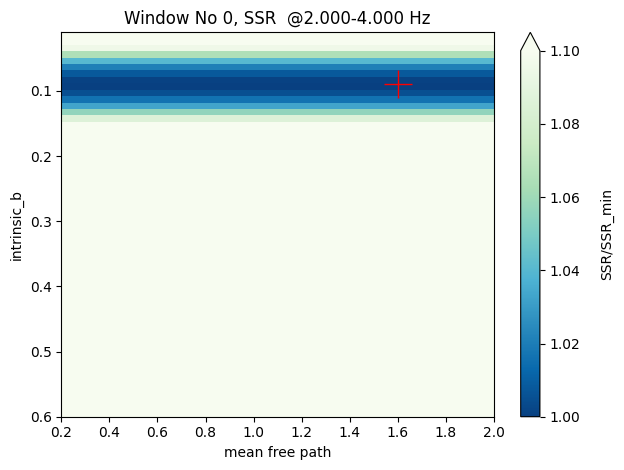

2.00-4.00 Hz  loc  (array([14]), array([5]))
 intrinsic_b 0.15  mean_free: 1.20 


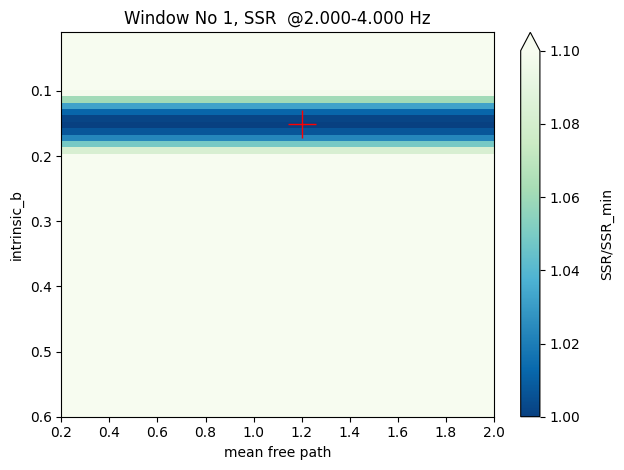

2.00-4.00 Hz  loc  (array([15]), array([9]))
 intrinsic_b 0.16  mean_free: 2.00 


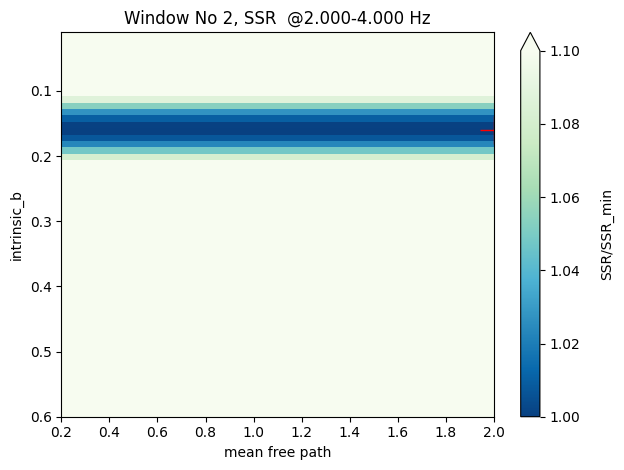

2.00-4.00 Hz  loc  (array([12]), array([6]))
 intrinsic_b 0.13  mean_free: 1.40 


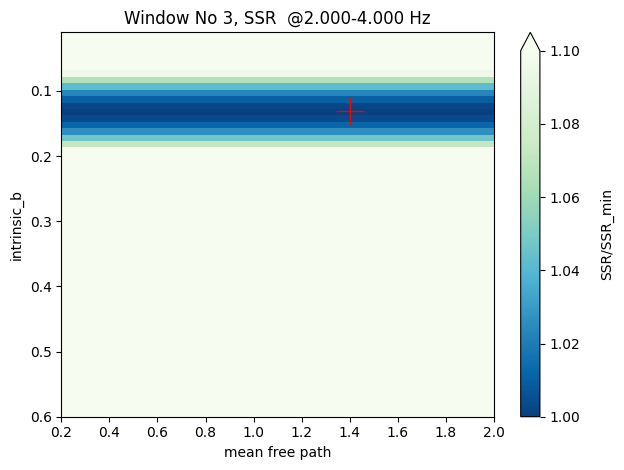

2.00-4.00 Hz  loc  (array([12]), array([8]))
 intrinsic_b 0.13  mean_free: 1.80 


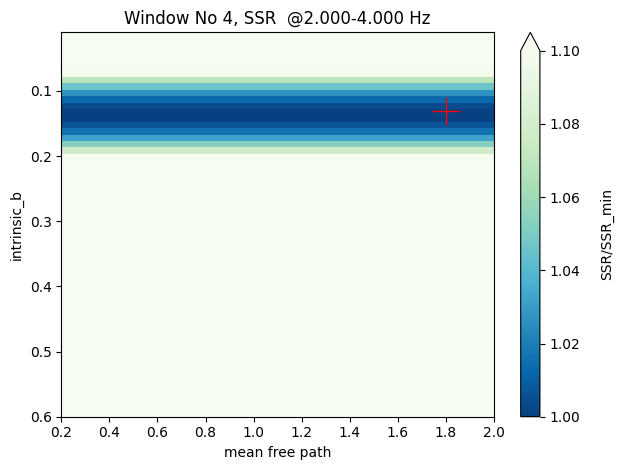

2.00-4.00 Hz  loc  (array([16]), array([6]))
 intrinsic_b 0.17  mean_free: 1.40 


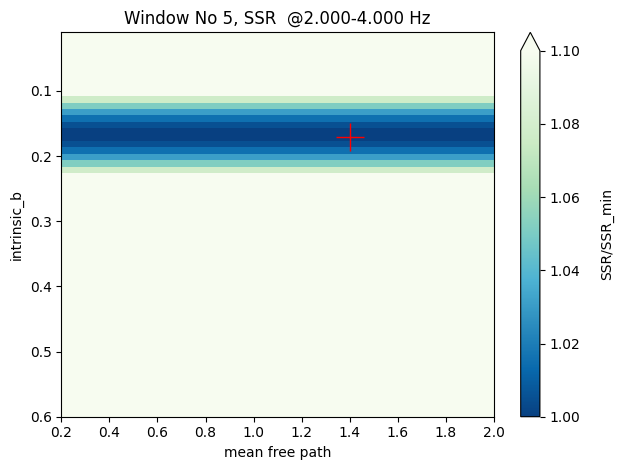

2.00-4.00 Hz  loc  (array([15]), array([9]))
 intrinsic_b 0.16  mean_free: 2.00 


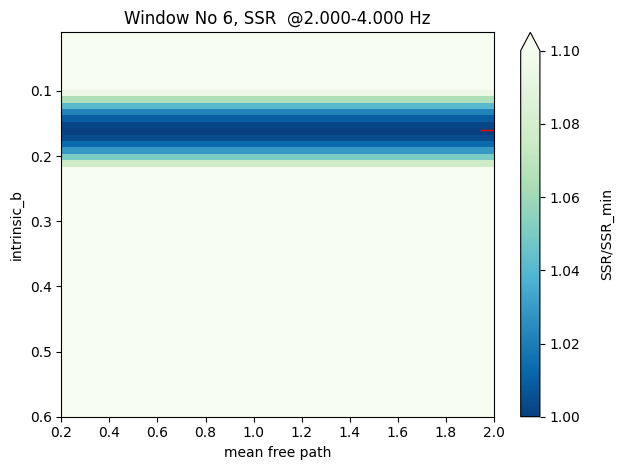

2.00-4.00 Hz  loc  (array([13]), array([8]))
 intrinsic_b 0.14  mean_free: 1.80 


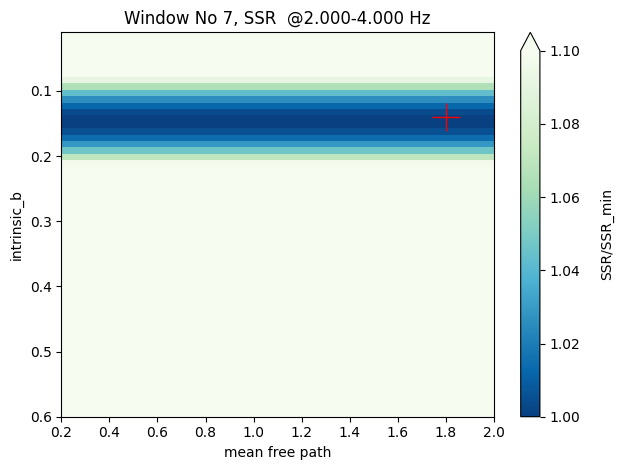

2.00-4.00 Hz  loc  (array([15, 15]), array([6, 8]))
 intrinsic_b 0.16  mean_free: 1.40 


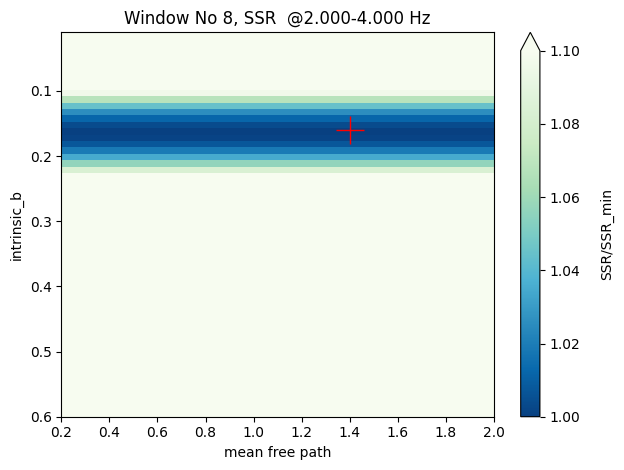

2.00-4.00 Hz  loc  (array([13]), array([6]))
 intrinsic_b 0.14  mean_free: 1.40 


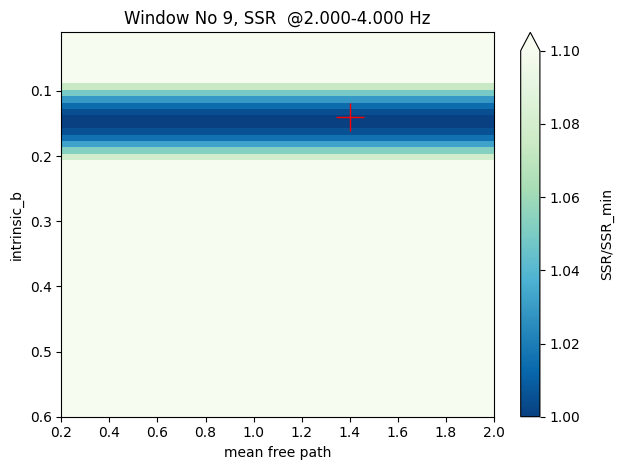

2.00-4.00 Hz  loc  (array([12]), array([7]))
 intrinsic_b 0.13  mean_free: 1.60 


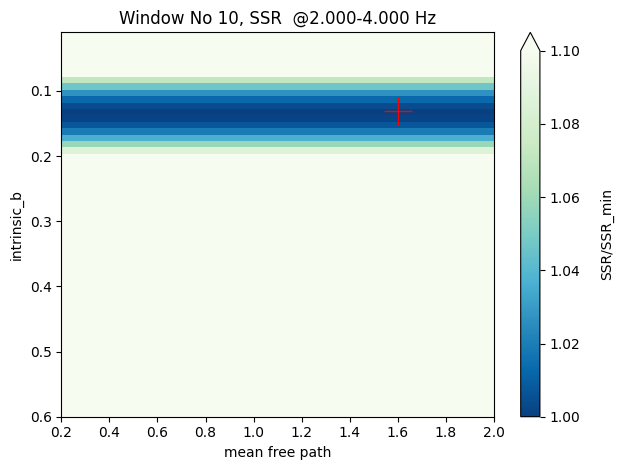

2.00-4.00 Hz  loc  (array([12]), array([9]))
 intrinsic_b 0.13  mean_free: 2.00 


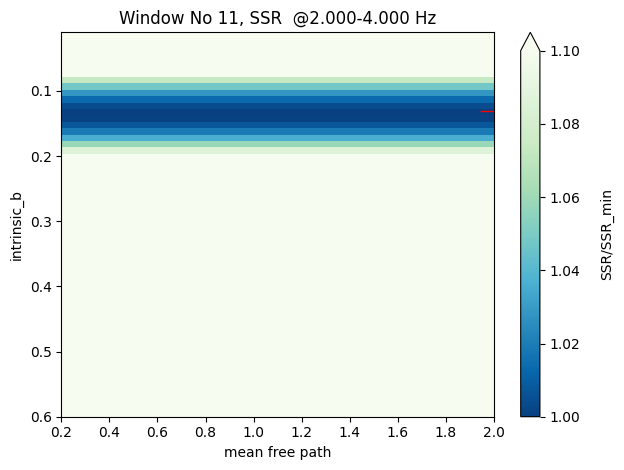

2.00-4.00 Hz  loc  (array([12]), array([7]))
 intrinsic_b 0.13  mean_free: 1.60 


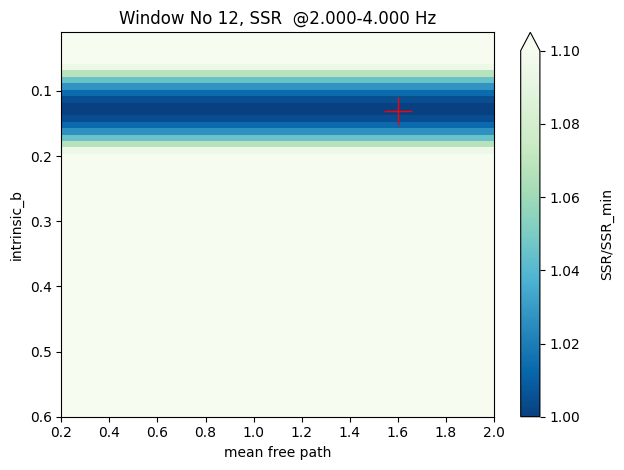

2.00-4.00 Hz  loc  (array([20]), array([9]))
 intrinsic_b 0.21  mean_free: 2.00 


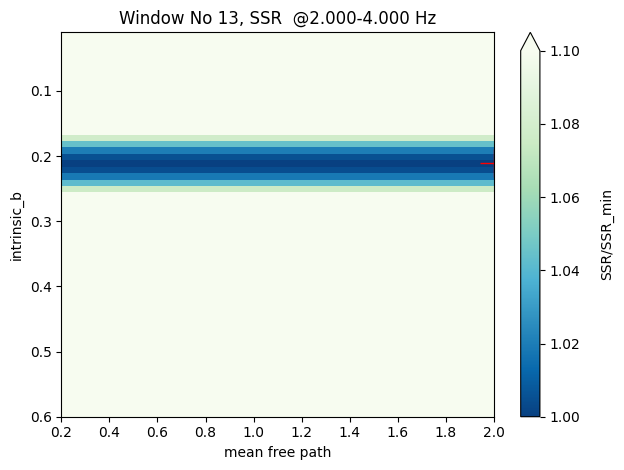

2.00-4.00 Hz  loc  (array([28]), array([7]))
 intrinsic_b 0.29  mean_free: 1.60 


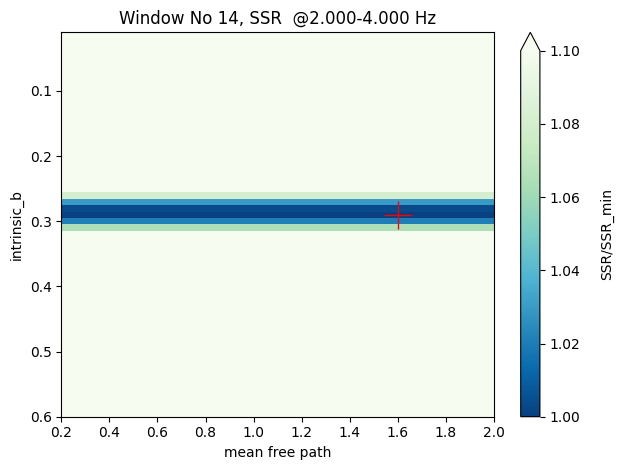

2.00-4.00 Hz  loc  (array([35]), array([9]))
 intrinsic_b 0.36  mean_free: 2.00 


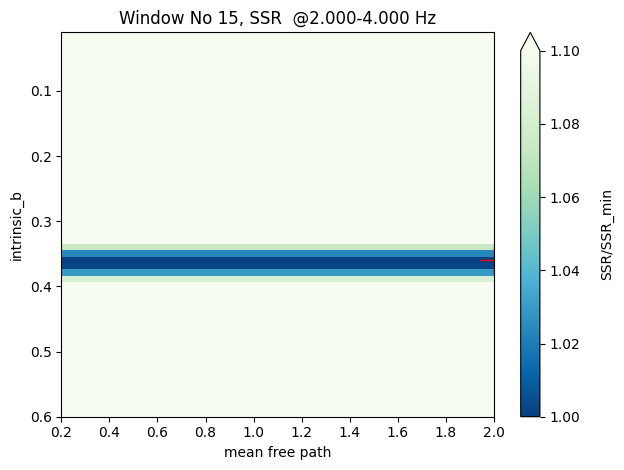

2.00-4.00 Hz  loc  (array([37]), array([7]))
 intrinsic_b 0.38  mean_free: 1.60 


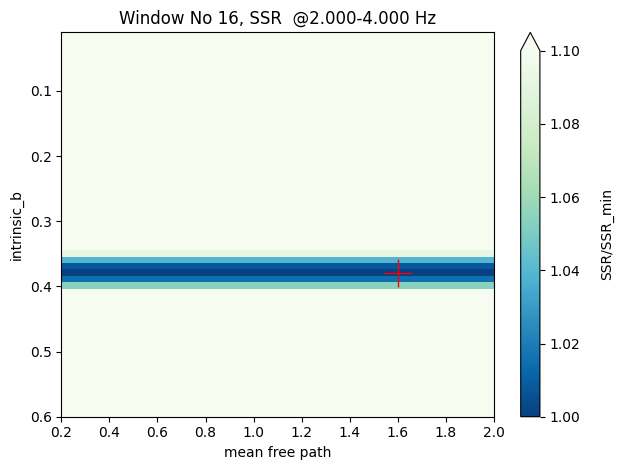

2.00-4.00 Hz  loc  (array([33]), array([7]))
 intrinsic_b 0.34  mean_free: 1.60 


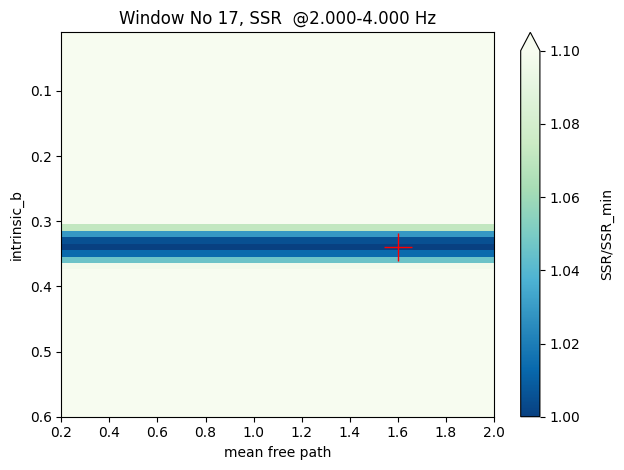

2.00-4.00 Hz  loc  (array([5, 5]), array([7, 8]))
 intrinsic_b 0.06  mean_free: 1.60 


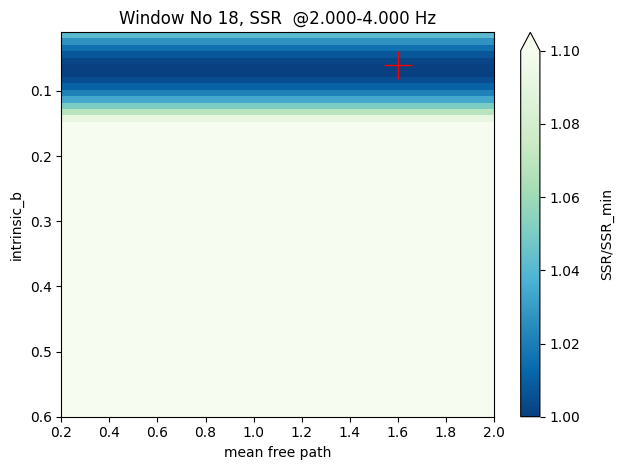

2.00-4.00 Hz  loc  (array([0]), array([0]))
 intrinsic_b 0.01  mean_free: 0.20 


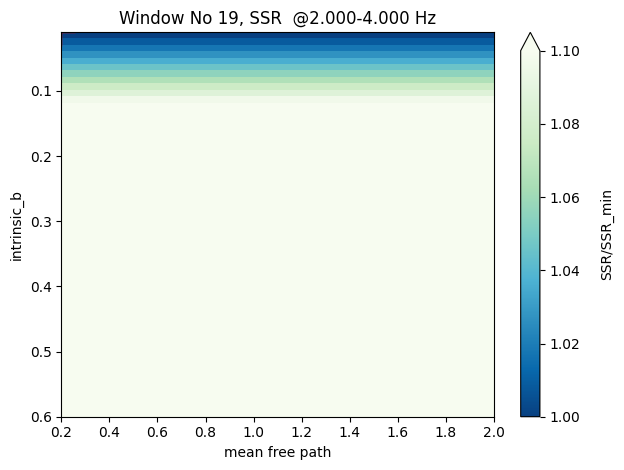

2.00-4.00 Hz  loc  (array([24]), array([0]))
 intrinsic_b 0.25  mean_free: 0.20 


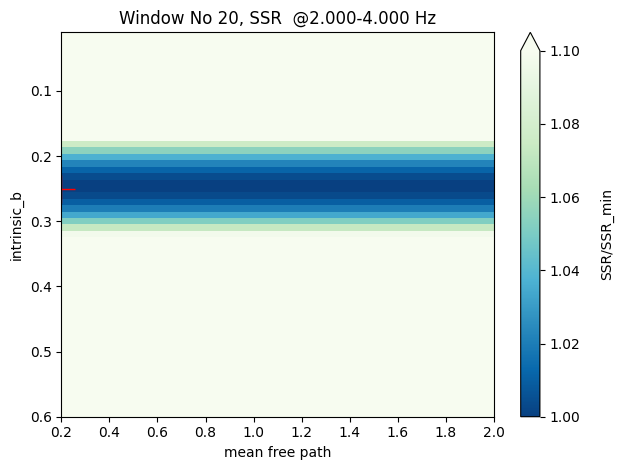

2.00-4.00 Hz  loc  (array([22]), array([9]))
 intrinsic_b 0.23  mean_free: 2.00 


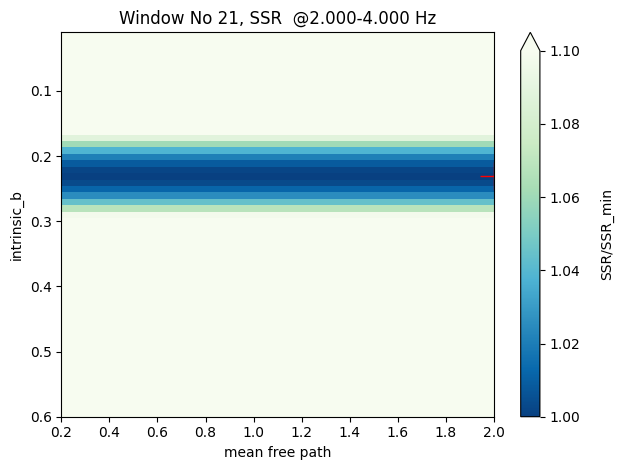

2.00-4.00 Hz  loc  (array([23]), array([5]))
 intrinsic_b 0.24  mean_free: 1.20 


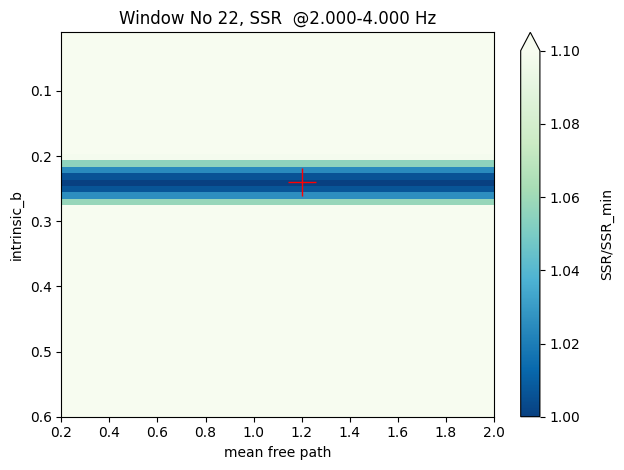

2.00-4.00 Hz  loc  (array([24]), array([9]))
 intrinsic_b 0.25  mean_free: 2.00 


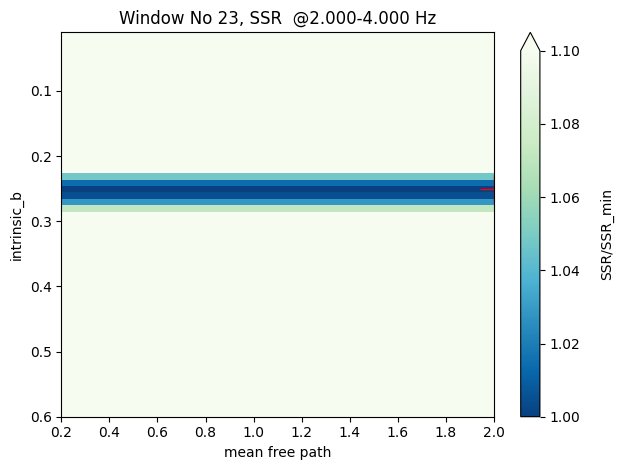

2.00-4.00 Hz  loc  (array([27]), array([7]))
 intrinsic_b 0.28  mean_free: 1.60 


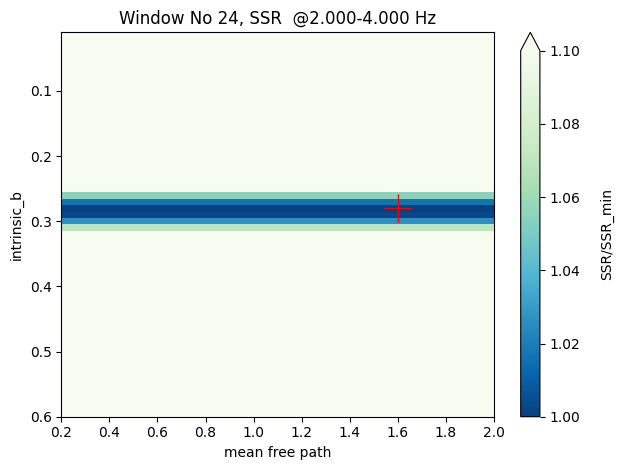

2.00-4.00 Hz  loc  (array([31]), array([5]))
 intrinsic_b 0.32  mean_free: 1.20 


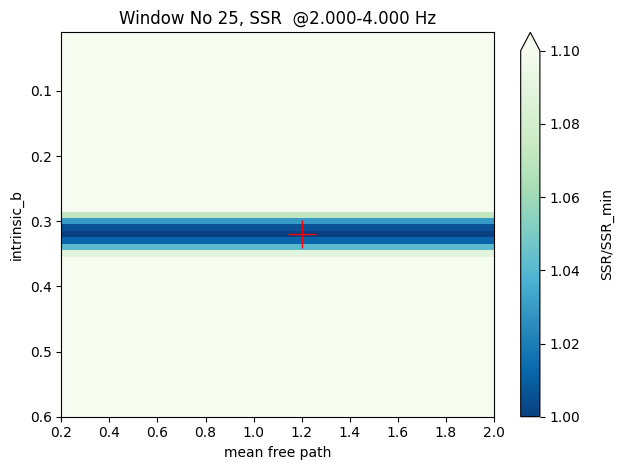

2.00-4.00 Hz  loc  (array([36]), array([9]))
 intrinsic_b 0.37  mean_free: 2.00 


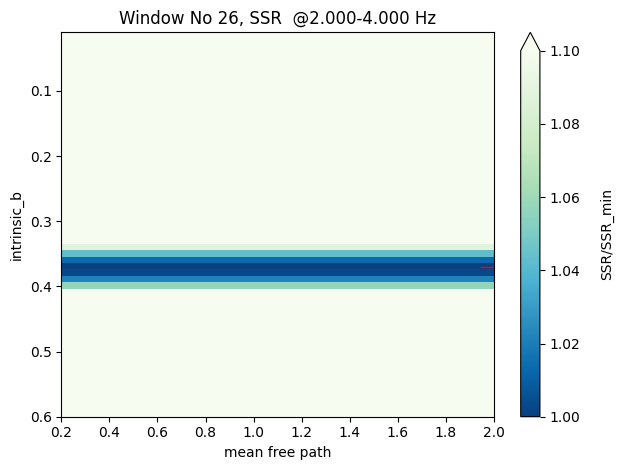

2.00-4.00 Hz  loc  (array([40]), array([9]))
 intrinsic_b 0.41  mean_free: 2.00 


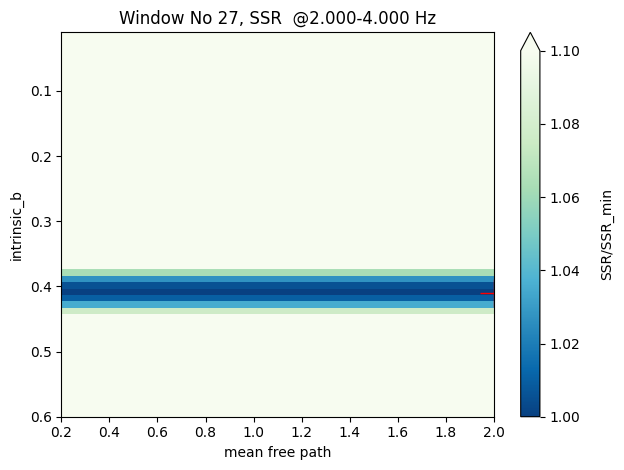

2.00-4.00 Hz  loc  (array([38]), array([9]))
 intrinsic_b 0.39  mean_free: 2.00 


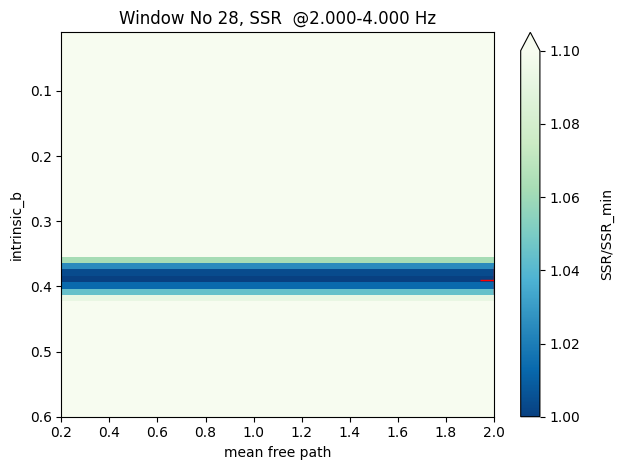

2.00-4.00 Hz  loc  (array([33]), array([9]))
 intrinsic_b 0.34  mean_free: 2.00 


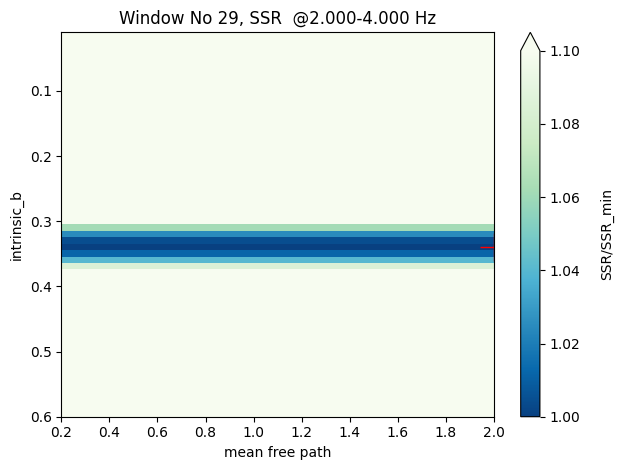

2.00-4.00 Hz  loc  (array([27]), array([5]))
 intrinsic_b 0.28  mean_free: 1.20 


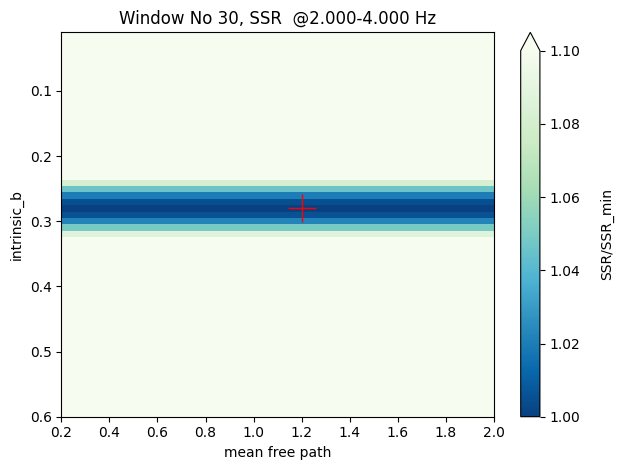

2.00-4.00 Hz  loc  (array([26]), array([6]))
 intrinsic_b 0.27  mean_free: 1.40 


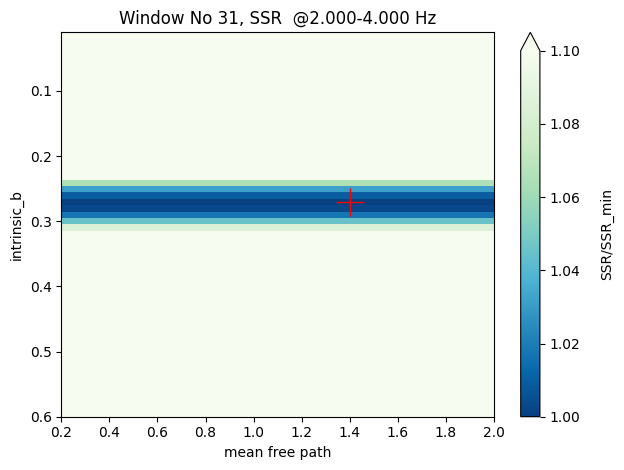

2.00-4.00 Hz  loc  (array([28]), array([3]))
 intrinsic_b 0.29  mean_free: 0.80 


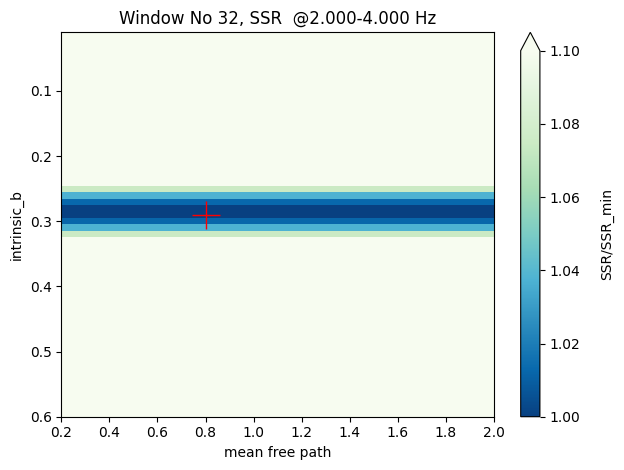

2.00-4.00 Hz  loc  (array([25, 25]), array([5, 9]))
 intrinsic_b 0.26  mean_free: 1.20 


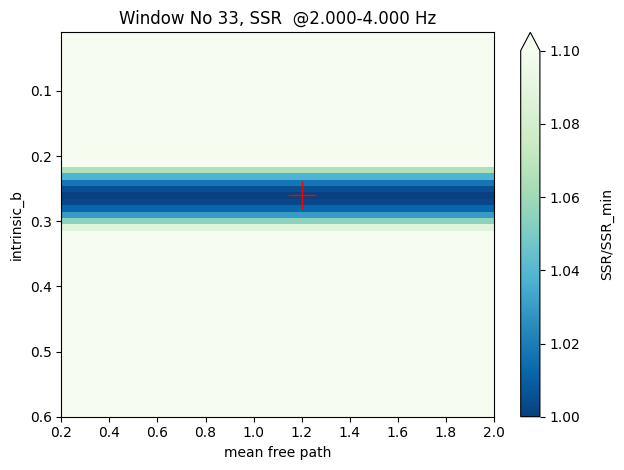

2.00-4.00 Hz  loc  (array([22]), array([9]))
 intrinsic_b 0.23  mean_free: 2.00 


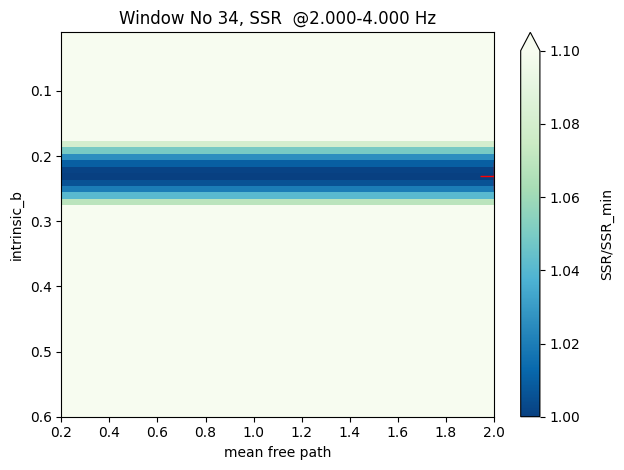

2.00-4.00 Hz  loc  (array([18]), array([7]))
 intrinsic_b 0.19  mean_free: 1.60 


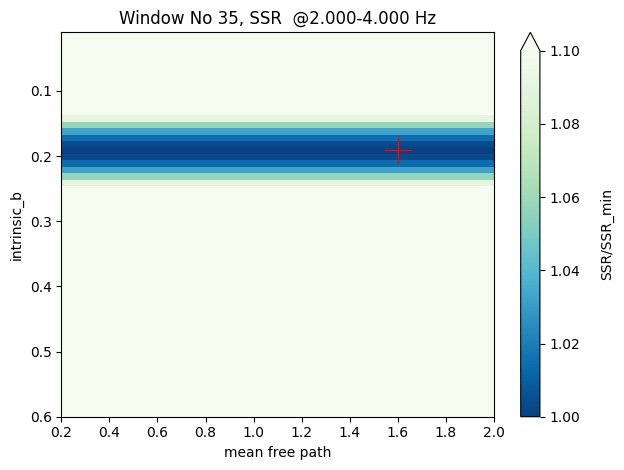

2.00-4.00 Hz  loc  (array([21]), array([5]))
 intrinsic_b 0.22  mean_free: 1.20 


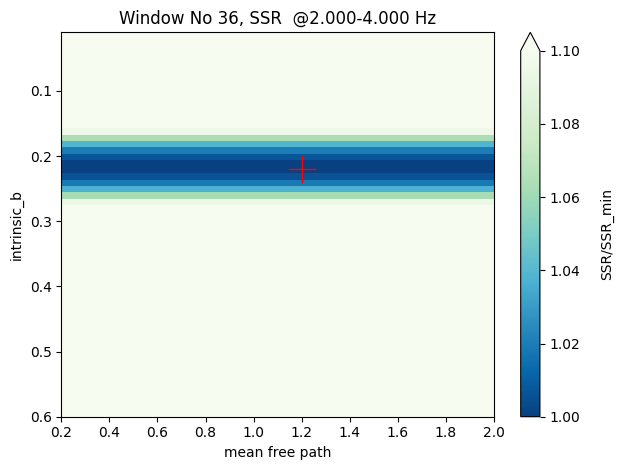

2.00-4.00 Hz  loc  (array([27]), array([6]))
 intrinsic_b 0.28  mean_free: 1.40 


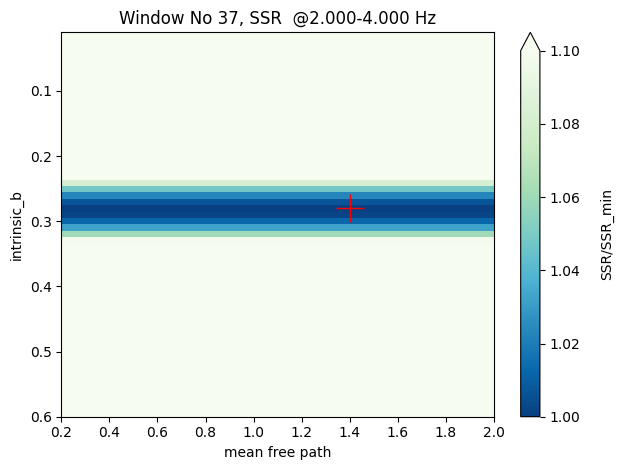

2.00-4.00 Hz  loc  (array([35]), array([9]))
 intrinsic_b 0.36  mean_free: 2.00 


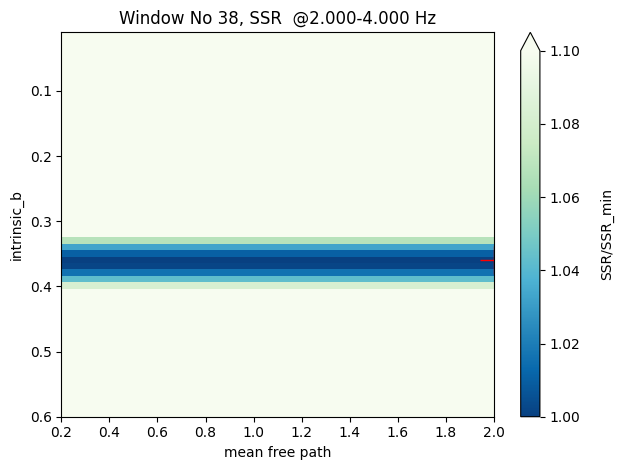

2.00-4.00 Hz  loc  (array([37]), array([7]))
 intrinsic_b 0.38  mean_free: 1.60 


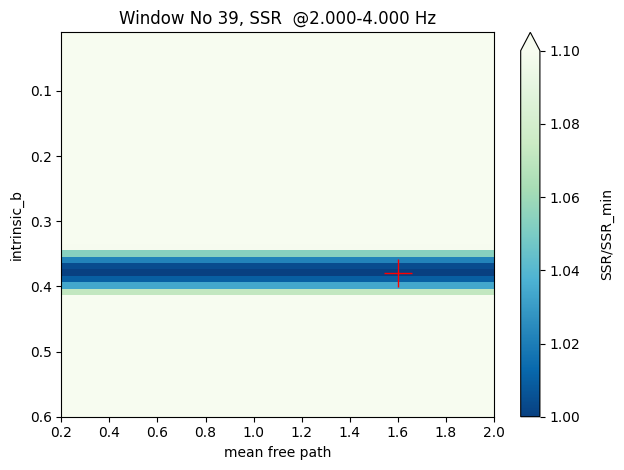

2.00-4.00 Hz  loc  (array([38]), array([8]))
 intrinsic_b 0.39  mean_free: 1.80 


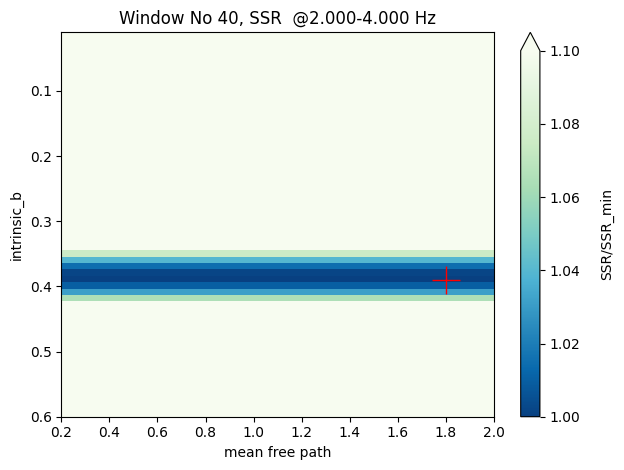

2.00-4.00 Hz  loc  (array([37]), array([9]))
 intrinsic_b 0.38  mean_free: 2.00 


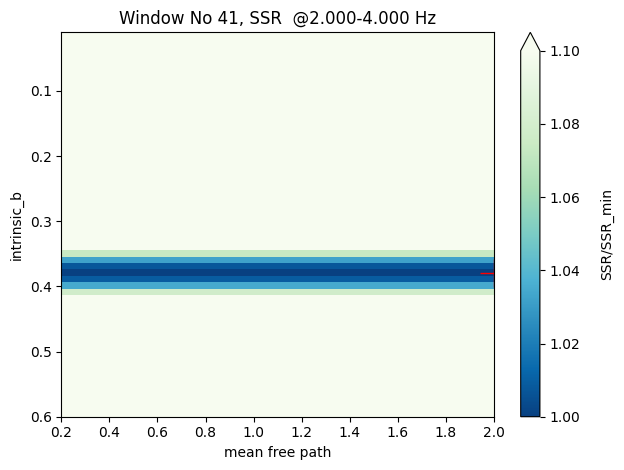

2.00-4.00 Hz  loc  (array([31]), array([9]))
 intrinsic_b 0.32  mean_free: 2.00 


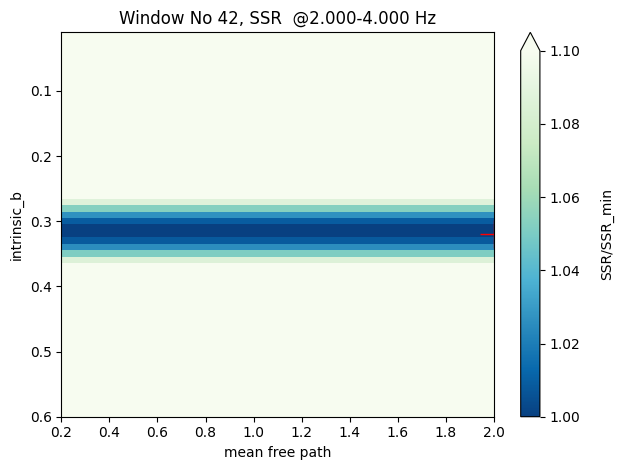

2.00-4.00 Hz  loc  (array([25]), array([8]))
 intrinsic_b 0.26  mean_free: 1.80 


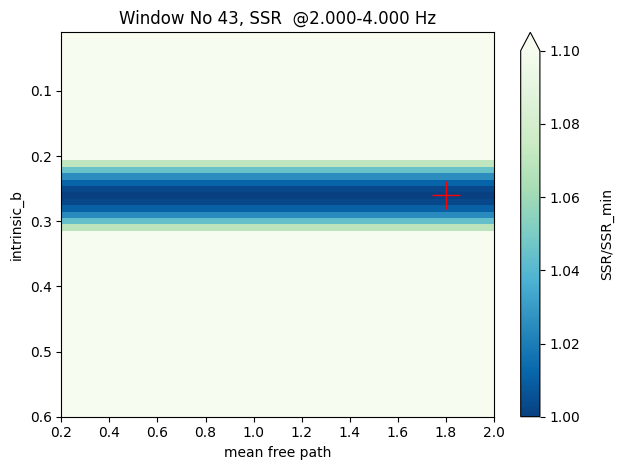

2.00-4.00 Hz  loc  (array([23]), array([7]))
 intrinsic_b 0.24  mean_free: 1.60 


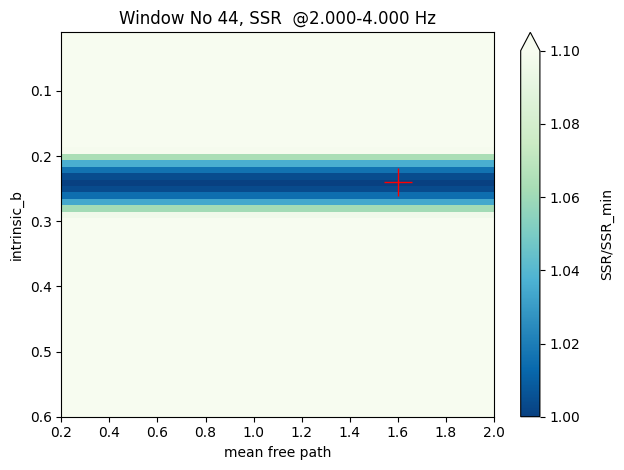

2.00-4.00 Hz  loc  (array([21]), array([6]))
 intrinsic_b 0.22  mean_free: 1.40 


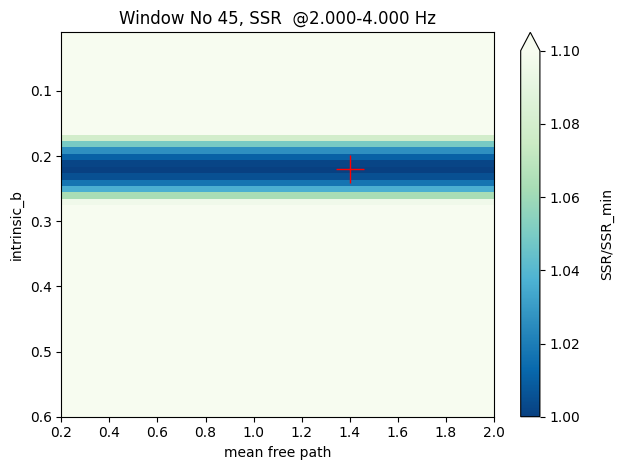

2.00-4.00 Hz  loc  (array([18]), array([4]))
 intrinsic_b 0.19  mean_free: 1.00 


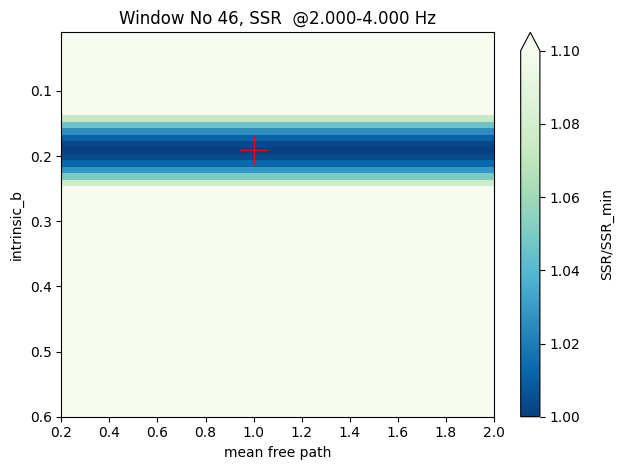

2.00-4.00 Hz  loc  (array([20]), array([9]))
 intrinsic_b 0.21  mean_free: 2.00 


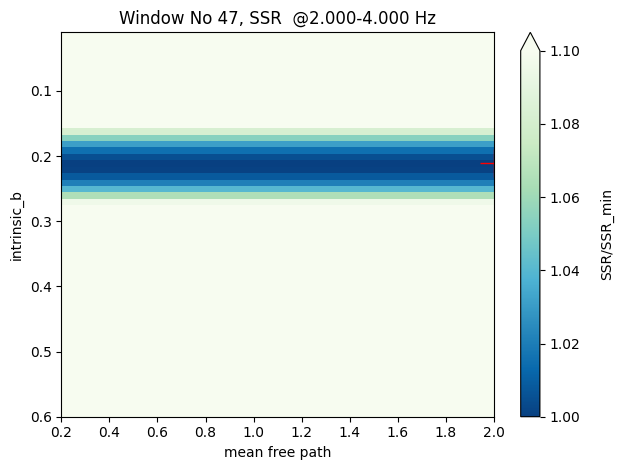

2.00-4.00 Hz  loc  (array([26]), array([9]))
 intrinsic_b 0.27  mean_free: 2.00 


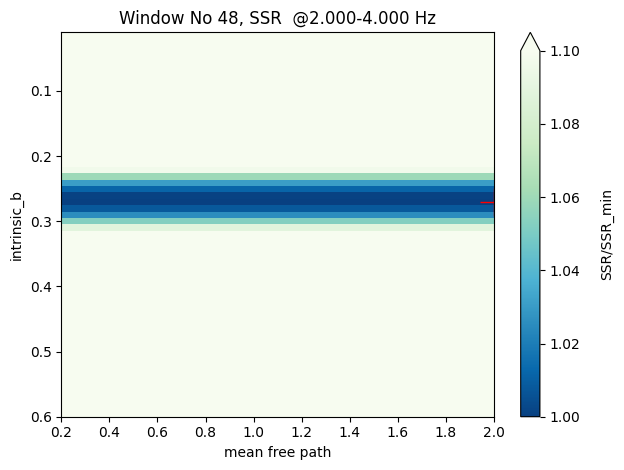

2.00-4.00 Hz  loc  (array([31]), array([9]))
 intrinsic_b 0.32  mean_free: 2.00 


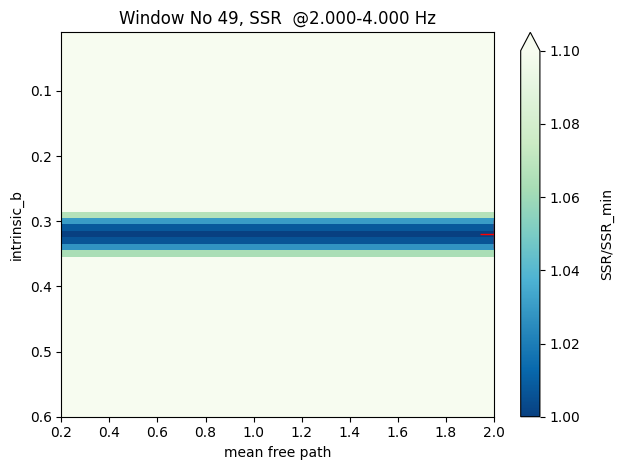

2.00-4.00 Hz  loc  (array([37]), array([9]))
 intrinsic_b 0.38  mean_free: 2.00 


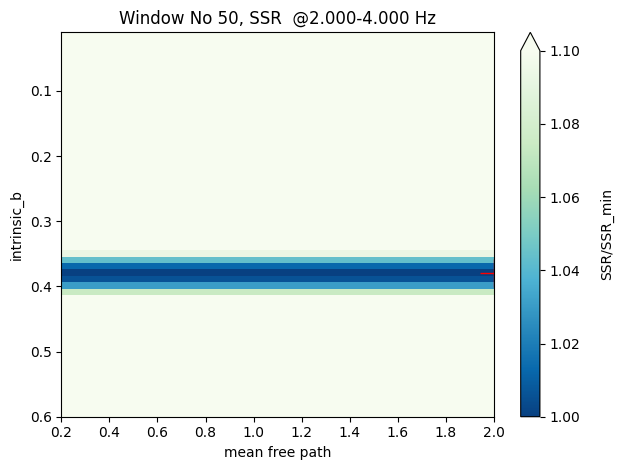

2.00-4.00 Hz  loc  (array([41]), array([7]))
 intrinsic_b 0.42  mean_free: 1.60 


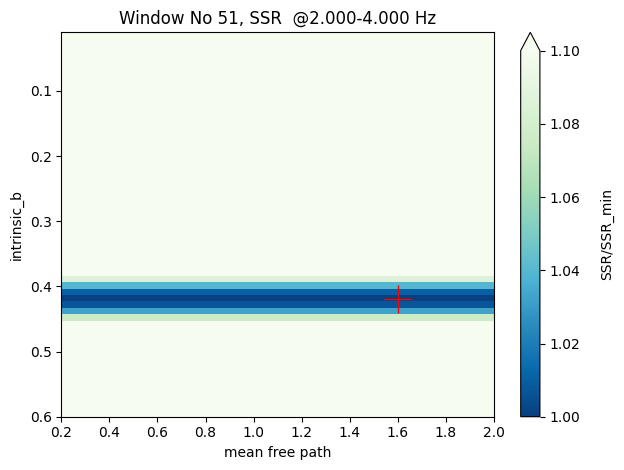

2.00-4.00 Hz  loc  (array([42]), array([7]))
 intrinsic_b 0.43  mean_free: 1.60 


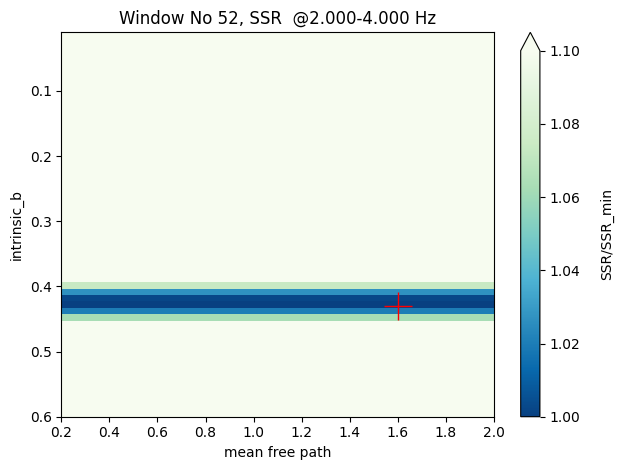

2.00-4.00 Hz  loc  (array([36]), array([9]))
 intrinsic_b 0.37  mean_free: 2.00 


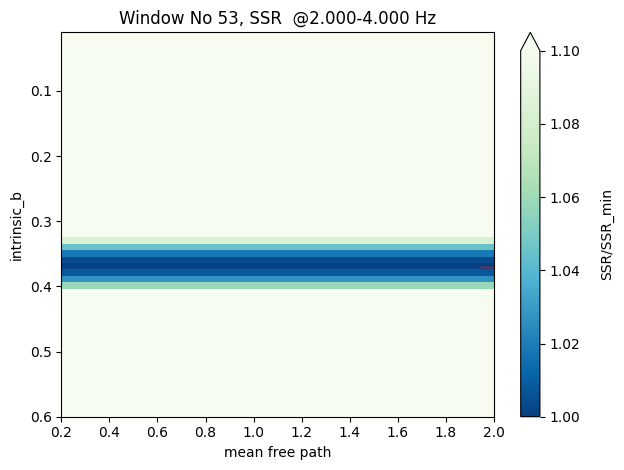

2.00-4.00 Hz  loc  (array([32]), array([6]))
 intrinsic_b 0.33  mean_free: 1.40 


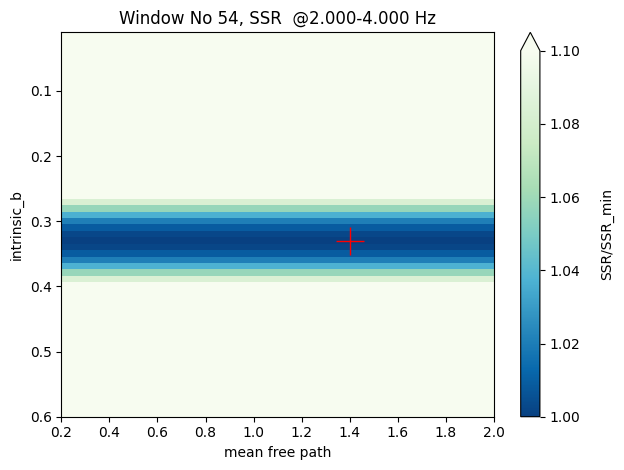

2.00-4.00 Hz  loc  (array([32]), array([9]))
 intrinsic_b 0.33  mean_free: 2.00 


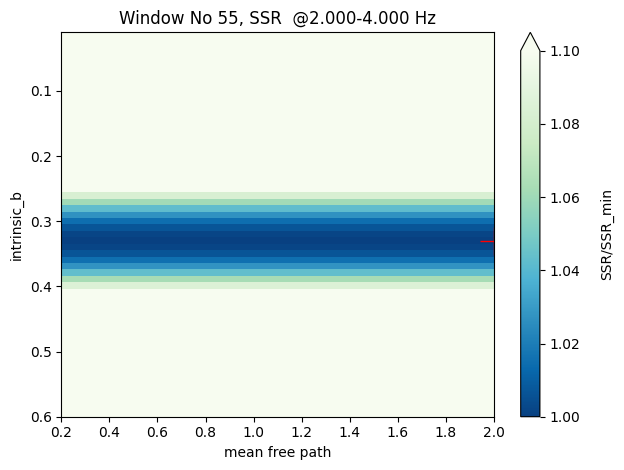

2.00-4.00 Hz  loc  (array([33]), array([8]))
 intrinsic_b 0.34  mean_free: 1.80 


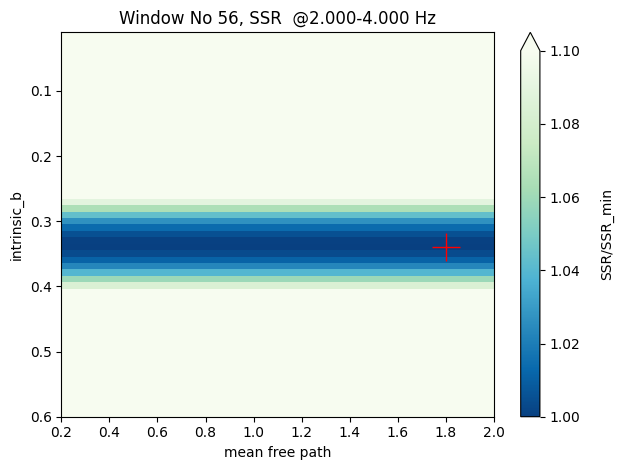

2.00-4.00 Hz  loc  (array([31]), array([9]))
 intrinsic_b 0.32  mean_free: 2.00 


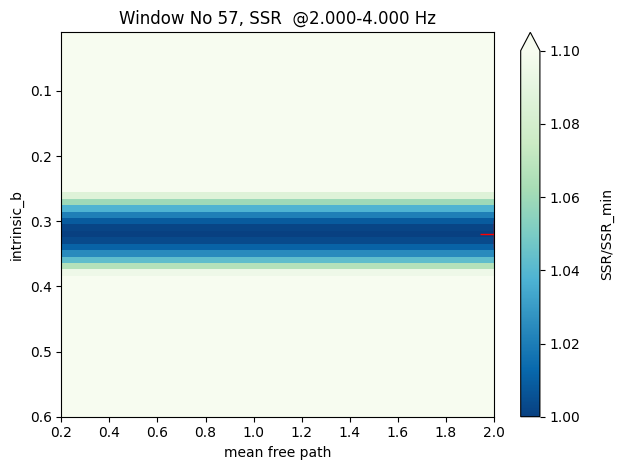

2.00-4.00 Hz  loc  (array([30]), array([4]))
 intrinsic_b 0.31  mean_free: 1.00 


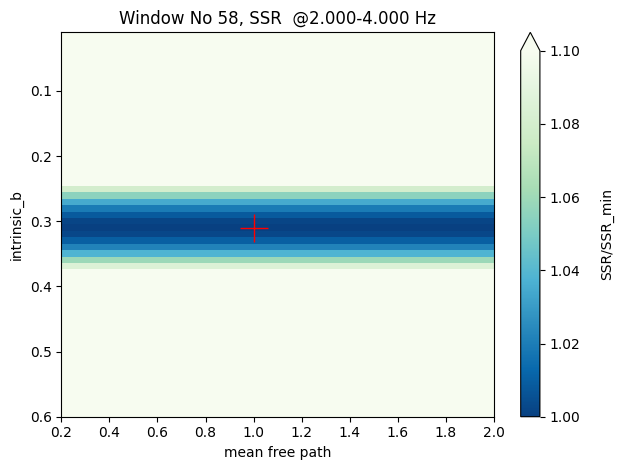

2.00-4.00 Hz  loc  (array([29]), array([9]))
 intrinsic_b 0.30  mean_free: 2.00 


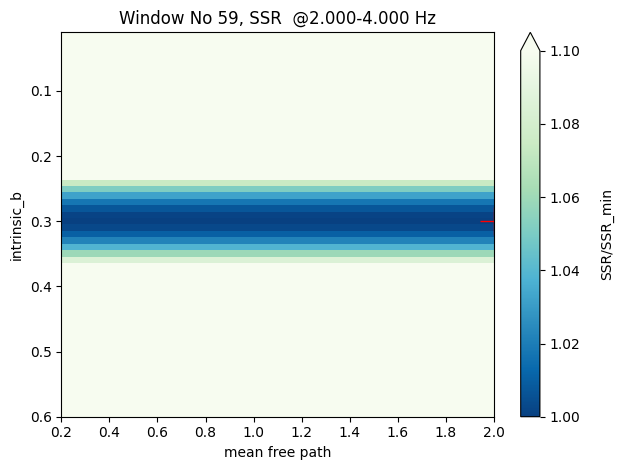

2.00-4.00 Hz  loc  (array([31]), array([7]))
 intrinsic_b 0.32  mean_free: 1.60 


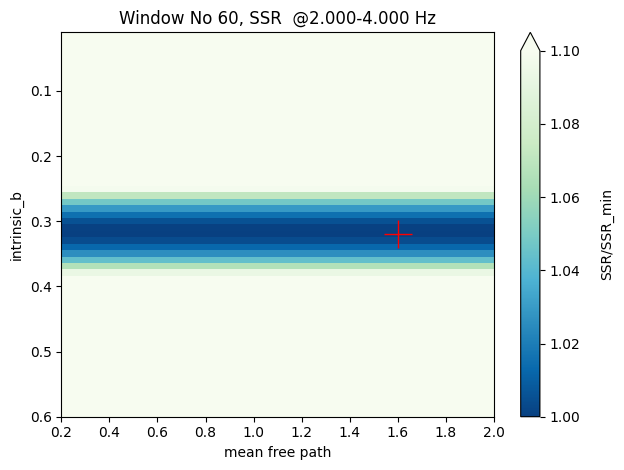

2.00-4.00 Hz  loc  (array([34]), array([8]))
 intrinsic_b 0.35  mean_free: 1.80 


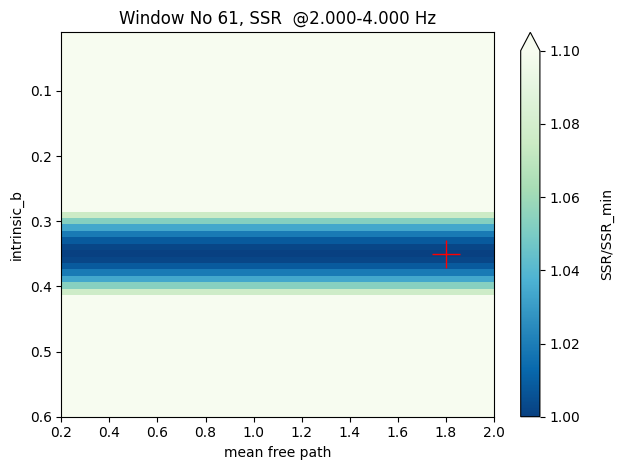

2.00-4.00 Hz  loc  (array([38]), array([4]))
 intrinsic_b 0.39  mean_free: 1.00 


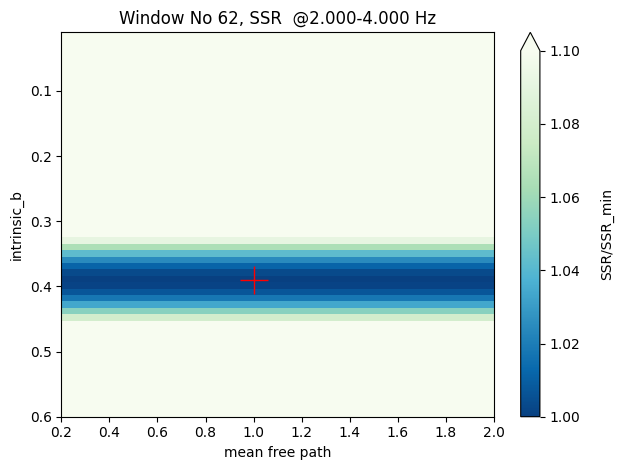

2.00-4.00 Hz  loc  (array([38]), array([5]))
 intrinsic_b 0.39  mean_free: 1.20 


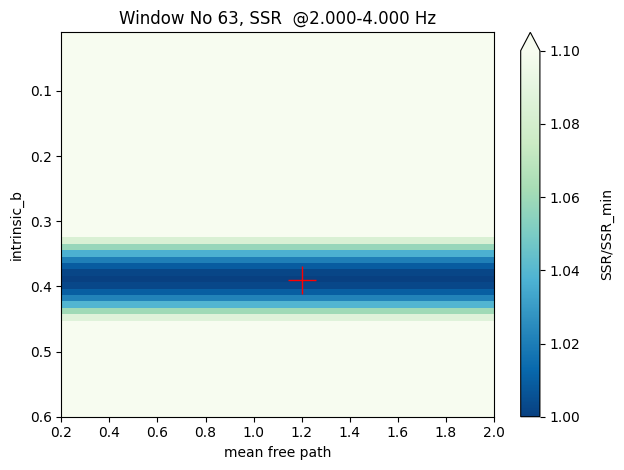

2.00-4.00 Hz  loc  (array([34]), array([8]))
 intrinsic_b 0.35  mean_free: 1.80 


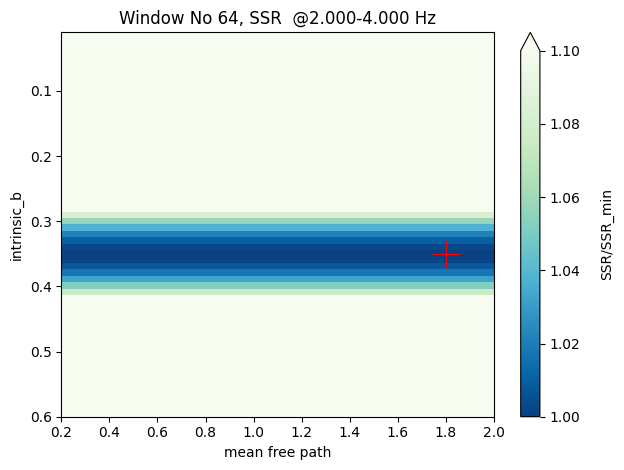

In [38]:
for ntw in range(nwin):
    plot_grid_searching(SSR[ntw], ntw)

In [39]:
def plot_fitting_result(mean_free,intrinsic_b,tt,Eobs,Esyn,fname,dist,twin,fmin,fmax,win_num):
    nwindows=twin.shape[0]
    
    pymax=np.max(Eobs[:-2]*5)
    pymin=10**(-6)
    fig, ax= plt.subplots(nwindows, figsize=(6,8))
    for k in range(nwindows):
        ax[k].set_yscale('log', base=10)
        ax[k].set_ylim( pymin , pymax )
        ax[k].plot( tt, Eobs[k], "k-", linewidth=1)
        ax[k].plot( tt, Esyn[k], "b--", linewidth=1)
    
        ax[k].plot([twin[k,0],twin[k,0]], [0, nev], 'r--', label=f'[{twin[k,0]:.2f}, {twin[k,1]:.2f}] sec')
        ax[k].plot([twin[k,1], twin[k,1]], [0, nev], 'r--')
        ax[k].legend(loc='upper right')
        # ax[k].set_xlim(0, tt[-20])
    ax[0].set_title("Window no. %d  %s @%4.2f-%4.2f Hz, intrinsic b: %.2f, mean free path: %.2f" \
            % (  win_num, fname,fmin,fmax,intrinsic_b, mean_free ) )
    ax[-1].set_xlabel("Lag time (sec)")
    ax[-1].set_ylabel("Energy density Amp")
    plt.tight_layout()   
    plt.show()
                    

2024-09-27 12:24:47,123 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.09], mean_free: [1.6]
2024-09-27 12:24:47,134 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.09) -- scaling amp: 6.03
2024-09-27 12:24:47,145 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.09) -- scaling amp: 5.97
2024-09-27 12:24:47,157 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.09) -- scaling amp: 5.00
2024-09-27 12:24:47,169 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.09) -- scaling amp: 1.65
2024-09-27 12:24:47,182 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.09) -- scaling amp: 1.32
2024-09-27 12:24:47,193 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


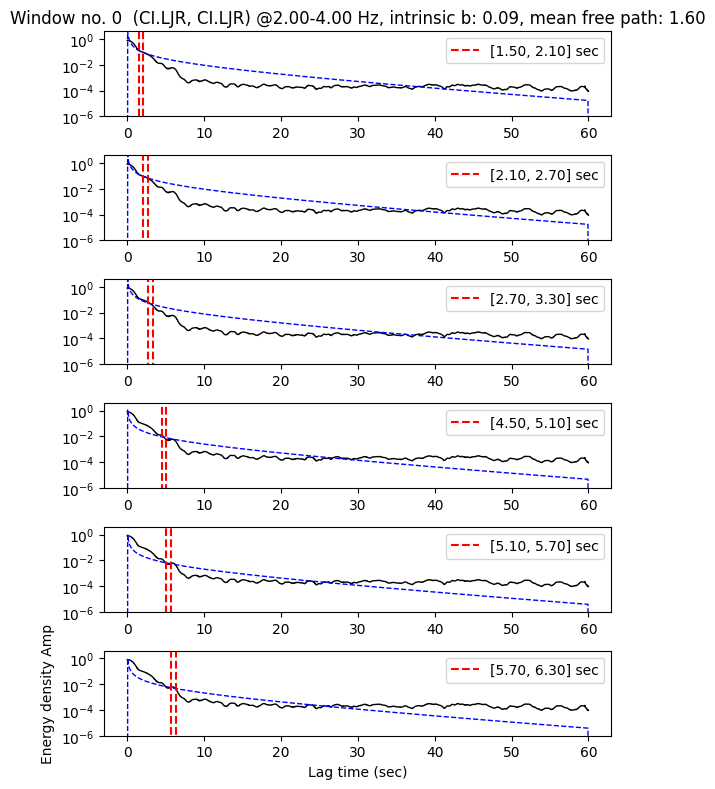

2024-09-27 12:24:47,590 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.15], mean_free: [1.2]
2024-09-27 12:24:47,602 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.2, 0.15) -- scaling amp: 5.01
2024-09-27 12:24:47,615 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.2, 0.15) -- scaling amp: 5.00
2024-09-27 12:24:47,627 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.2, 0.15) -- scaling amp: 4.34
2024-09-27 12:24:47,639 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.2, 0.15) -- scaling amp: 1.62
2024-09-27 12:24:47,652 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.2, 0.15) -- scaling amp: 1.39
2024-09-27 12:24:47,663 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


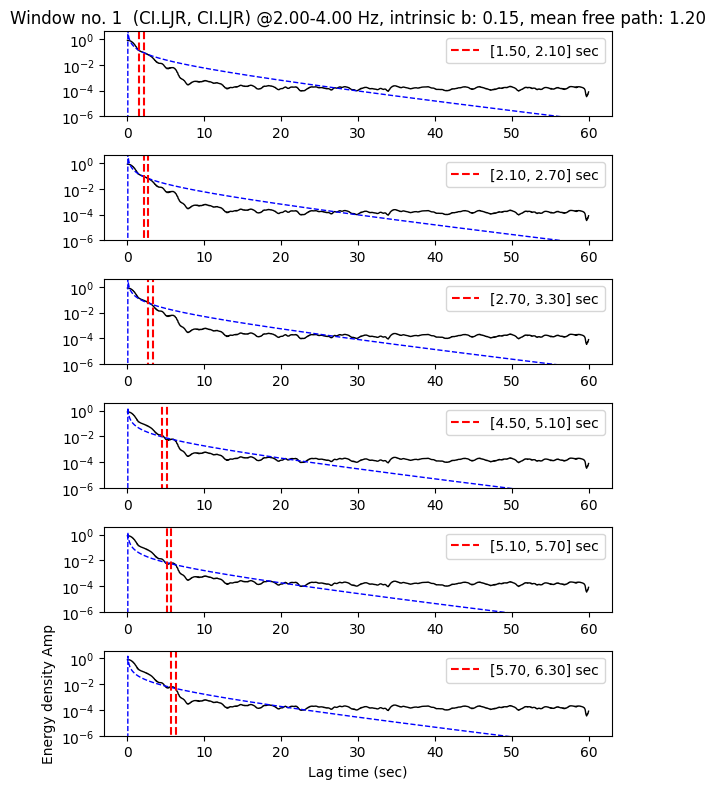

2024-09-27 12:24:48,126 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.16], mean_free: [2.]
2024-09-27 12:24:48,137 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.16) -- scaling amp: 8.77
2024-09-27 12:24:48,150 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.16) -- scaling amp: 8.66
2024-09-27 12:24:48,163 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.16) -- scaling amp: 7.42
2024-09-27 12:24:48,175 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.16) -- scaling amp: 2.76
2024-09-27 12:24:48,188 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.16) -- scaling amp: 2.45
2024-09-27 12:24:48,200 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


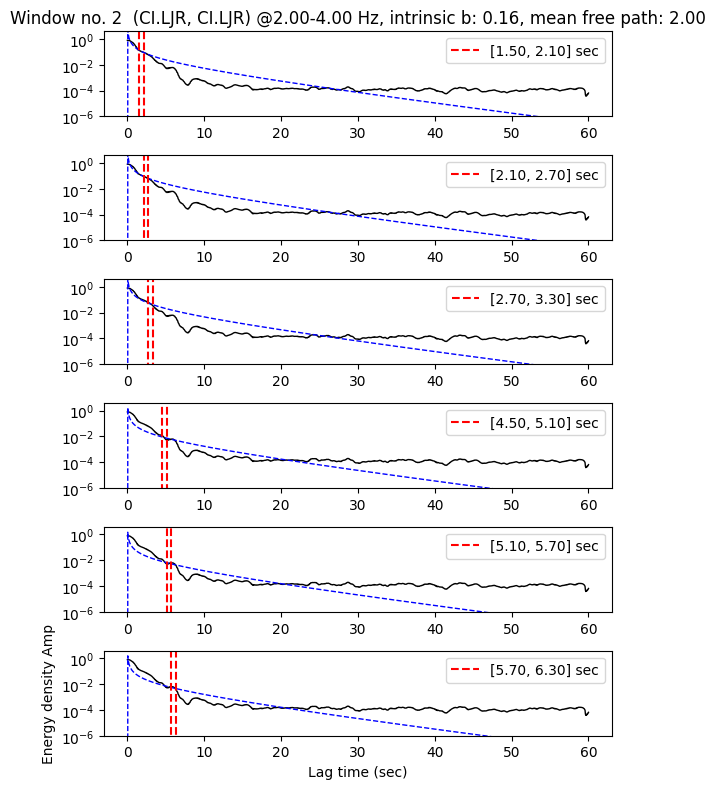

2024-09-27 12:24:48,576 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.13], mean_free: [1.4]
2024-09-27 12:24:48,588 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.4, 0.13) -- scaling amp: 6.03
2024-09-27 12:24:48,601 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.4, 0.13) -- scaling amp: 5.86
2024-09-27 12:24:48,614 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.4, 0.13) -- scaling amp: 4.80
2024-09-27 12:24:48,625 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.4, 0.13) -- scaling amp: 1.66
2024-09-27 12:24:48,638 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.4, 0.13) -- scaling amp: 1.46
2024-09-27 12:24:48,650 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


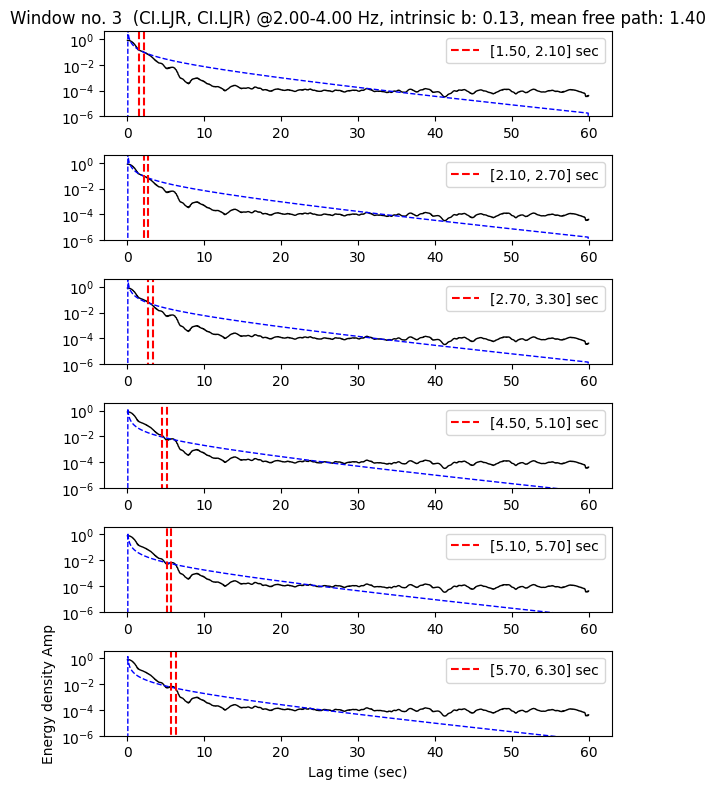

2024-09-27 12:24:49,024 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.13], mean_free: [1.8]
2024-09-27 12:24:49,036 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.8, 0.13) -- scaling amp: 7.73
2024-09-27 12:24:49,048 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.8, 0.13) -- scaling amp: 7.41
2024-09-27 12:24:49,060 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.8, 0.13) -- scaling amp: 6.02
2024-09-27 12:24:49,073 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.8, 0.13) -- scaling amp: 2.15
2024-09-27 12:24:49,085 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.8, 0.13) -- scaling amp: 1.83
2024-09-27 12:24:49,097 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


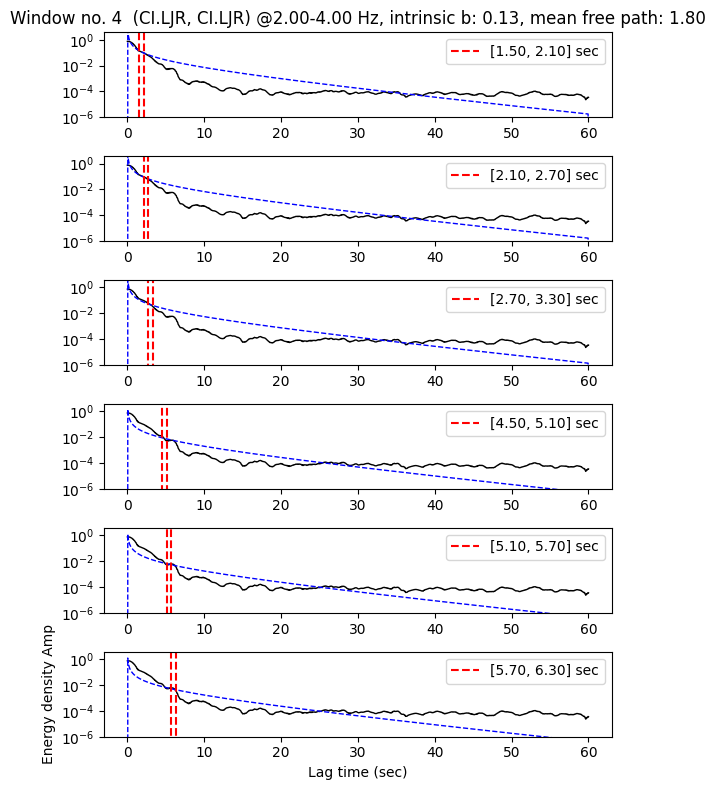

2024-09-27 12:24:49,561 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.17], mean_free: [1.4]
2024-09-27 12:24:49,572 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.4, 0.17) -- scaling amp: 6.45
2024-09-27 12:24:49,584 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.4, 0.17) -- scaling amp: 6.20
2024-09-27 12:24:49,597 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.4, 0.17) -- scaling amp: 5.19
2024-09-27 12:24:49,608 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.4, 0.17) -- scaling amp: 1.86
2024-09-27 12:24:49,620 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.4, 0.17) -- scaling amp: 1.61
2024-09-27 12:24:49,632 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


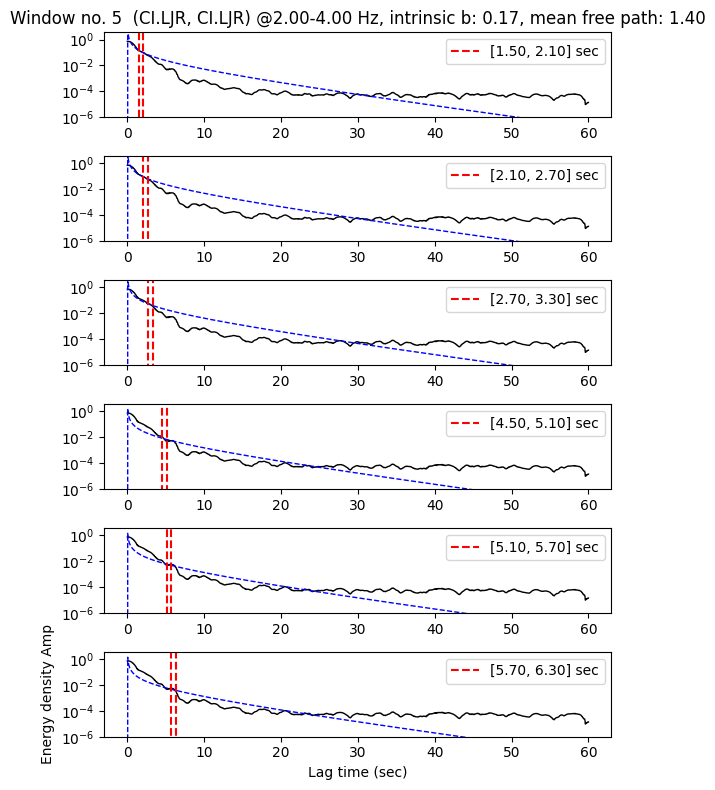

2024-09-27 12:24:50,009 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.16], mean_free: [2.]
2024-09-27 12:24:50,021 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.16) -- scaling amp: 8.86
2024-09-27 12:24:50,034 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.16) -- scaling amp: 8.55
2024-09-27 12:24:50,045 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.16) -- scaling amp: 7.28
2024-09-27 12:24:50,057 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.16) -- scaling amp: 2.28
2024-09-27 12:24:50,069 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.16) -- scaling amp: 1.98
2024-09-27 12:24:50,081 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


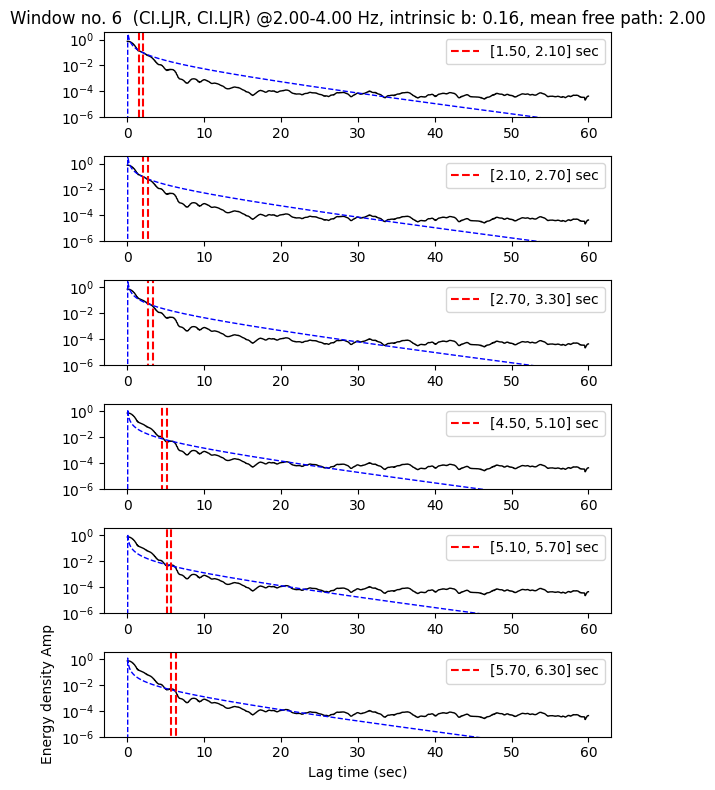

2024-09-27 12:24:50,460 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.14], mean_free: [1.8]
2024-09-27 12:24:50,472 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.8, 0.14) -- scaling amp: 7.80
2024-09-27 12:24:50,485 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.8, 0.14) -- scaling amp: 7.40
2024-09-27 12:24:50,498 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.8, 0.14) -- scaling amp: 6.14
2024-09-27 12:24:50,510 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.8, 0.14) -- scaling amp: 1.90
2024-09-27 12:24:50,523 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.8, 0.14) -- scaling amp: 1.62
2024-09-27 12:24:50,535 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


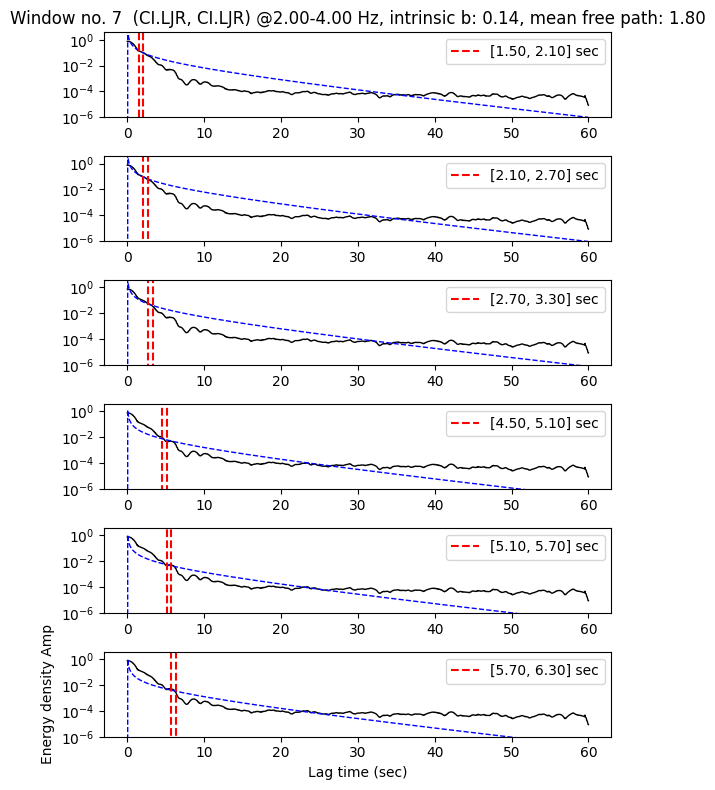

2024-09-27 12:24:50,915 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b 0.16, mean_free: 1.4000000000000001
2024-09-27 12:24:50,927 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.4, 0.16) -- scaling amp: 6.50
2024-09-27 12:24:50,940 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.4, 0.16) -- scaling amp: 6.19
2024-09-27 12:24:50,952 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.4, 0.16) -- scaling amp: 5.24
2024-09-27 12:24:50,963 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.4, 0.16) -- scaling amp: 1.75
2024-09-27 12:24:50,976 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.4, 0.16) -- scaling amp: 1.53
2024-09-27 12:24:50,988 140207065536320 INFO attenuation_uti

GET OPTIMAL


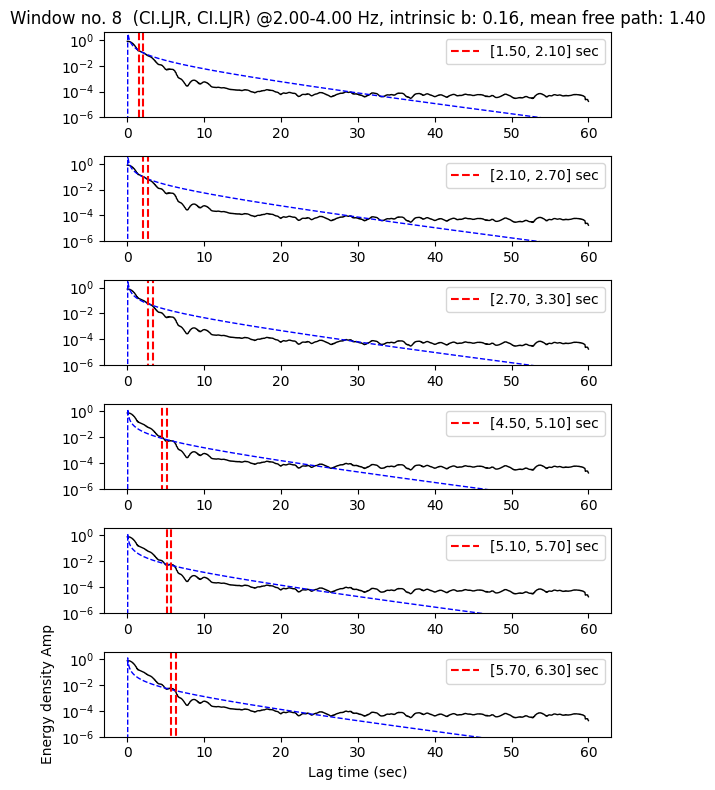

2024-09-27 12:24:51,368 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.14], mean_free: [1.4]
2024-09-27 12:24:51,380 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.4, 0.14) -- scaling amp: 6.41
2024-09-27 12:24:51,392 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.4, 0.14) -- scaling amp: 6.11
2024-09-27 12:24:51,405 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.4, 0.14) -- scaling amp: 5.17
2024-09-27 12:24:51,417 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.4, 0.14) -- scaling amp: 1.54
2024-09-27 12:24:51,429 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.4, 0.14) -- scaling amp: 1.38
2024-09-27 12:24:51,442 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


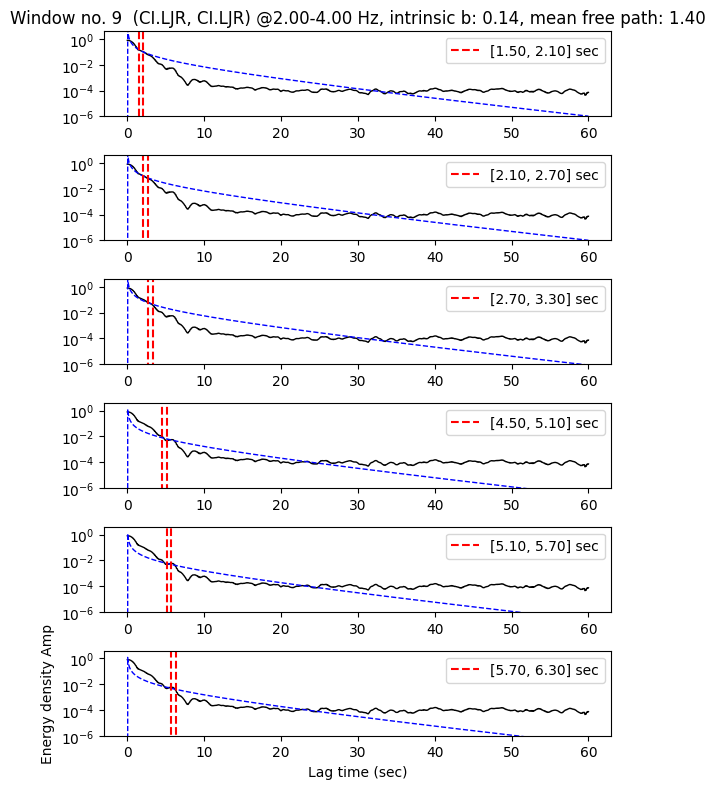

2024-09-27 12:24:51,940 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.13], mean_free: [1.6]
2024-09-27 12:24:51,952 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.13) -- scaling amp: 7.00
2024-09-27 12:24:51,964 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.13) -- scaling amp: 6.69
2024-09-27 12:24:51,975 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.13) -- scaling amp: 5.61
2024-09-27 12:24:51,987 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.13) -- scaling amp: 1.69
2024-09-27 12:24:52,000 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.13) -- scaling amp: 1.53
2024-09-27 12:24:52,012 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


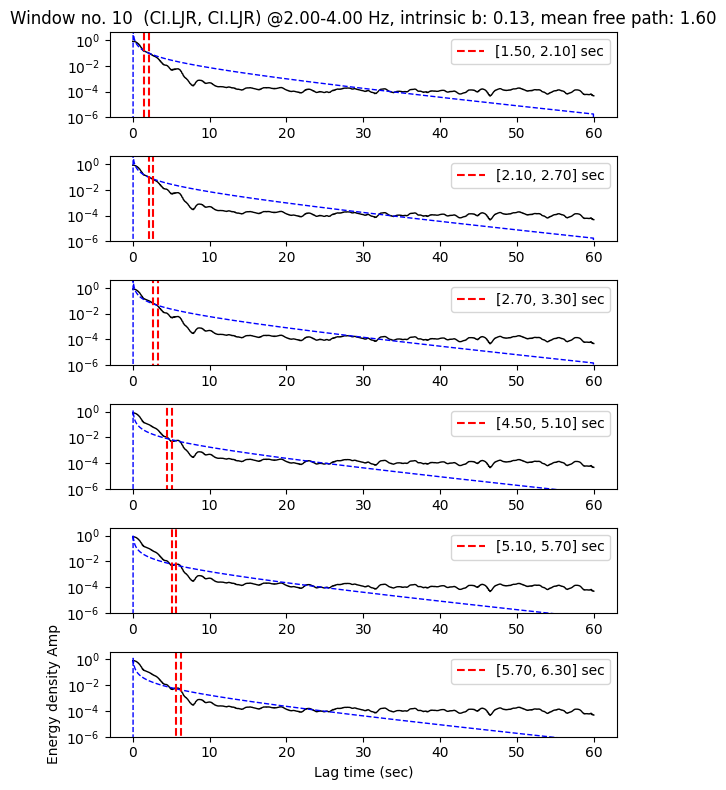

2024-09-27 12:24:52,389 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.13], mean_free: [2.]
2024-09-27 12:24:52,402 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.13) -- scaling amp: 8.43
2024-09-27 12:24:52,414 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.13) -- scaling amp: 8.04
2024-09-27 12:24:52,426 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.13) -- scaling amp: 6.67
2024-09-27 12:24:52,438 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.13) -- scaling amp: 2.19
2024-09-27 12:24:52,451 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.13) -- scaling amp: 1.94
2024-09-27 12:24:52,463 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


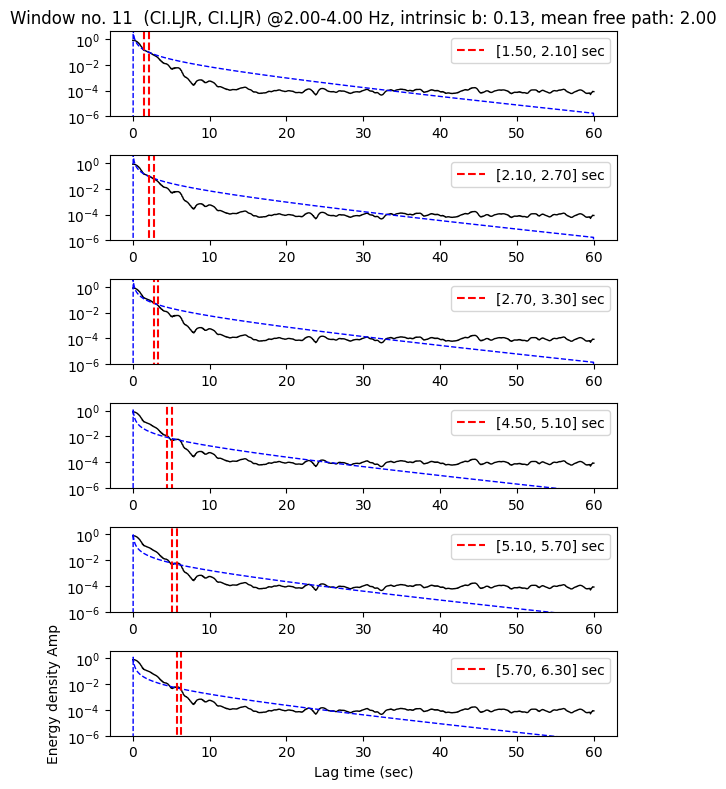

2024-09-27 12:24:52,842 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.13], mean_free: [1.6]
2024-09-27 12:24:52,853 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.13) -- scaling amp: 6.54
2024-09-27 12:24:52,865 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.13) -- scaling amp: 6.29
2024-09-27 12:24:52,878 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.13) -- scaling amp: 5.03
2024-09-27 12:24:52,890 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.13) -- scaling amp: 1.50
2024-09-27 12:24:52,903 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.13) -- scaling amp: 1.32
2024-09-27 12:24:52,914 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


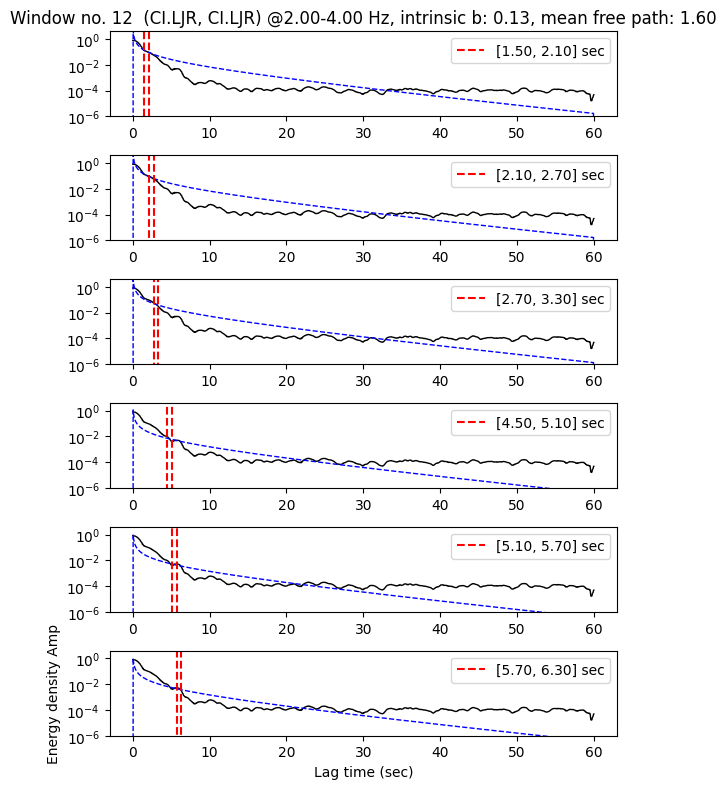

2024-09-27 12:24:53,292 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.21], mean_free: [2.]
2024-09-27 12:24:53,305 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.21) -- scaling amp: 8.97
2024-09-27 12:24:53,318 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.21) -- scaling amp: 8.75
2024-09-27 12:24:53,330 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.21) -- scaling amp: 7.51
2024-09-27 12:24:53,341 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.21) -- scaling amp: 2.63
2024-09-27 12:24:53,353 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.21) -- scaling amp: 2.26
2024-09-27 12:24:53,365 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


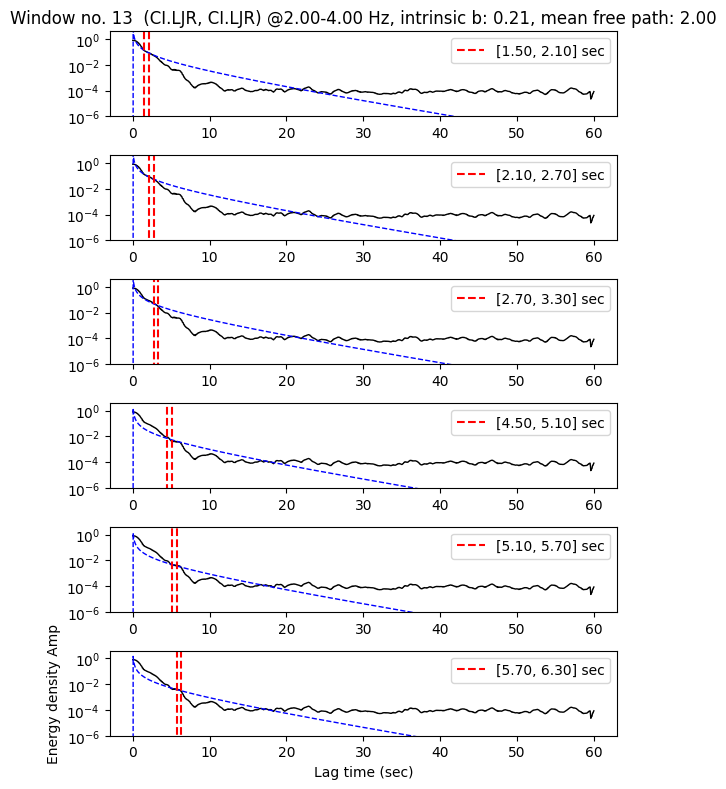

2024-09-27 12:24:53,740 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.29], mean_free: [1.6]
2024-09-27 12:24:53,752 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.29) -- scaling amp: 8.28
2024-09-27 12:24:53,764 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.29) -- scaling amp: 8.22
2024-09-27 12:24:53,776 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.29) -- scaling amp: 7.76
2024-09-27 12:24:53,789 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.29) -- scaling amp: 3.47
2024-09-27 12:24:53,802 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.29) -- scaling amp: 3.18
2024-09-27 12:24:53,813 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


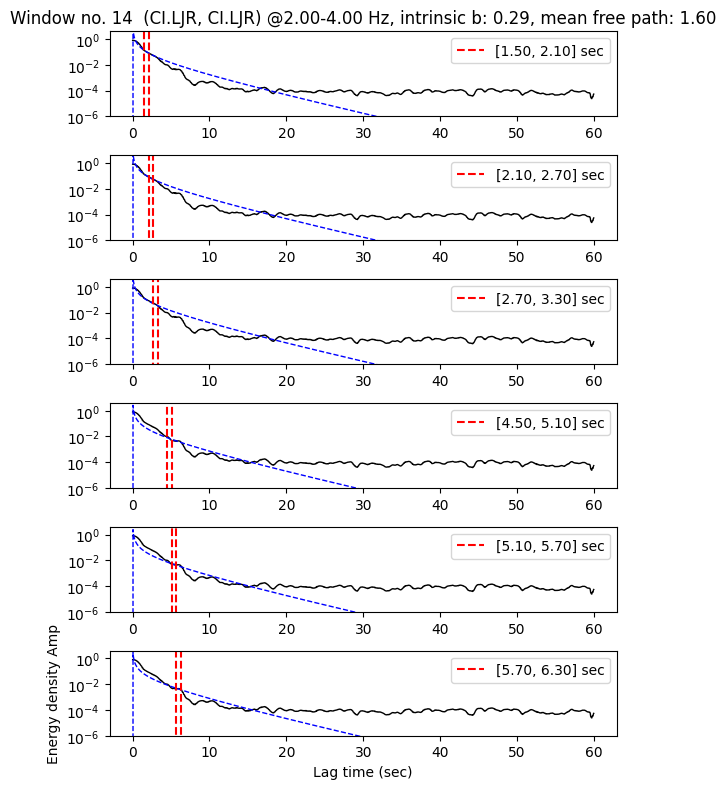

2024-09-27 12:24:54,313 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.36], mean_free: [2.]
2024-09-27 12:24:54,324 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.36) -- scaling amp: 11.49
2024-09-27 12:24:54,337 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.36) -- scaling amp: 11.53
2024-09-27 12:24:54,350 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.36) -- scaling amp: 11.89
2024-09-27 12:24:54,361 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.36) -- scaling amp: 6.78
2024-09-27 12:24:54,373 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.36) -- scaling amp: 6.77
2024-09-27 12:24:54,386 140207065536320 INFO attenuation_utils_mulwin

GET OPTIMAL


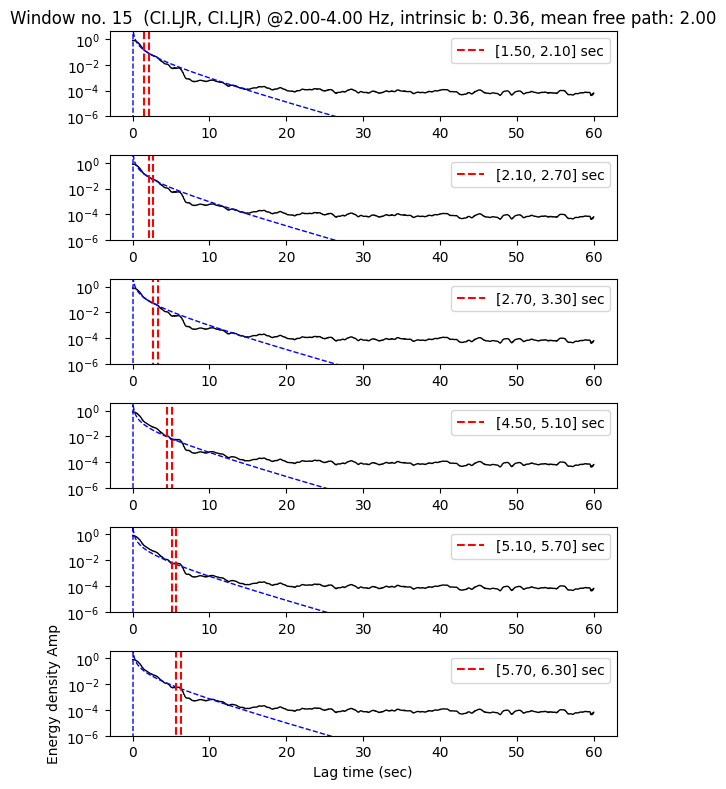

2024-09-27 12:24:54,758 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.38], mean_free: [1.6]
2024-09-27 12:24:54,770 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.38) -- scaling amp: 9.48
2024-09-27 12:24:54,782 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.38) -- scaling amp: 9.39
2024-09-27 12:24:54,794 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.38) -- scaling amp: 9.62
2024-09-27 12:24:54,807 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.38) -- scaling amp: 5.98
2024-09-27 12:24:54,818 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.38) -- scaling amp: 5.99
2024-09-27 12:24:54,830 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


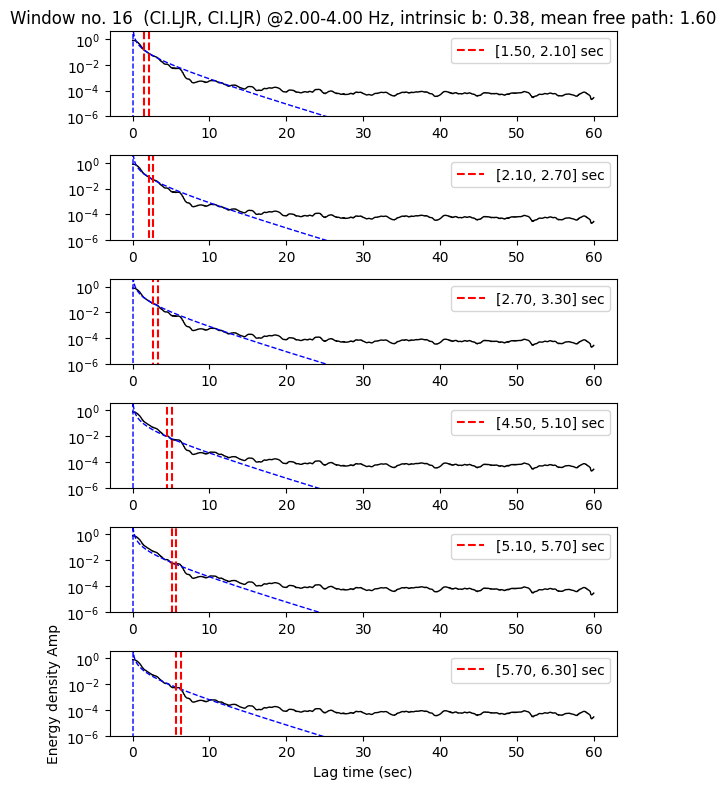

2024-09-27 12:24:55,204 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.34], mean_free: [1.6]
2024-09-27 12:24:55,216 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.34) -- scaling amp: 8.77
2024-09-27 12:24:55,227 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.34) -- scaling amp: 8.58
2024-09-27 12:24:55,239 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.34) -- scaling amp: 8.44
2024-09-27 12:24:55,251 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.34) -- scaling amp: 4.66
2024-09-27 12:24:55,262 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.34) -- scaling amp: 4.54
2024-09-27 12:24:55,275 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


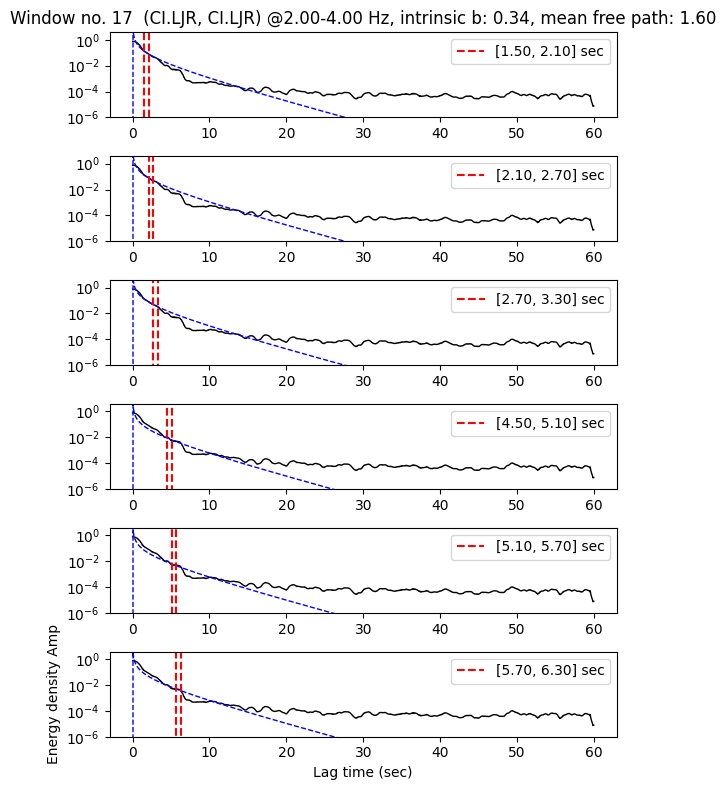

2024-09-27 12:24:55,650 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b 0.06, mean_free: 1.6
2024-09-27 12:24:55,662 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.06) -- scaling amp: 7.58
2024-09-27 12:24:55,674 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.06) -- scaling amp: 6.92
2024-09-27 12:24:55,686 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.06) -- scaling amp: 5.87
2024-09-27 12:24:55,699 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.06) -- scaling amp: 3.46
2024-09-27 12:24:55,711 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.06) -- scaling amp: 2.19
2024-09-27 12:24:55,723 140207065536320 INFO attenuation_utils_mulwin.get_o

GET OPTIMAL


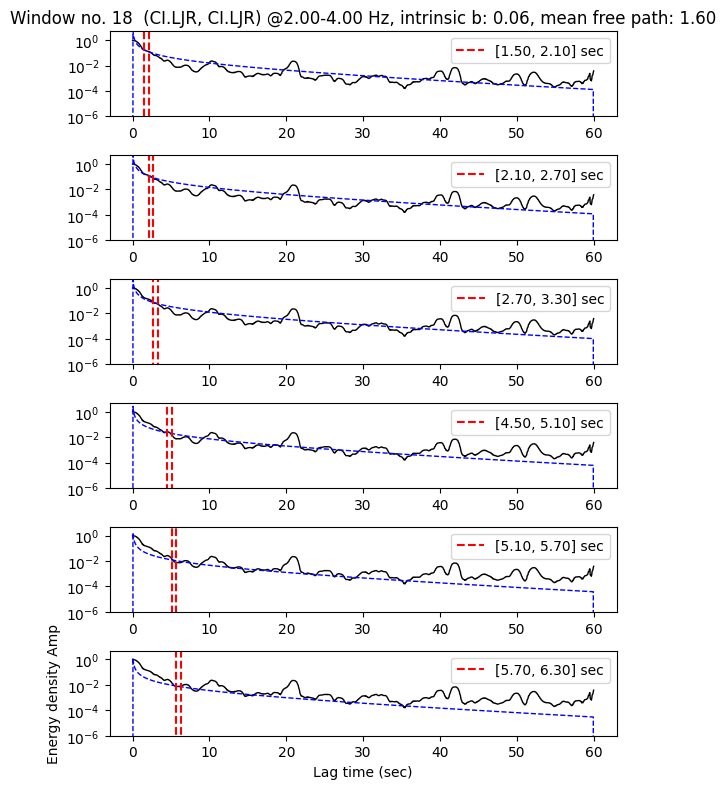

2024-09-27 12:24:56,103 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.01], mean_free: [0.2]
2024-09-27 12:24:56,115 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(0.2, 0.01) -- scaling amp: 0.19
2024-09-27 12:24:56,127 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(0.2, 0.01) -- scaling amp: 0.29
2024-09-27 12:24:56,139 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(0.2, 0.01) -- scaling amp: 0.22
2024-09-27 12:24:56,152 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(0.2, 0.01) -- scaling amp: 0.34
2024-09-27 12:24:56,164 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(0.2, 0.01) -- scaling amp: 0.15
2024-09-27 12:24:56,176 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


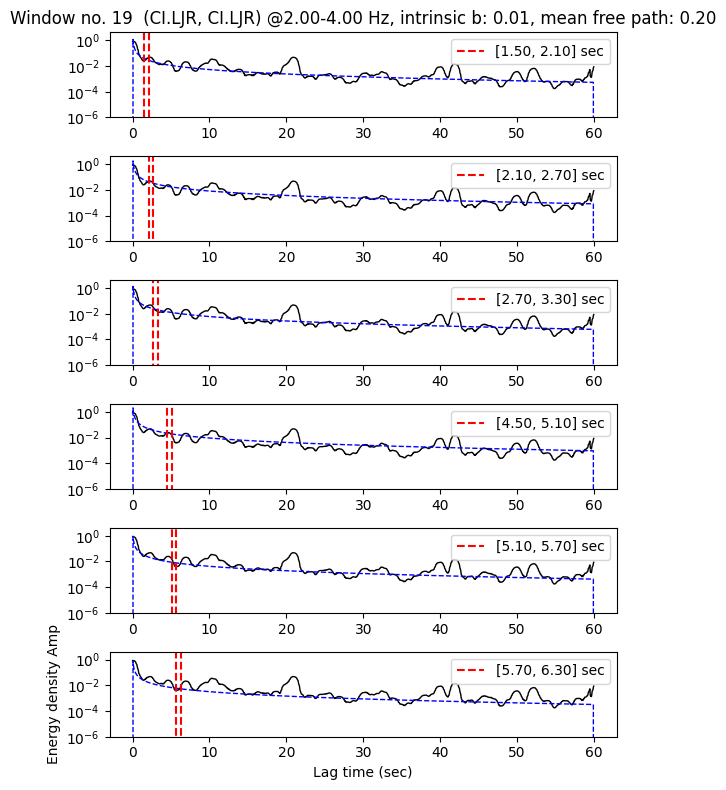

2024-09-27 12:24:56,678 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.25], mean_free: [0.2]
2024-09-27 12:24:56,690 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(0.2, 0.25) -- scaling amp: 0.37
2024-09-27 12:24:56,703 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(0.2, 0.25) -- scaling amp: 0.35
2024-09-27 12:24:56,715 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(0.2, 0.25) -- scaling amp: 0.33
2024-09-27 12:24:56,727 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(0.2, 0.25) -- scaling amp: 0.25
2024-09-27 12:24:56,739 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(0.2, 0.25) -- scaling amp: 0.18
2024-09-27 12:24:56,751 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


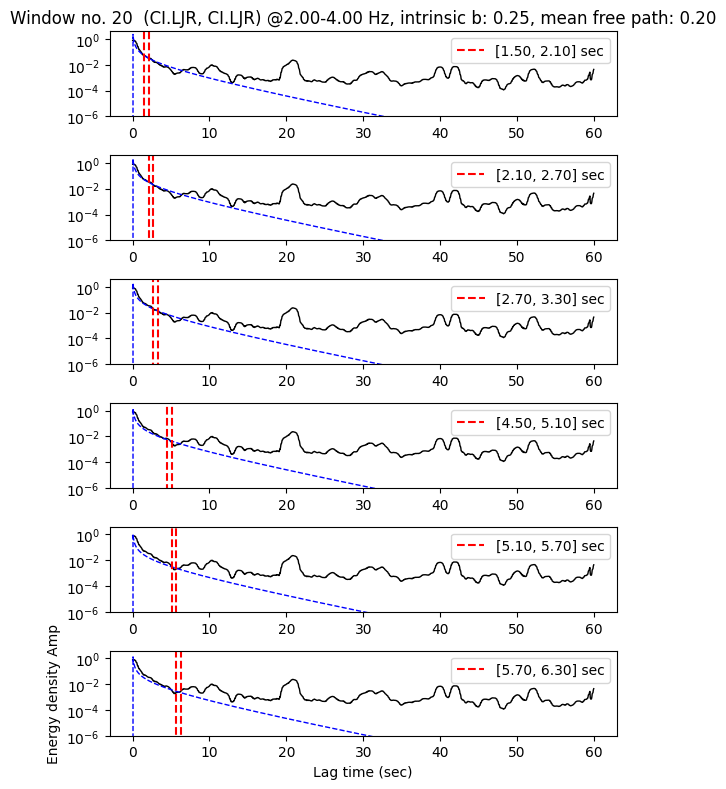

2024-09-27 12:24:57,127 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.23], mean_free: [2.]
2024-09-27 12:24:57,139 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.23) -- scaling amp: 11.33
2024-09-27 12:24:57,150 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.23) -- scaling amp: 10.56
2024-09-27 12:24:57,163 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.23) -- scaling amp: 9.27
2024-09-27 12:24:57,176 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.23) -- scaling amp: 3.27
2024-09-27 12:24:57,187 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.23) -- scaling amp: 2.91
2024-09-27 12:24:57,200 140207065536320 INFO attenuation_utils_mulwin.

GET OPTIMAL


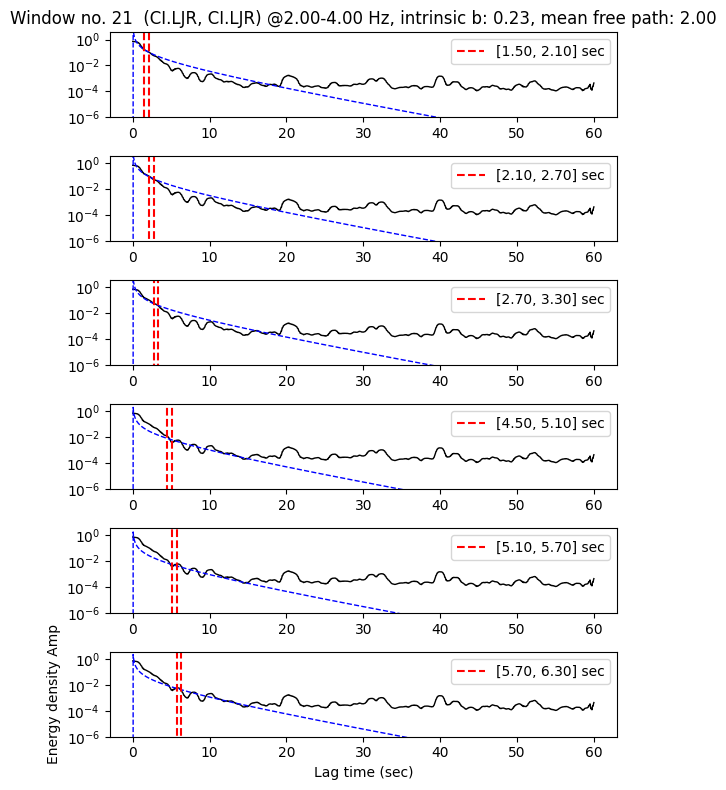

2024-09-27 12:24:57,575 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.24], mean_free: [1.2]
2024-09-27 12:24:57,587 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.2, 0.24) -- scaling amp: 5.95
2024-09-27 12:24:57,598 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.2, 0.24) -- scaling amp: 5.80
2024-09-27 12:24:57,611 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.2, 0.24) -- scaling amp: 5.31
2024-09-27 12:24:57,624 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.2, 0.24) -- scaling amp: 1.93
2024-09-27 12:24:57,636 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.2, 0.24) -- scaling amp: 1.53
2024-09-27 12:24:57,648 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


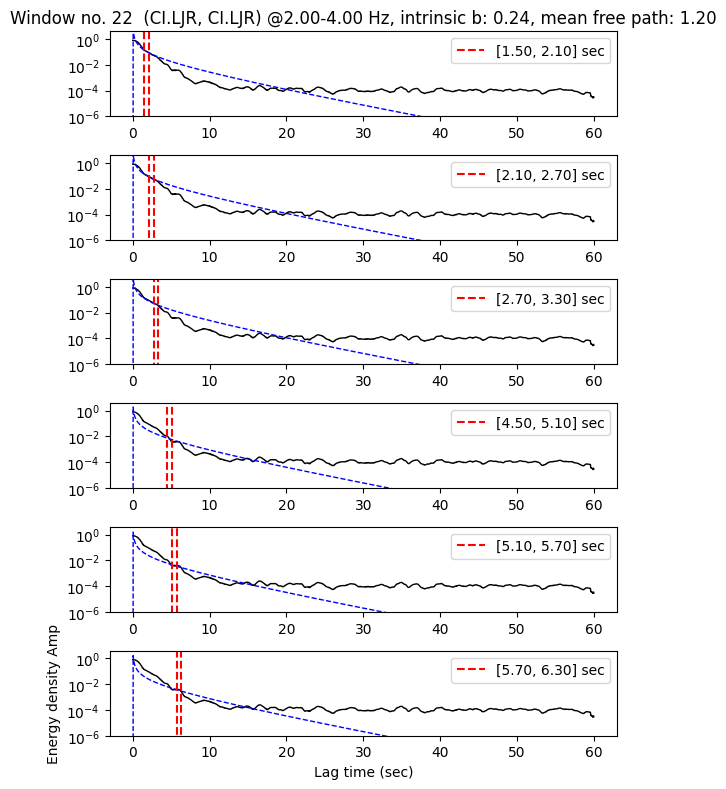

2024-09-27 12:24:58,023 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.25], mean_free: [2.]
2024-09-27 12:24:58,034 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.25) -- scaling amp: 9.65
2024-09-27 12:24:58,047 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.25) -- scaling amp: 9.62
2024-09-27 12:24:58,060 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.25) -- scaling amp: 9.11
2024-09-27 12:24:58,072 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.25) -- scaling amp: 3.46
2024-09-27 12:24:58,085 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.25) -- scaling amp: 2.73
2024-09-27 12:24:58,097 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


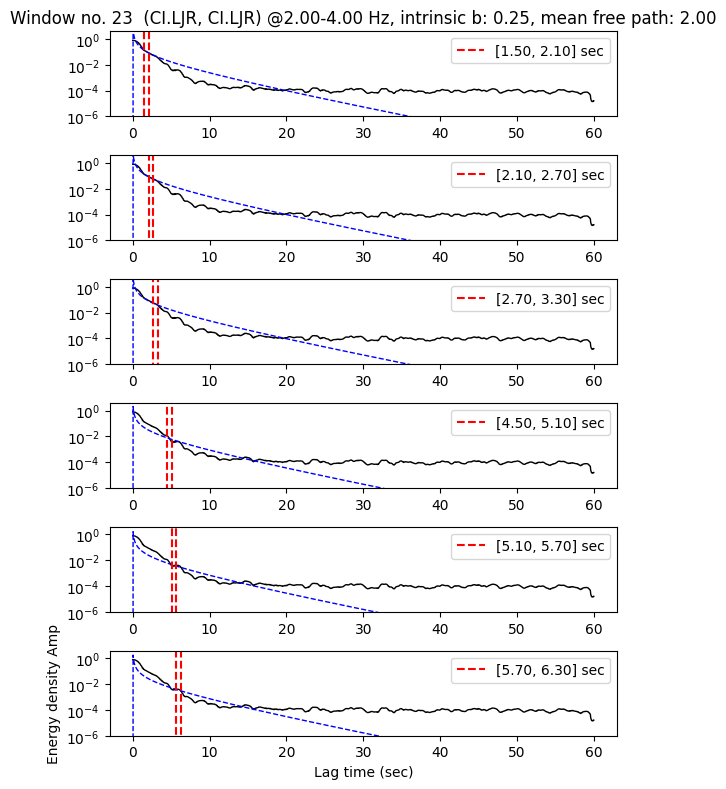

2024-09-27 12:24:58,597 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.28], mean_free: [1.6]
2024-09-27 12:24:58,608 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.28) -- scaling amp: 8.07
2024-09-27 12:24:58,621 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.28) -- scaling amp: 8.01
2024-09-27 12:24:58,632 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.28) -- scaling amp: 7.71
2024-09-27 12:24:58,645 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.28) -- scaling amp: 3.29
2024-09-27 12:24:58,658 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.28) -- scaling amp: 2.78
2024-09-27 12:24:58,669 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


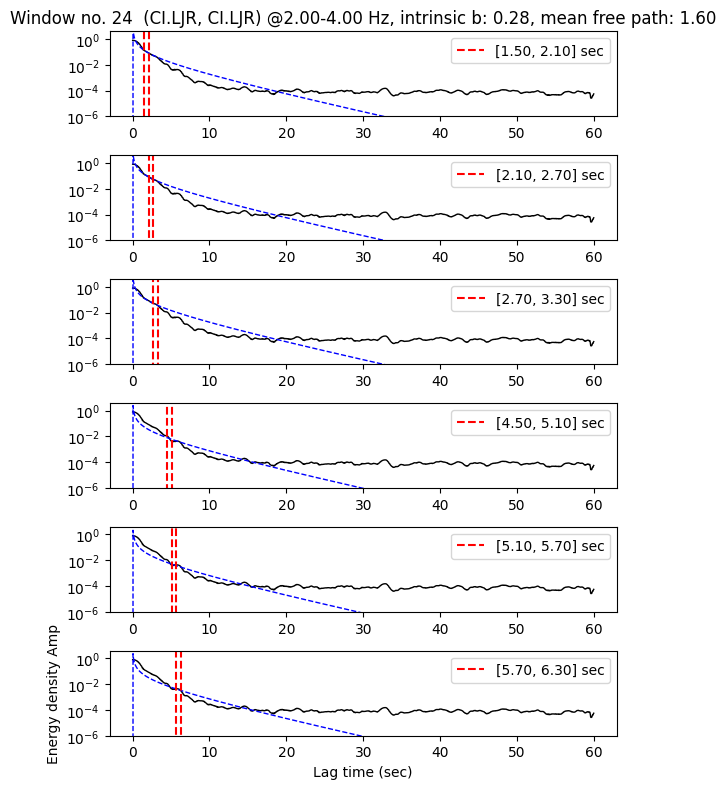

2024-09-27 12:24:59,048 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.32], mean_free: [1.2]
2024-09-27 12:24:59,061 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.2, 0.32) -- scaling amp: 6.63
2024-09-27 12:24:59,074 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.2, 0.32) -- scaling amp: 6.51
2024-09-27 12:24:59,087 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.2, 0.32) -- scaling amp: 6.28
2024-09-27 12:24:59,099 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.2, 0.32) -- scaling amp: 3.01
2024-09-27 12:24:59,112 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.2, 0.32) -- scaling amp: 2.68
2024-09-27 12:24:59,124 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


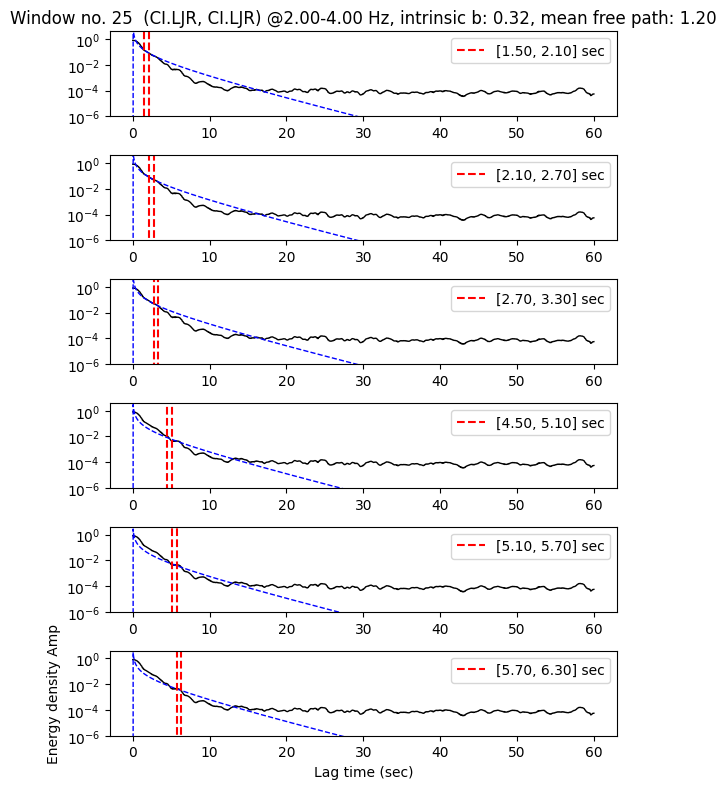

2024-09-27 12:24:59,501 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.37], mean_free: [2.]
2024-09-27 12:24:59,514 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.37) -- scaling amp: 11.78
2024-09-27 12:24:59,526 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.37) -- scaling amp: 11.50
2024-09-27 12:24:59,538 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.37) -- scaling amp: 11.26
2024-09-27 12:24:59,550 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.37) -- scaling amp: 6.17
2024-09-27 12:24:59,562 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.37) -- scaling amp: 5.71
2024-09-27 12:24:59,573 140207065536320 INFO attenuation_utils_mulwin

GET OPTIMAL


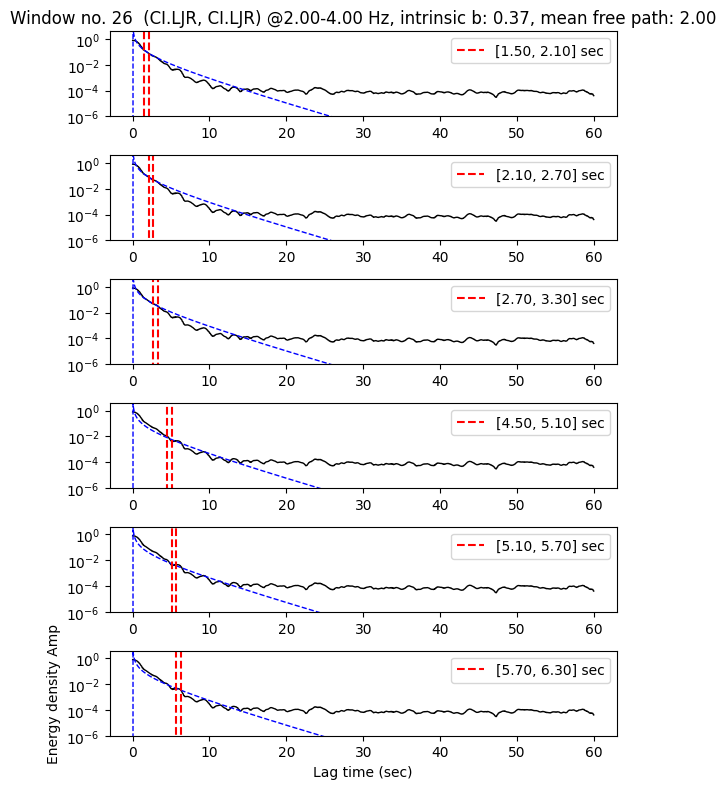

2024-09-27 12:24:59,954 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.41], mean_free: [2.]
2024-09-27 12:24:59,966 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.41) -- scaling amp: 12.50
2024-09-27 12:24:59,978 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.41) -- scaling amp: 12.31
2024-09-27 12:24:59,991 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.41) -- scaling amp: 12.55
2024-09-27 12:25:00,004 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.41) -- scaling amp: 7.81
2024-09-27 12:25:00,016 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.41) -- scaling amp: 7.36
2024-09-27 12:25:00,029 140207065536320 INFO attenuation_utils_mulwin

GET OPTIMAL


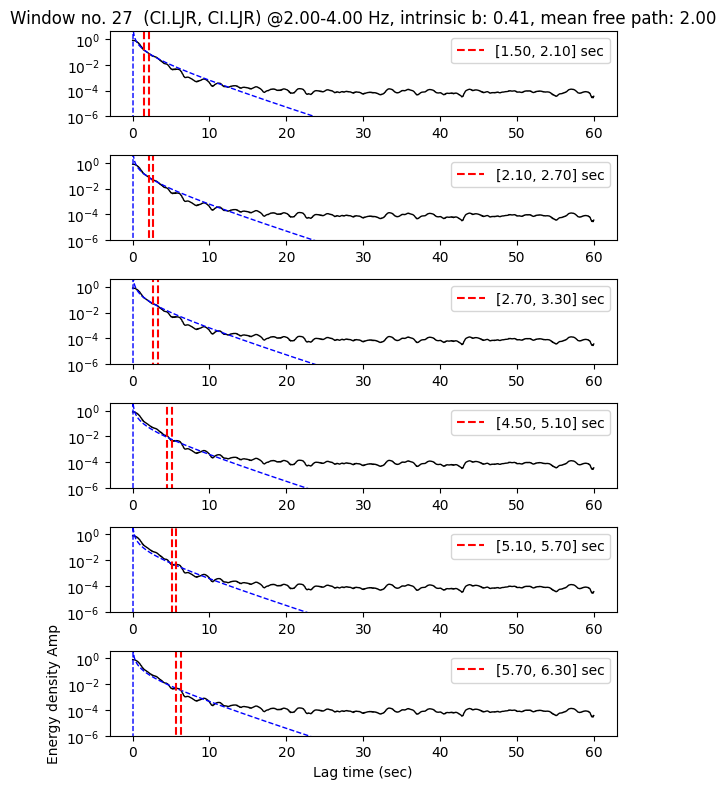

2024-09-27 12:25:00,408 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.39], mean_free: [2.]
2024-09-27 12:25:00,420 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.39) -- scaling amp: 12.06
2024-09-27 12:25:00,432 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.39) -- scaling amp: 12.06
2024-09-27 12:25:00,445 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.39) -- scaling amp: 12.44
2024-09-27 12:25:00,457 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.39) -- scaling amp: 7.73
2024-09-27 12:25:00,470 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.39) -- scaling amp: 7.23
2024-09-27 12:25:00,482 140207065536320 INFO attenuation_utils_mulwin

GET OPTIMAL


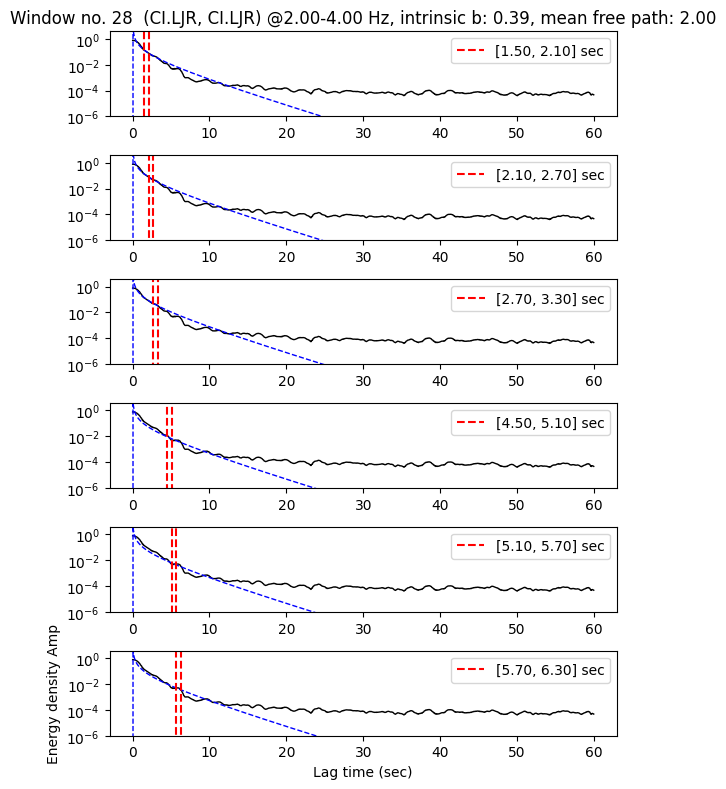

2024-09-27 12:25:01,002 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.34], mean_free: [2.]
2024-09-27 12:25:01,014 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.34) -- scaling amp: 10.96
2024-09-27 12:25:01,025 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.34) -- scaling amp: 10.84
2024-09-27 12:25:01,038 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.34) -- scaling amp: 10.48
2024-09-27 12:25:01,050 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.34) -- scaling amp: 5.29
2024-09-27 12:25:01,062 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.34) -- scaling amp: 4.85
2024-09-27 12:25:01,075 140207065536320 INFO attenuation_utils_mulwin

GET OPTIMAL


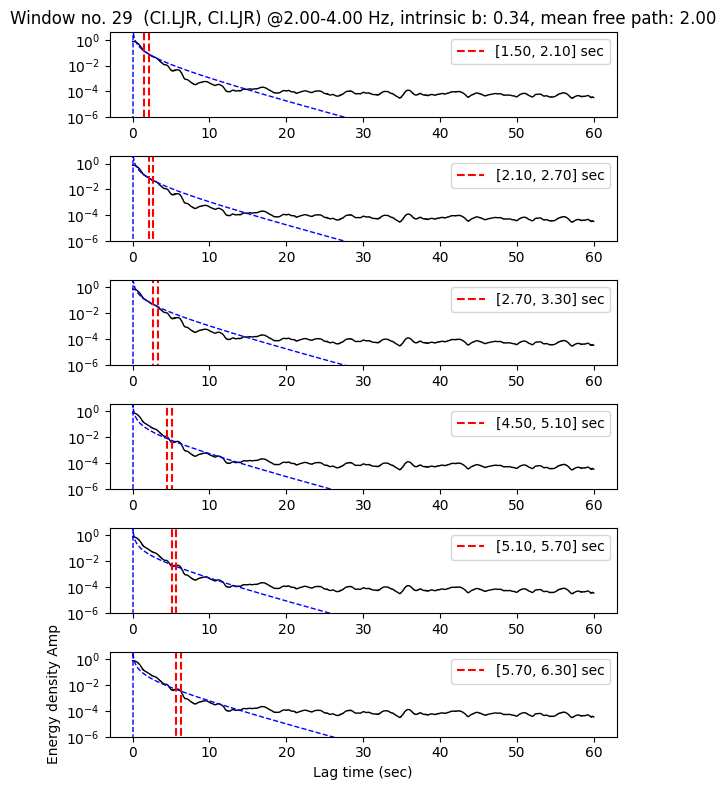

2024-09-27 12:25:01,458 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.28], mean_free: [1.2]
2024-09-27 12:25:01,469 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.2, 0.28) -- scaling amp: 5.72
2024-09-27 12:25:01,482 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.2, 0.28) -- scaling amp: 5.57
2024-09-27 12:25:01,494 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.2, 0.28) -- scaling amp: 5.07
2024-09-27 12:25:01,507 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.2, 0.28) -- scaling amp: 1.88
2024-09-27 12:25:01,518 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.2, 0.28) -- scaling amp: 1.70
2024-09-27 12:25:01,531 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


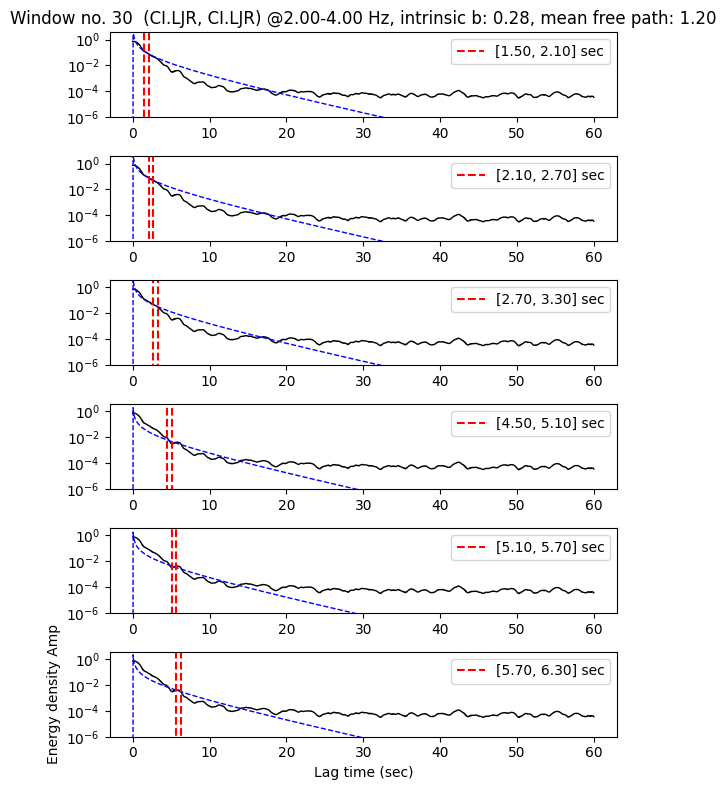

2024-09-27 12:25:01,913 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.27], mean_free: [1.4]
2024-09-27 12:25:01,925 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.4, 0.27) -- scaling amp: 6.36
2024-09-27 12:25:01,936 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.4, 0.27) -- scaling amp: 6.22
2024-09-27 12:25:01,949 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.4, 0.27) -- scaling amp: 5.75
2024-09-27 12:25:01,962 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.4, 0.27) -- scaling amp: 1.90
2024-09-27 12:25:01,974 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.4, 0.27) -- scaling amp: 1.77
2024-09-27 12:25:01,987 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


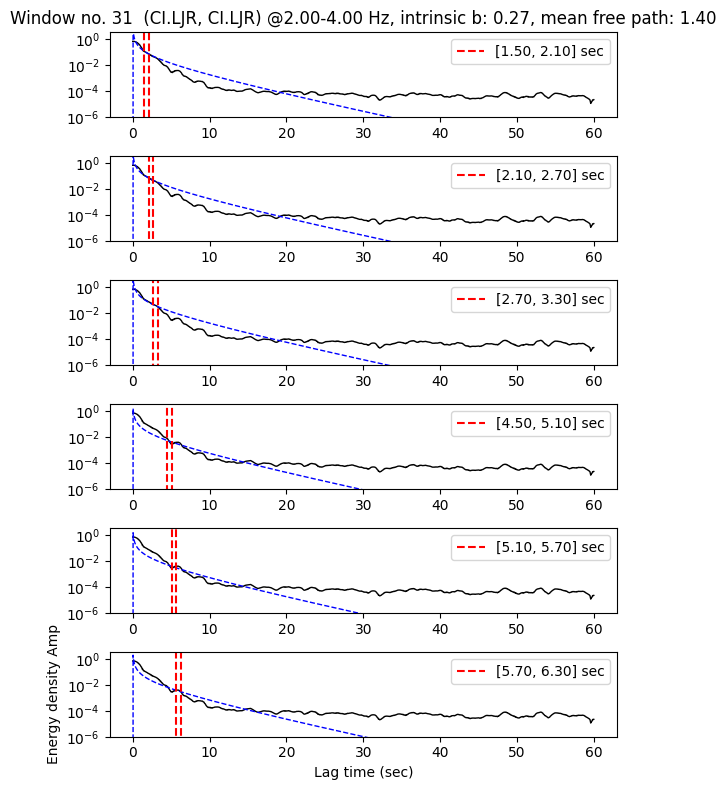

2024-09-27 12:25:02,372 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.29], mean_free: [0.8]
2024-09-27 12:25:02,383 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(0.8, 0.29) -- scaling amp: 4.03
2024-09-27 12:25:02,396 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(0.8, 0.29) -- scaling amp: 3.94
2024-09-27 12:25:02,409 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(0.8, 0.29) -- scaling amp: 3.67
2024-09-27 12:25:02,421 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(0.8, 0.29) -- scaling amp: 1.21
2024-09-27 12:25:02,433 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(0.8, 0.29) -- scaling amp: 1.17
2024-09-27 12:25:02,446 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


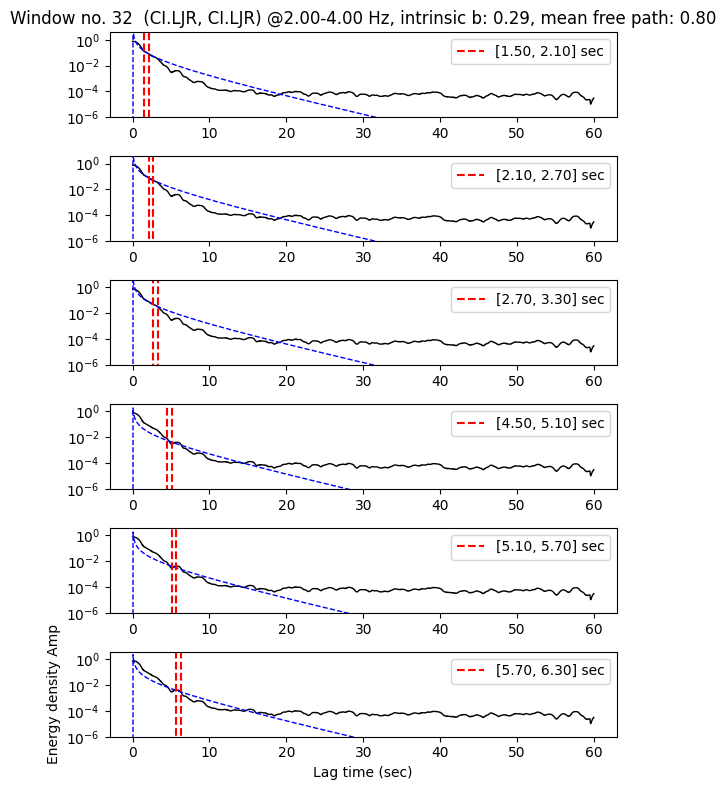

2024-09-27 12:25:02,829 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b 0.26, mean_free: 1.2
2024-09-27 12:25:02,840 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.2, 0.26) -- scaling amp: 6.23
2024-09-27 12:25:02,852 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.2, 0.26) -- scaling amp: 5.92
2024-09-27 12:25:02,864 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.2, 0.26) -- scaling amp: 5.30
2024-09-27 12:25:02,876 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.2, 0.26) -- scaling amp: 1.76
2024-09-27 12:25:02,889 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.2, 0.26) -- scaling amp: 1.63
2024-09-27 12:25:02,901 140207065536320 INFO attenuation_utils_mulwin.get_o

GET OPTIMAL


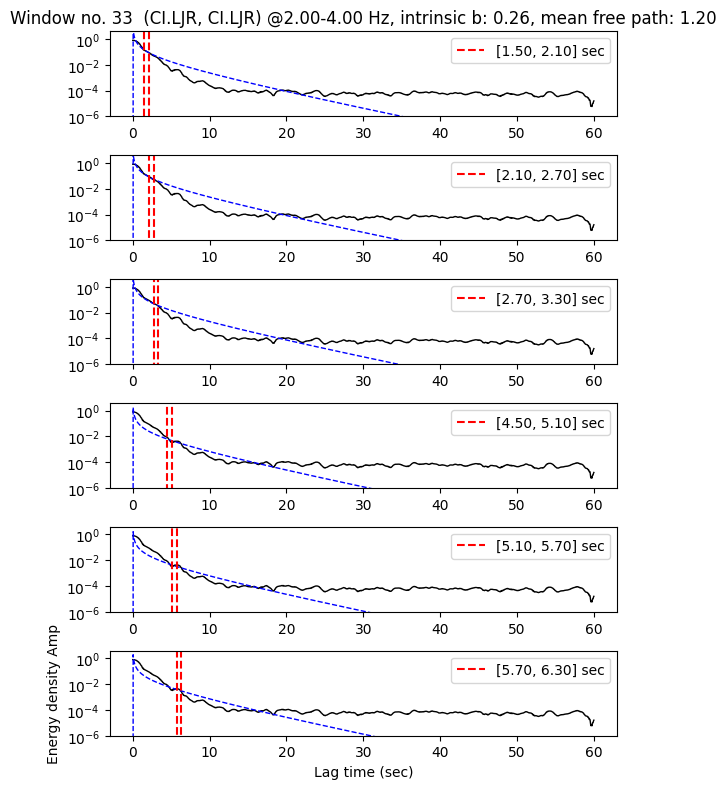

2024-09-27 12:25:03,442 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.23], mean_free: [2.]
2024-09-27 12:25:03,453 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.23) -- scaling amp: 9.78
2024-09-27 12:25:03,466 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.23) -- scaling amp: 9.35
2024-09-27 12:25:03,478 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.23) -- scaling amp: 8.14
2024-09-27 12:25:03,491 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.23) -- scaling amp: 2.65
2024-09-27 12:25:03,503 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.23) -- scaling amp: 2.47
2024-09-27 12:25:03,515 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


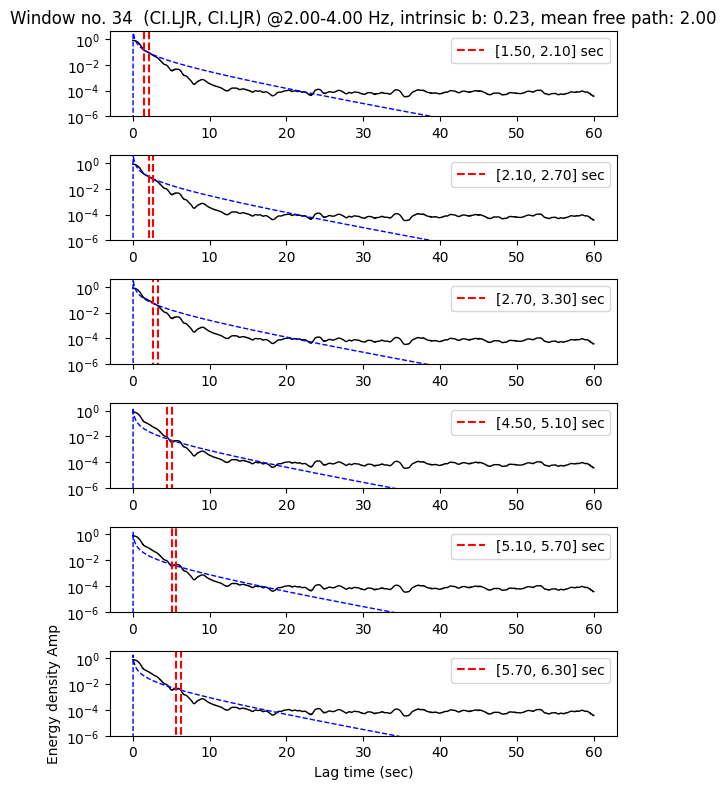

2024-09-27 12:25:03,887 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.19], mean_free: [1.6]
2024-09-27 12:25:03,899 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.19) -- scaling amp: 7.10
2024-09-27 12:25:03,912 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.19) -- scaling amp: 6.92
2024-09-27 12:25:03,923 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.19) -- scaling amp: 5.85
2024-09-27 12:25:03,936 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.19) -- scaling amp: 1.62
2024-09-27 12:25:03,947 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.19) -- scaling amp: 1.65
2024-09-27 12:25:03,960 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


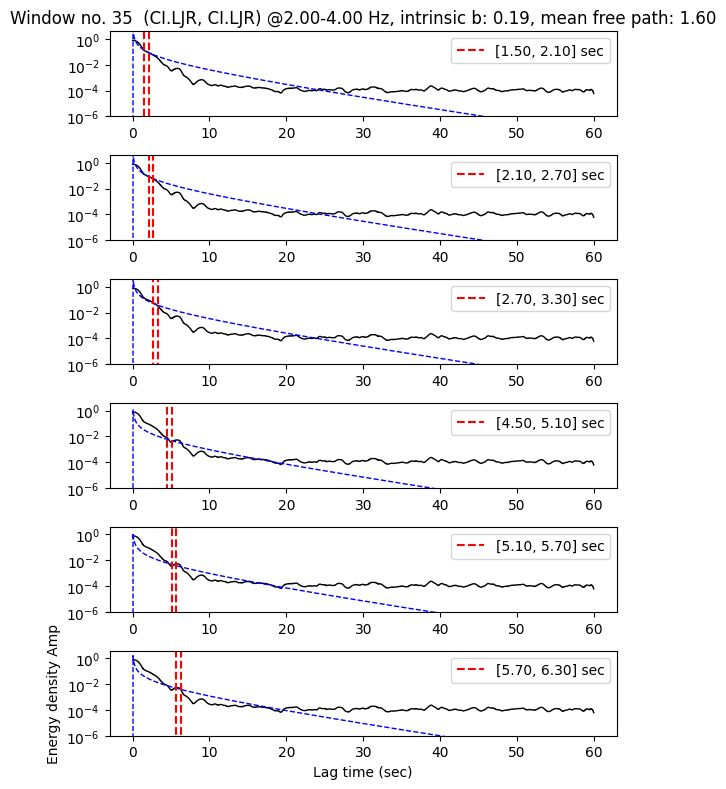

2024-09-27 12:25:04,333 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.22], mean_free: [1.2]
2024-09-27 12:25:04,345 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.2, 0.22) -- scaling amp: 5.51
2024-09-27 12:25:04,357 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.2, 0.22) -- scaling amp: 5.39
2024-09-27 12:25:04,370 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.2, 0.22) -- scaling amp: 4.45
2024-09-27 12:25:04,382 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.2, 0.22) -- scaling amp: 1.33
2024-09-27 12:25:04,394 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.2, 0.22) -- scaling amp: 1.28
2024-09-27 12:25:04,406 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


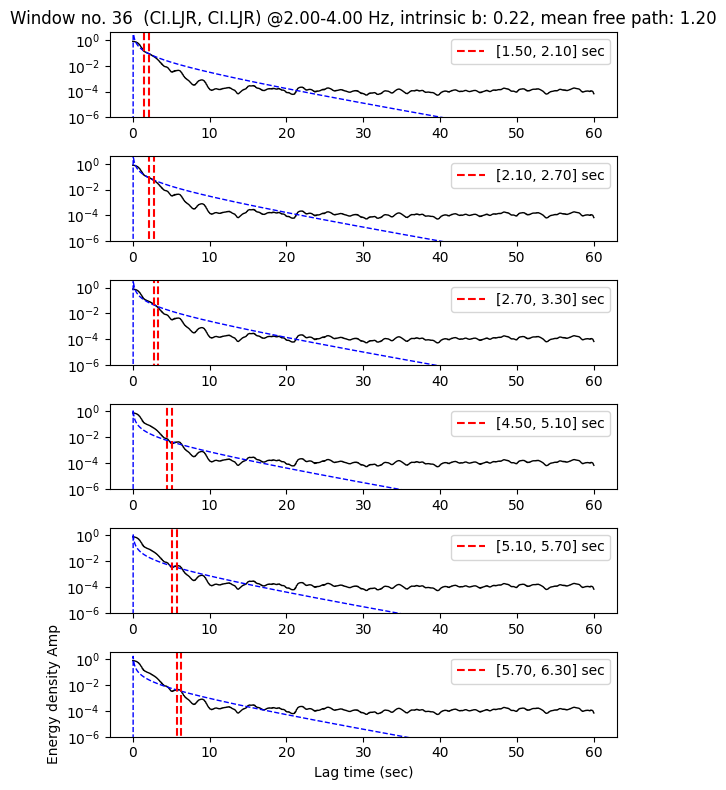

2024-09-27 12:25:04,781 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.28], mean_free: [1.4]
2024-09-27 12:25:04,793 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.4, 0.28) -- scaling amp: 7.16
2024-09-27 12:25:04,806 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.4, 0.28) -- scaling amp: 7.02
2024-09-27 12:25:04,818 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.4, 0.28) -- scaling amp: 5.97
2024-09-27 12:25:04,831 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.4, 0.28) -- scaling amp: 2.21
2024-09-27 12:25:04,842 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.4, 0.28) -- scaling amp: 2.22
2024-09-27 12:25:04,855 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


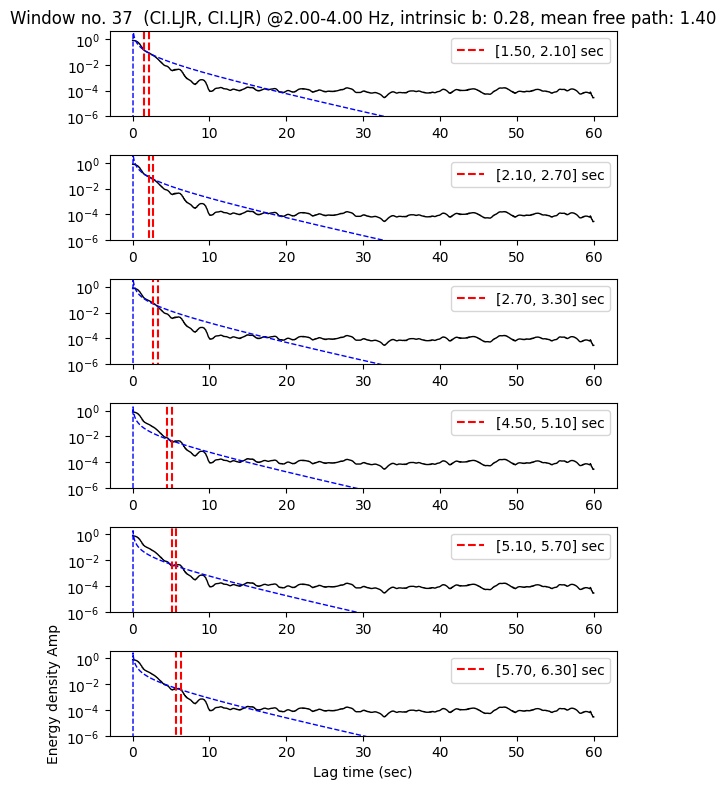

2024-09-27 12:25:05,342 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.36], mean_free: [2.]
2024-09-27 12:25:05,353 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.36) -- scaling amp: 11.93
2024-09-27 12:25:05,366 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.36) -- scaling amp: 11.92
2024-09-27 12:25:05,378 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.36) -- scaling amp: 10.59
2024-09-27 12:25:05,390 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.36) -- scaling amp: 4.93
2024-09-27 12:25:05,402 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.36) -- scaling amp: 5.66
2024-09-27 12:25:05,413 140207065536320 INFO attenuation_utils_mulwin

GET OPTIMAL


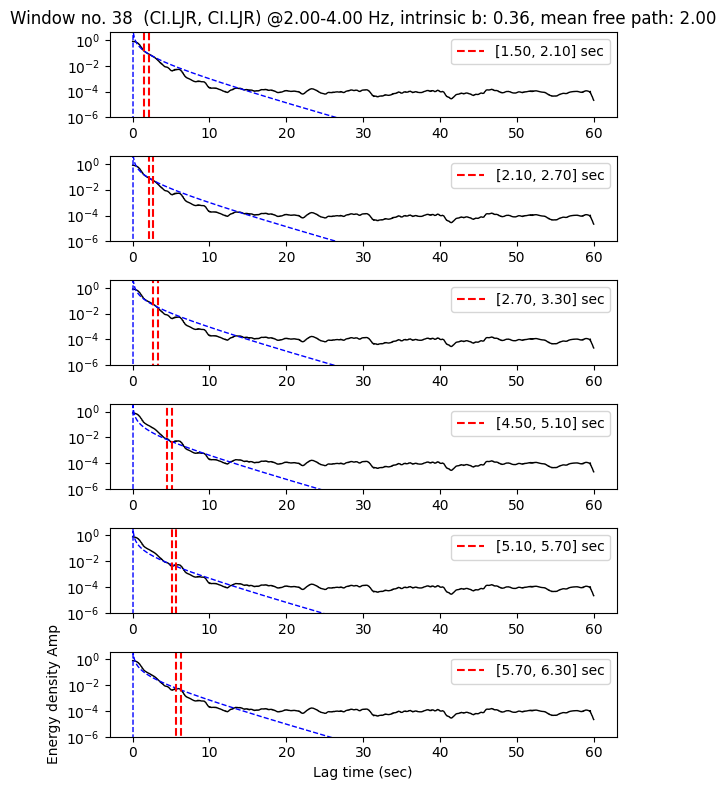

2024-09-27 12:25:05,788 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.38], mean_free: [1.6]
2024-09-27 12:25:05,800 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.38) -- scaling amp: 10.01
2024-09-27 12:25:05,812 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.38) -- scaling amp: 9.74
2024-09-27 12:25:05,825 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.38) -- scaling amp: 8.62
2024-09-27 12:25:05,837 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.38) -- scaling amp: 4.46
2024-09-27 12:25:05,849 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.38) -- scaling amp: 4.61
2024-09-27 12:25:05,861 140207065536320 INFO attenuation_utils_mulwin.

GET OPTIMAL


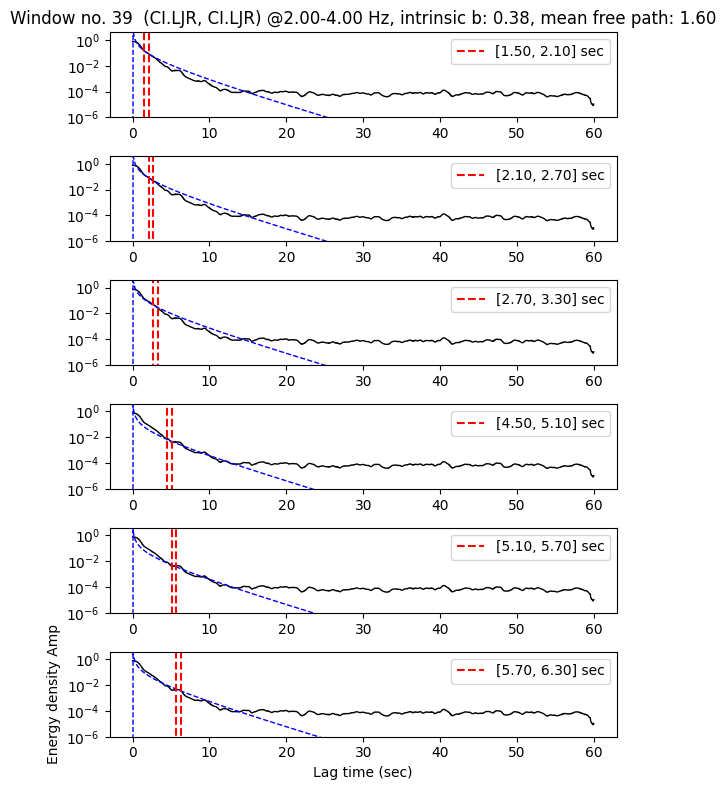

2024-09-27 12:25:06,237 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.39], mean_free: [1.8]
2024-09-27 12:25:06,248 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.8, 0.39) -- scaling amp: 11.42
2024-09-27 12:25:06,260 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.8, 0.39) -- scaling amp: 10.88
2024-09-27 12:25:06,272 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.8, 0.39) -- scaling amp: 9.70
2024-09-27 12:25:06,285 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.8, 0.39) -- scaling amp: 5.37
2024-09-27 12:25:06,298 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.8, 0.39) -- scaling amp: 5.40
2024-09-27 12:25:06,310 140207065536320 INFO attenuation_utils_mulwin

GET OPTIMAL


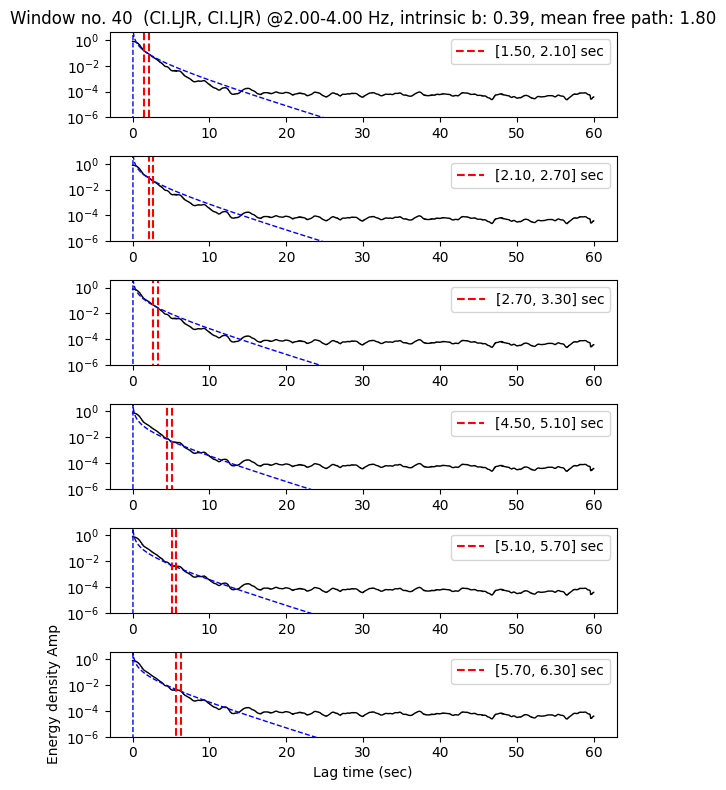

2024-09-27 12:25:06,685 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.38], mean_free: [2.]
2024-09-27 12:25:06,697 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.38) -- scaling amp: 12.38
2024-09-27 12:25:06,709 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.38) -- scaling amp: 12.13
2024-09-27 12:25:06,721 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.38) -- scaling amp: 11.07
2024-09-27 12:25:06,734 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.38) -- scaling amp: 6.29
2024-09-27 12:25:06,746 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.38) -- scaling amp: 6.06
2024-09-27 12:25:06,758 140207065536320 INFO attenuation_utils_mulwin

GET OPTIMAL


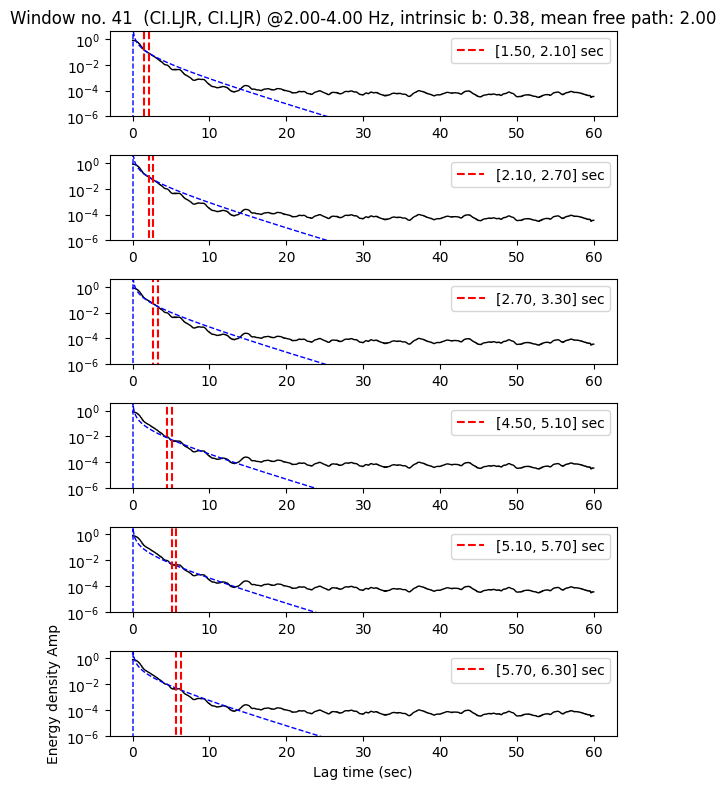

2024-09-27 12:25:07,133 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.32], mean_free: [2.]
2024-09-27 12:25:07,144 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 10.61
2024-09-27 12:25:07,156 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 10.13
2024-09-27 12:25:07,167 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 9.01
2024-09-27 12:25:07,179 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 4.49
2024-09-27 12:25:07,191 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 4.08
2024-09-27 12:25:07,203 140207065536320 INFO attenuation_utils_mulwin.

GET OPTIMAL


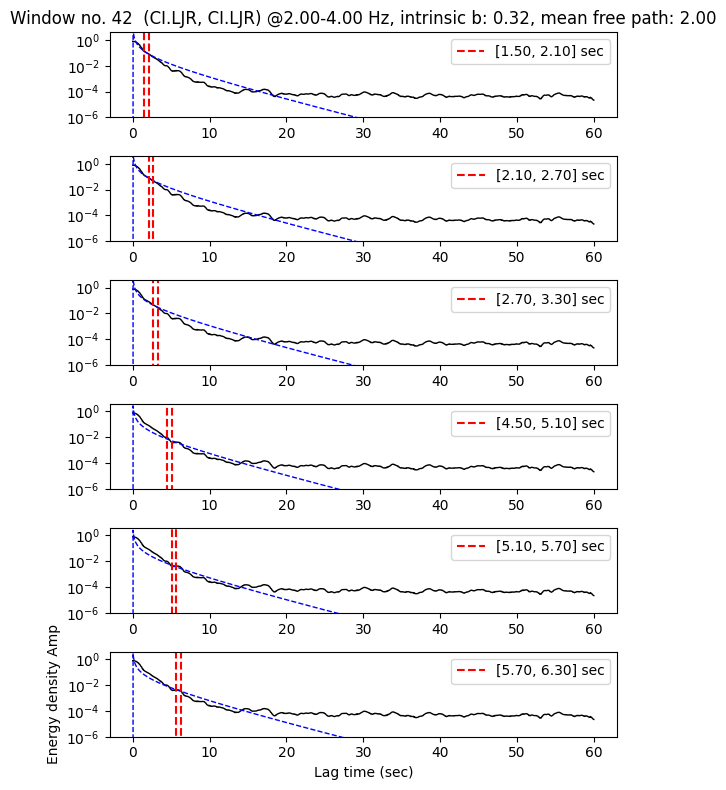

2024-09-27 12:25:07,706 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.26], mean_free: [1.8]
2024-09-27 12:25:07,717 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.8, 0.26) -- scaling amp: 8.26
2024-09-27 12:25:07,730 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.8, 0.26) -- scaling amp: 7.68
2024-09-27 12:25:07,742 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.8, 0.26) -- scaling amp: 6.70
2024-09-27 12:25:07,754 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.8, 0.26) -- scaling amp: 2.66
2024-09-27 12:25:07,766 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.8, 0.26) -- scaling amp: 2.39
2024-09-27 12:25:07,779 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


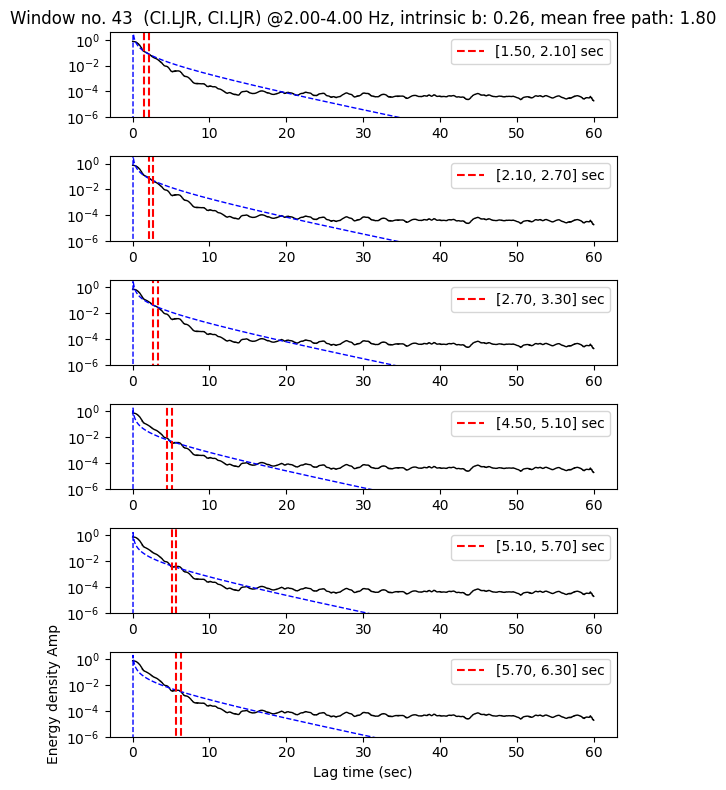

2024-09-27 12:25:08,155 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.24], mean_free: [1.6]
2024-09-27 12:25:08,166 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.24) -- scaling amp: 7.28
2024-09-27 12:25:08,179 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.24) -- scaling amp: 6.90
2024-09-27 12:25:08,191 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.24) -- scaling amp: 6.13
2024-09-27 12:25:08,203 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.24) -- scaling amp: 2.15
2024-09-27 12:25:08,215 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.24) -- scaling amp: 1.93
2024-09-27 12:25:08,228 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


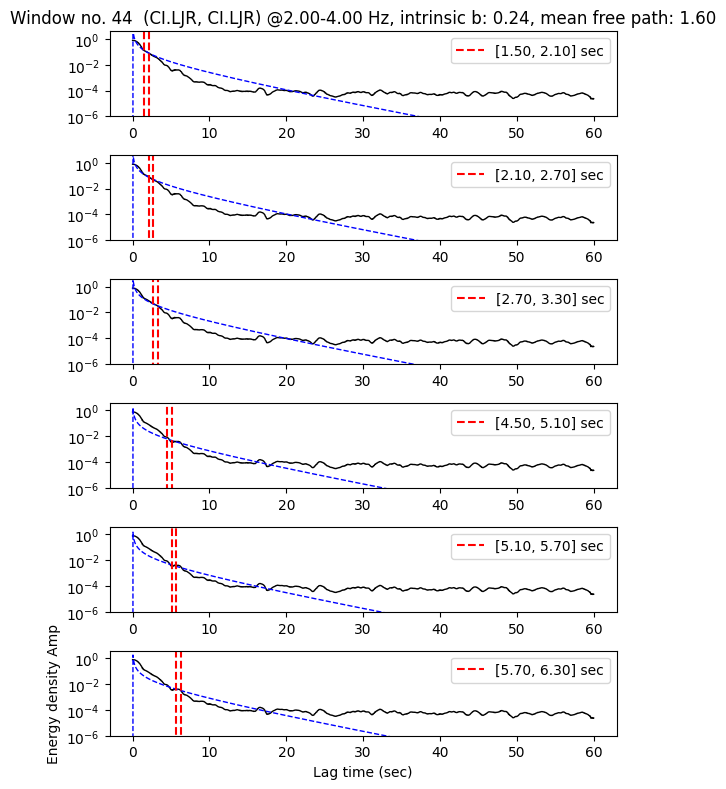

2024-09-27 12:25:08,603 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.22], mean_free: [1.4]
2024-09-27 12:25:08,616 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.4, 0.22) -- scaling amp: 6.42
2024-09-27 12:25:08,627 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.4, 0.22) -- scaling amp: 6.07
2024-09-27 12:25:08,640 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.4, 0.22) -- scaling amp: 5.27
2024-09-27 12:25:08,651 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.4, 0.22) -- scaling amp: 1.85
2024-09-27 12:25:08,664 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.4, 0.22) -- scaling amp: 1.64
2024-09-27 12:25:08,676 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


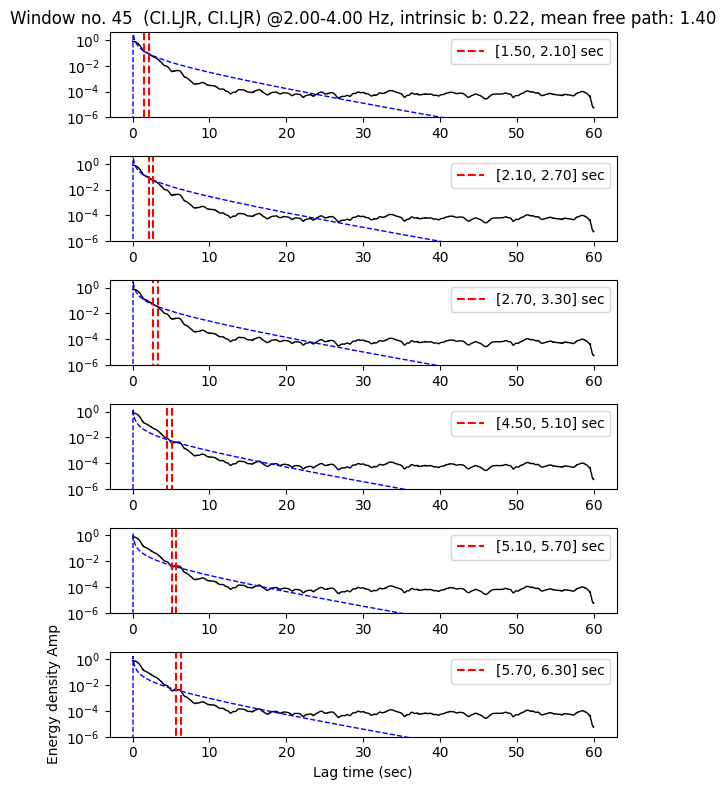

2024-09-27 12:25:09,050 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.19], mean_free: [1.]
2024-09-27 12:25:09,063 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.0, 0.19) -- scaling amp: 4.44
2024-09-27 12:25:09,075 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.0, 0.19) -- scaling amp: 4.17
2024-09-27 12:25:09,088 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.0, 0.19) -- scaling amp: 3.48
2024-09-27 12:25:09,100 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.0, 0.19) -- scaling amp: 1.12
2024-09-27 12:25:09,113 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.0, 0.19) -- scaling amp: 0.99
2024-09-27 12:25:09,125 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


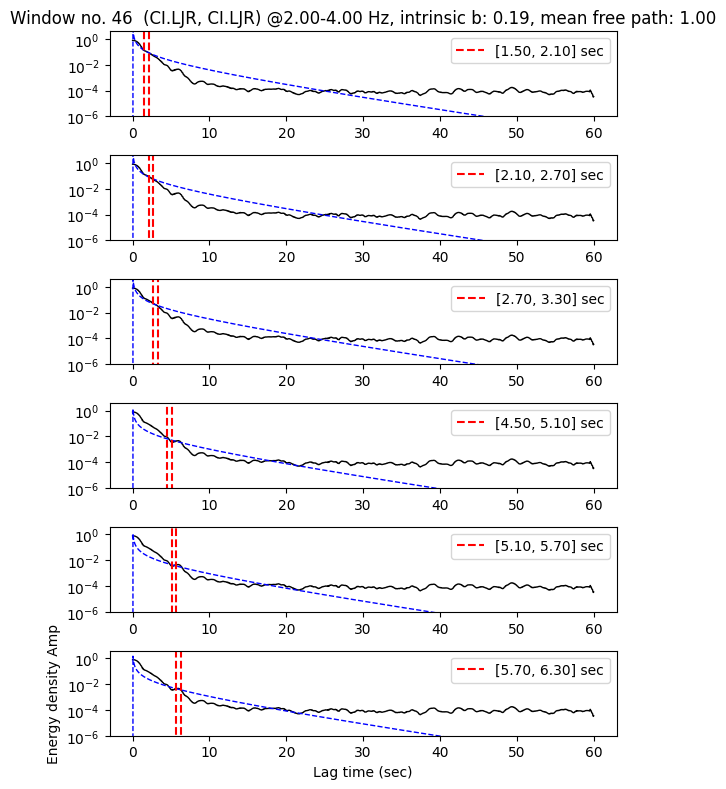

2024-09-27 12:25:09,500 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.21], mean_free: [2.]
2024-09-27 12:25:09,512 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.21) -- scaling amp: 8.94
2024-09-27 12:25:09,524 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.21) -- scaling amp: 8.38
2024-09-27 12:25:09,537 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.21) -- scaling amp: 6.90
2024-09-27 12:25:09,548 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.21) -- scaling amp: 2.14
2024-09-27 12:25:09,559 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.21) -- scaling amp: 1.86
2024-09-27 12:25:09,572 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


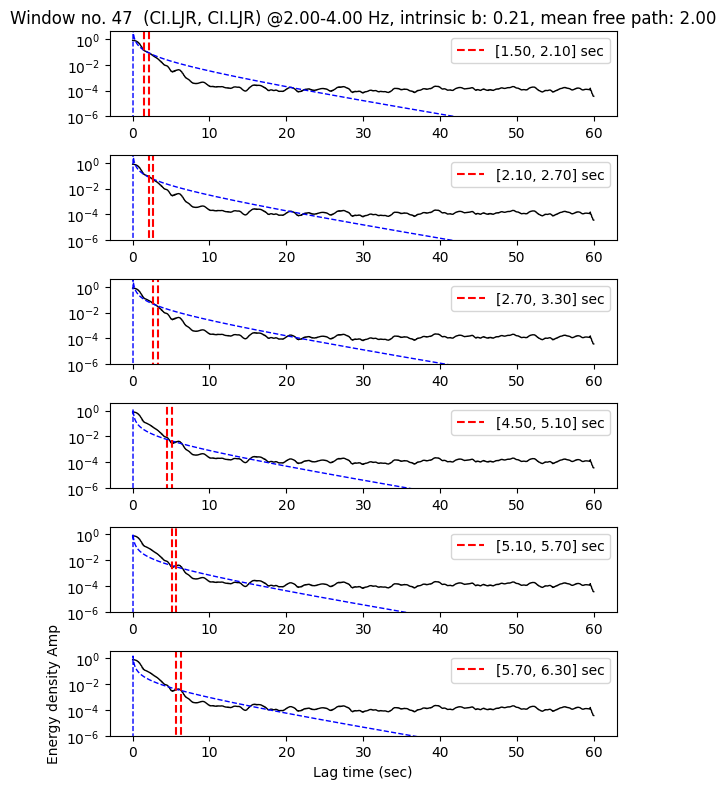

2024-09-27 12:25:10,080 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.27], mean_free: [2.]
2024-09-27 12:25:10,091 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.27) -- scaling amp: 9.55
2024-09-27 12:25:10,104 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.27) -- scaling amp: 9.20
2024-09-27 12:25:10,116 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.27) -- scaling amp: 7.81
2024-09-27 12:25:10,128 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.27) -- scaling amp: 3.03
2024-09-27 12:25:10,140 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.27) -- scaling amp: 2.78
2024-09-27 12:25:10,152 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


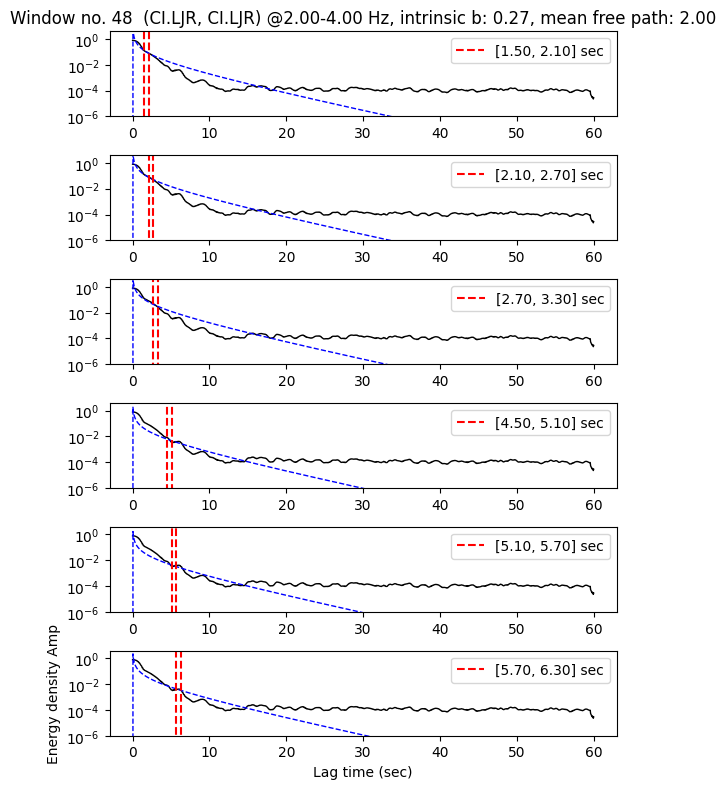

2024-09-27 12:25:10,528 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.32], mean_free: [2.]
2024-09-27 12:25:10,539 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 10.45
2024-09-27 12:25:10,551 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 10.07
2024-09-27 12:25:10,562 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 8.83
2024-09-27 12:25:10,574 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 4.11
2024-09-27 12:25:10,587 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 4.01
2024-09-27 12:25:10,599 140207065536320 INFO attenuation_utils_mulwin.

GET OPTIMAL


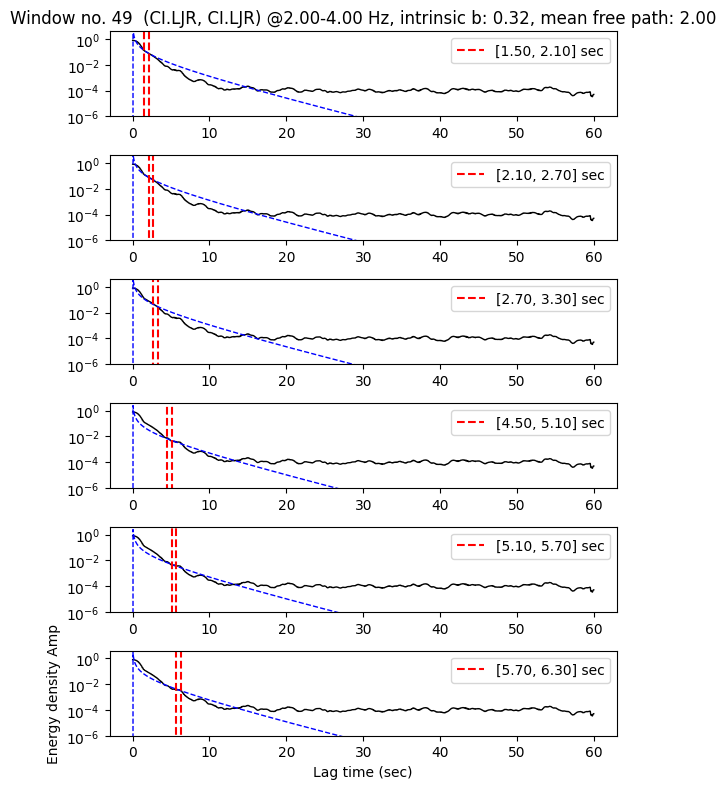

2024-09-27 12:25:10,974 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.38], mean_free: [2.]
2024-09-27 12:25:10,986 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.38) -- scaling amp: 11.50
2024-09-27 12:25:10,998 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.38) -- scaling amp: 11.14
2024-09-27 12:25:11,010 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.38) -- scaling amp: 10.12
2024-09-27 12:25:11,023 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.38) -- scaling amp: 5.81
2024-09-27 12:25:11,035 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.38) -- scaling amp: 5.68
2024-09-27 12:25:11,047 140207065536320 INFO attenuation_utils_mulwin

GET OPTIMAL


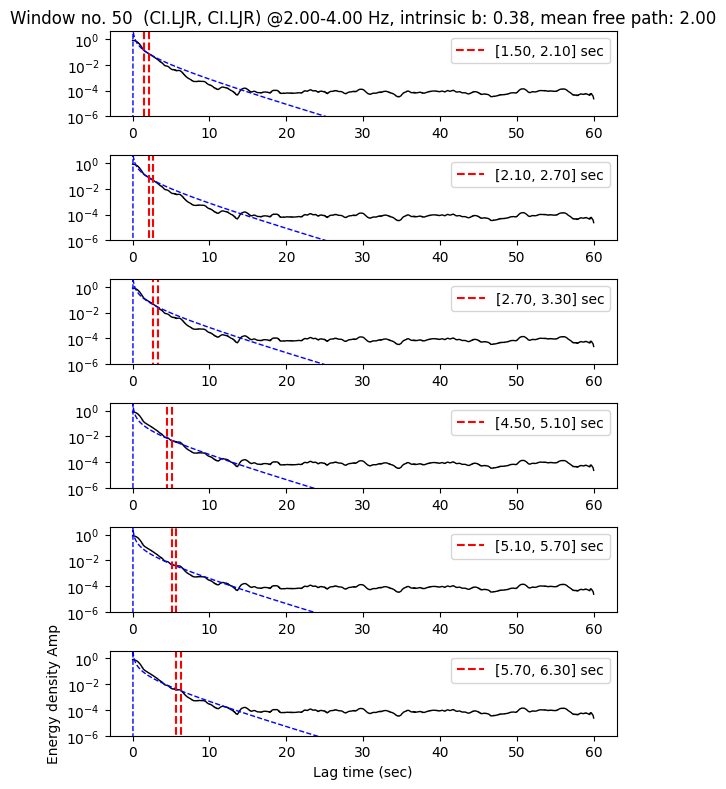

2024-09-27 12:25:11,422 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.42], mean_free: [1.6]
2024-09-27 12:25:11,434 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.42) -- scaling amp: 9.66
2024-09-27 12:25:11,446 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.42) -- scaling amp: 9.59
2024-09-27 12:25:11,459 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.42) -- scaling amp: 9.06
2024-09-27 12:25:11,471 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.42) -- scaling amp: 5.44
2024-09-27 12:25:11,484 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.42) -- scaling amp: 5.41
2024-09-27 12:25:11,496 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


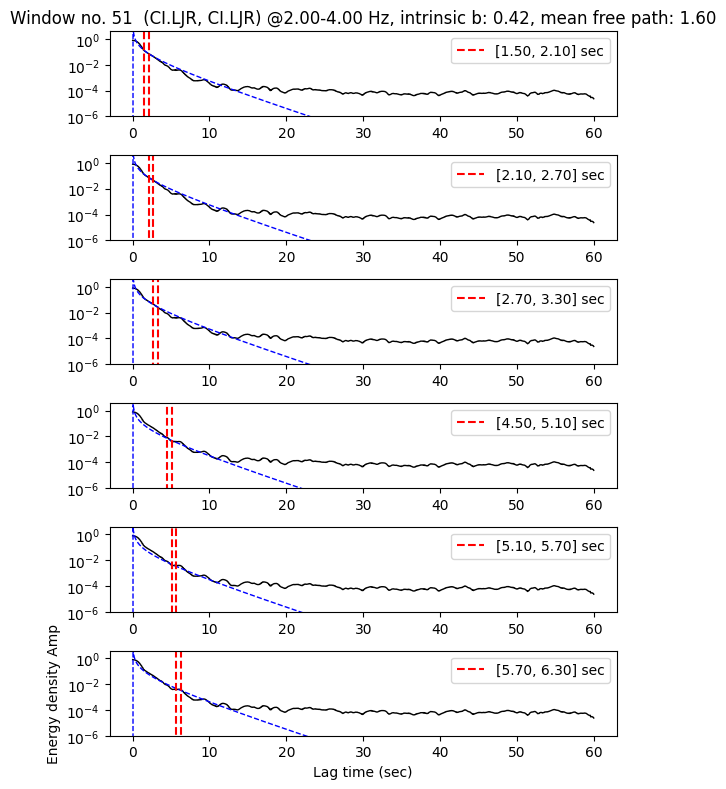

2024-09-27 12:25:11,871 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.43], mean_free: [1.6]
2024-09-27 12:25:11,884 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.43) -- scaling amp: 9.80
2024-09-27 12:25:11,896 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.43) -- scaling amp: 9.63
2024-09-27 12:25:11,909 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.43) -- scaling amp: 9.15
2024-09-27 12:25:11,921 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.43) -- scaling amp: 5.58
2024-09-27 12:25:11,933 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.43) -- scaling amp: 5.50
2024-09-27 12:25:11,945 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


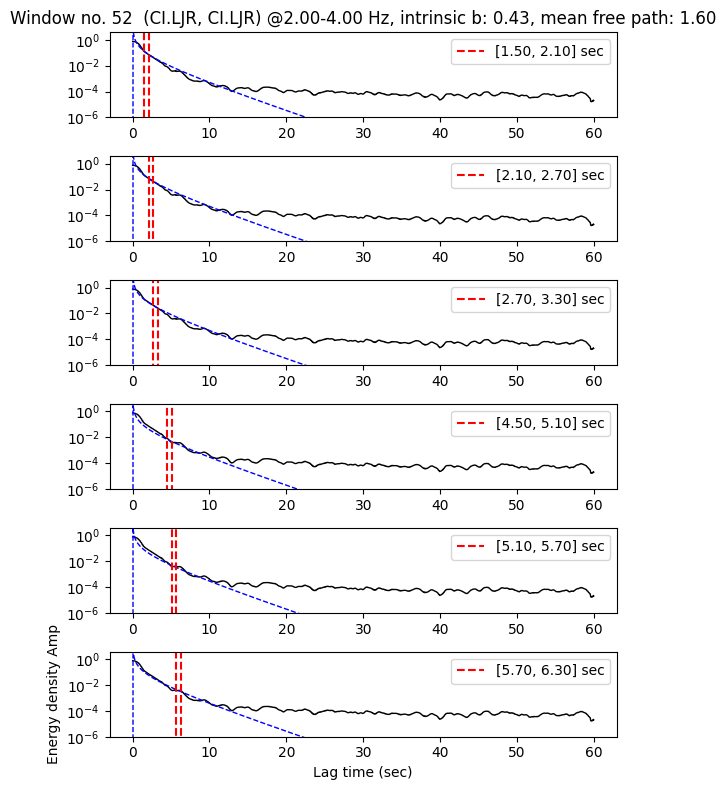

2024-09-27 12:25:12,451 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.37], mean_free: [2.]
2024-09-27 12:25:12,464 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.37) -- scaling amp: 11.08
2024-09-27 12:25:12,476 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.37) -- scaling amp: 10.48
2024-09-27 12:25:12,489 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.37) -- scaling amp: 9.58
2024-09-27 12:25:12,500 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.37) -- scaling amp: 5.58
2024-09-27 12:25:12,513 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.37) -- scaling amp: 5.57
2024-09-27 12:25:12,526 140207065536320 INFO attenuation_utils_mulwin.

GET OPTIMAL


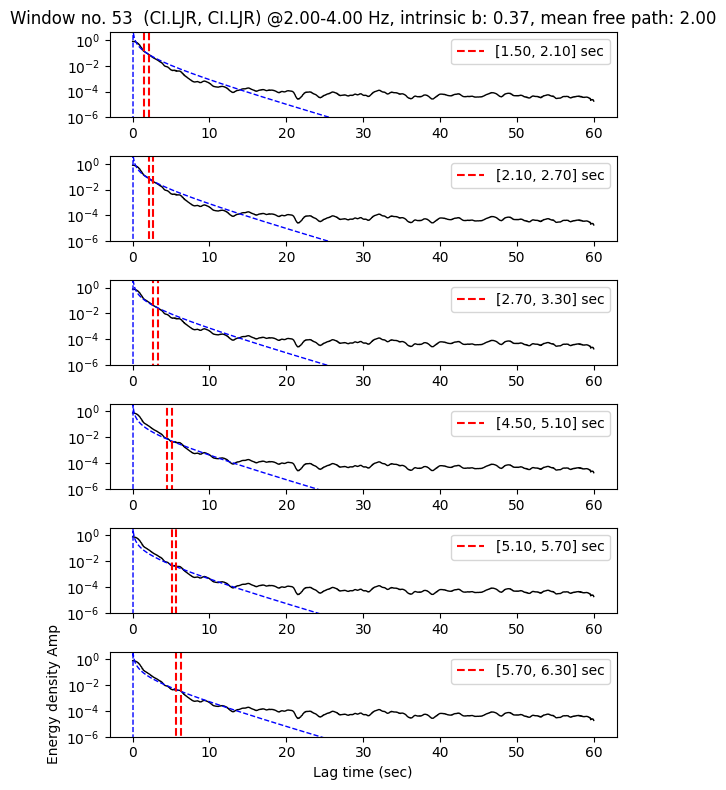

2024-09-27 12:25:12,902 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.33], mean_free: [1.4]
2024-09-27 12:25:12,914 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.4, 0.33) -- scaling amp: 7.19
2024-09-27 12:25:12,927 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.4, 0.33) -- scaling amp: 6.50
2024-09-27 12:25:12,938 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.4, 0.33) -- scaling amp: 5.75
2024-09-27 12:25:12,951 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.4, 0.33) -- scaling amp: 2.98
2024-09-27 12:25:12,964 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.4, 0.33) -- scaling amp: 3.02
2024-09-27 12:25:12,976 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


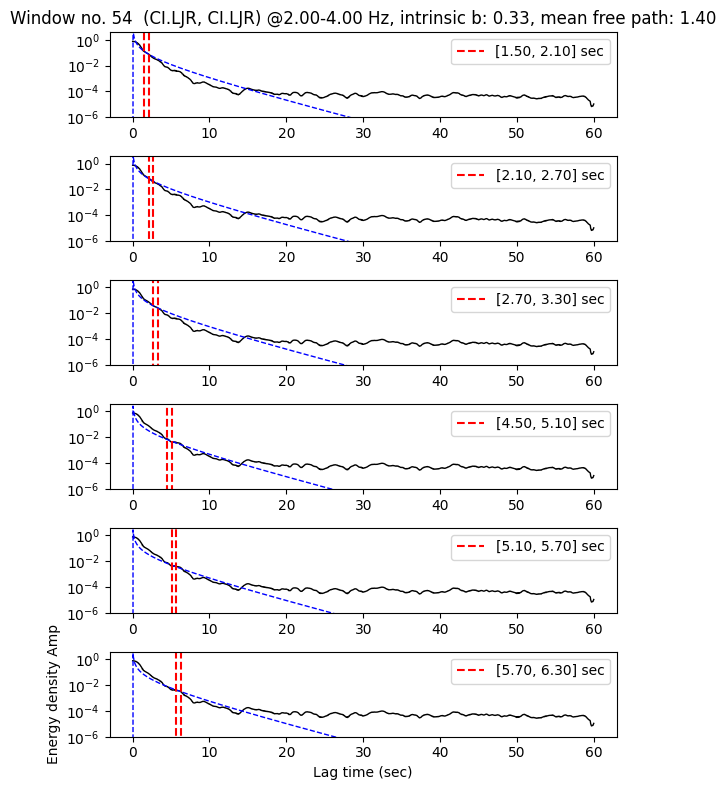

2024-09-27 12:25:13,356 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.33], mean_free: [2.]
2024-09-27 12:25:13,367 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.33) -- scaling amp: 10.53
2024-09-27 12:25:13,380 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.33) -- scaling amp: 9.34
2024-09-27 12:25:13,392 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.33) -- scaling amp: 8.30
2024-09-27 12:25:13,404 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.33) -- scaling amp: 4.14
2024-09-27 12:25:13,416 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.33) -- scaling amp: 4.13
2024-09-27 12:25:13,429 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


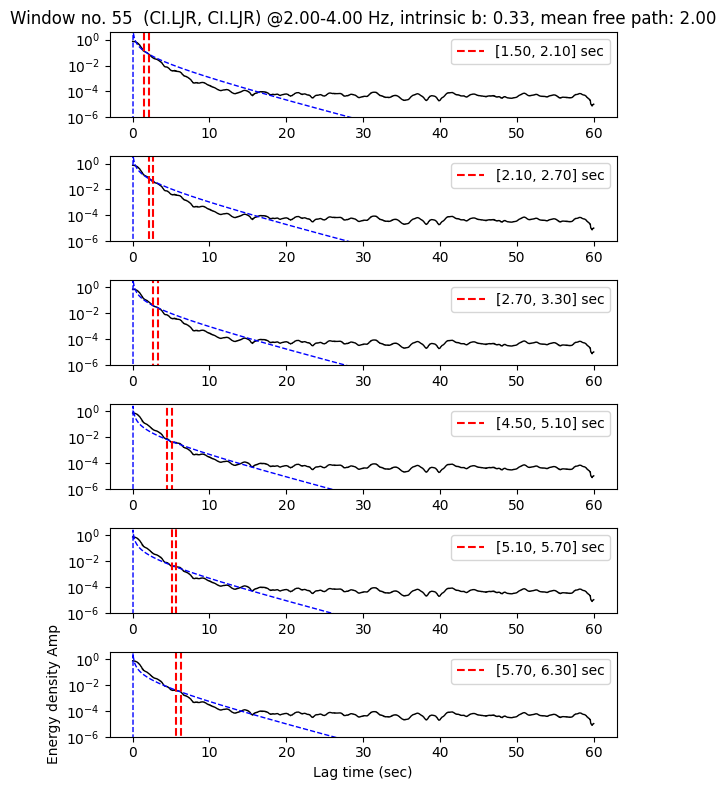

2024-09-27 12:25:13,807 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.34], mean_free: [1.8]
2024-09-27 12:25:13,818 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.8, 0.34) -- scaling amp: 10.05
2024-09-27 12:25:13,831 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.8, 0.34) -- scaling amp: 9.08
2024-09-27 12:25:13,844 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.8, 0.34) -- scaling amp: 8.35
2024-09-27 12:25:13,855 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.8, 0.34) -- scaling amp: 3.99
2024-09-27 12:25:13,866 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.8, 0.34) -- scaling amp: 3.86
2024-09-27 12:25:13,879 140207065536320 INFO attenuation_utils_mulwin.

GET OPTIMAL


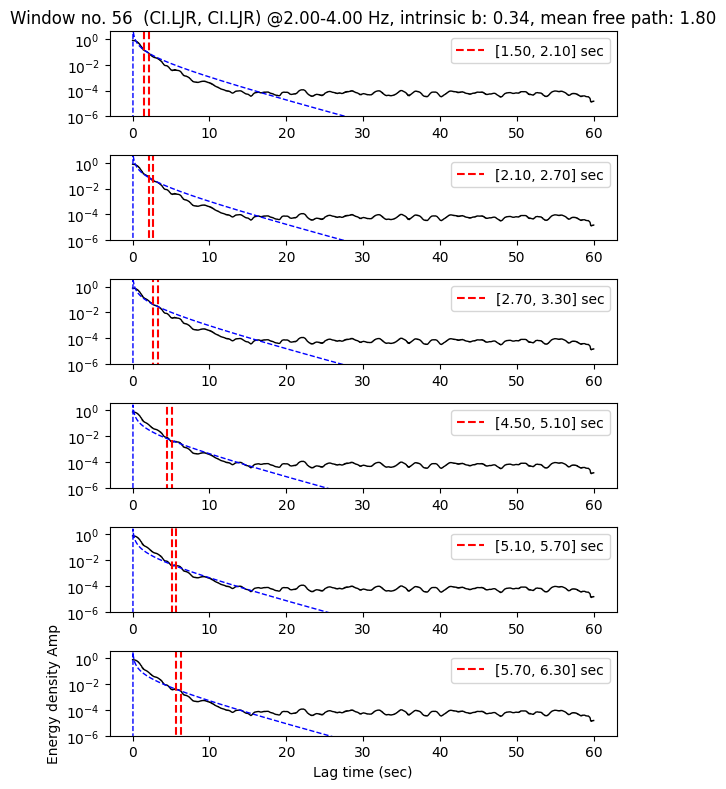

2024-09-27 12:25:14,254 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.32], mean_free: [2.]
2024-09-27 12:25:14,265 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 11.21
2024-09-27 12:25:14,278 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 10.20
2024-09-27 12:25:14,291 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 9.40
2024-09-27 12:25:14,303 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 4.04
2024-09-27 12:25:14,315 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.32) -- scaling amp: 4.05
2024-09-27 12:25:14,328 140207065536320 INFO attenuation_utils_mulwin.

GET OPTIMAL


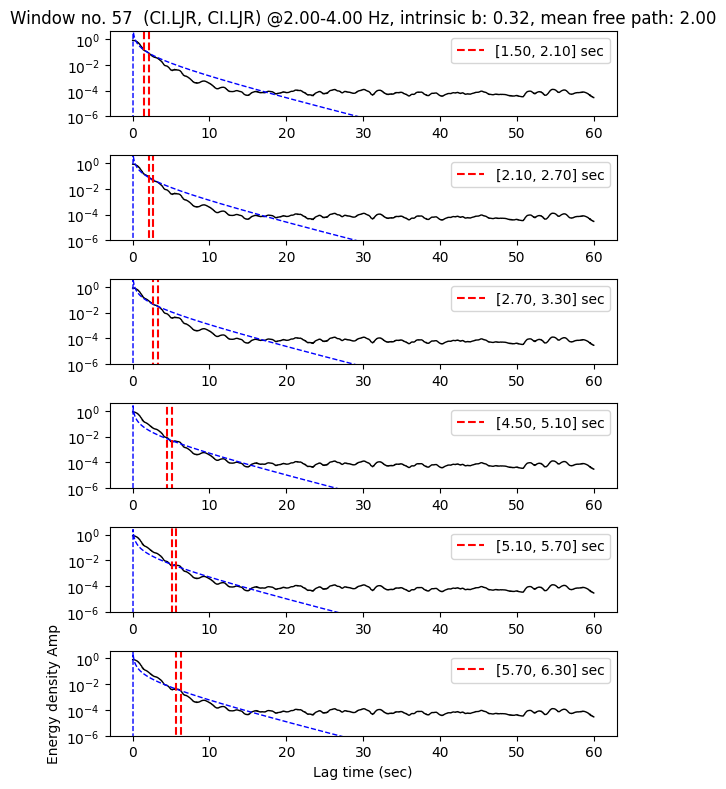

2024-09-27 12:25:14,848 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.31], mean_free: [1.]
2024-09-27 12:25:14,860 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.0, 0.31) -- scaling amp: 5.69
2024-09-27 12:25:14,872 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.0, 0.31) -- scaling amp: 5.11
2024-09-27 12:25:14,885 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.0, 0.31) -- scaling amp: 4.65
2024-09-27 12:25:14,897 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.0, 0.31) -- scaling amp: 2.22
2024-09-27 12:25:14,909 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.0, 0.31) -- scaling amp: 2.26
2024-09-27 12:25:14,922 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


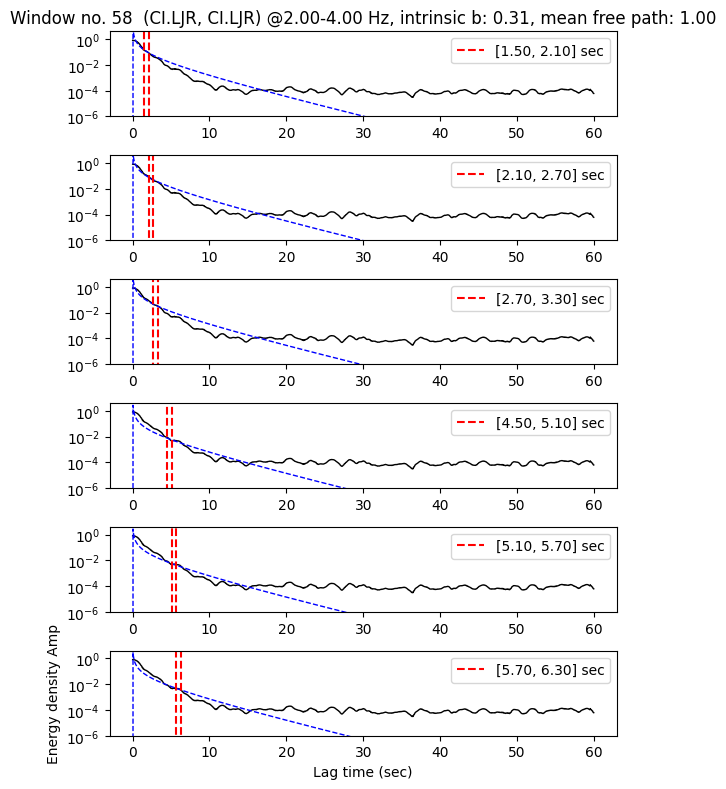

2024-09-27 12:25:15,304 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.3], mean_free: [2.]
2024-09-27 12:25:15,316 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(2.0, 0.30) -- scaling amp: 11.46
2024-09-27 12:25:15,327 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(2.0, 0.30) -- scaling amp: 10.27
2024-09-27 12:25:15,341 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(2.0, 0.30) -- scaling amp: 9.47
2024-09-27 12:25:15,353 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(2.0, 0.30) -- scaling amp: 5.06
2024-09-27 12:25:15,367 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(2.0, 0.30) -- scaling amp: 4.87
2024-09-27 12:25:15,380 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


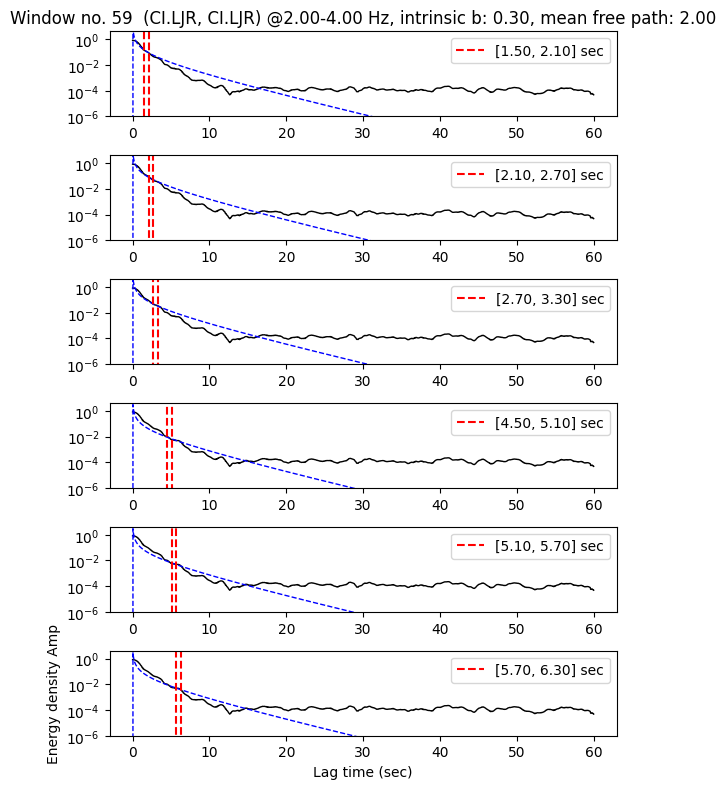

2024-09-27 12:25:15,757 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.32], mean_free: [1.6]
2024-09-27 12:25:15,768 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.6, 0.32) -- scaling amp: 9.18
2024-09-27 12:25:15,781 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.6, 0.32) -- scaling amp: 8.22
2024-09-27 12:25:15,793 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.6, 0.32) -- scaling amp: 7.57
2024-09-27 12:25:15,805 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.6, 0.32) -- scaling amp: 4.50
2024-09-27 12:25:15,818 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.6, 0.32) -- scaling amp: 4.23
2024-09-27 12:25:15,829 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


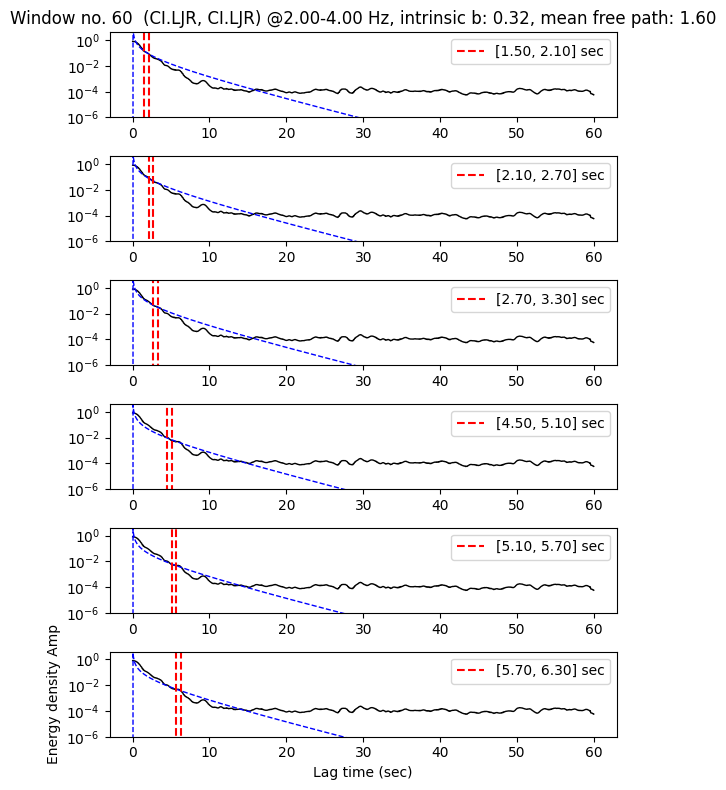

2024-09-27 12:25:16,203 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.35], mean_free: [1.8]
2024-09-27 12:25:16,214 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.8, 0.35) -- scaling amp: 10.49
2024-09-27 12:25:16,227 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.8, 0.35) -- scaling amp: 9.29
2024-09-27 12:25:16,239 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.8, 0.35) -- scaling amp: 8.35
2024-09-27 12:25:16,251 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.8, 0.35) -- scaling amp: 5.63
2024-09-27 12:25:16,263 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.8, 0.35) -- scaling amp: 5.55
2024-09-27 12:25:16,276 140207065536320 INFO attenuation_utils_mulwin.

GET OPTIMAL


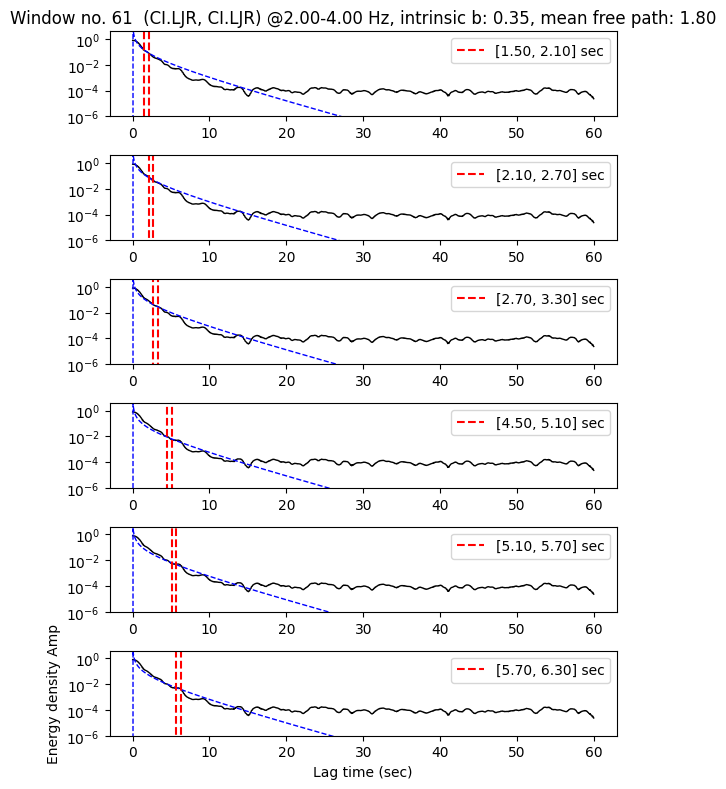

2024-09-27 12:25:16,785 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.39], mean_free: [1.]
2024-09-27 12:25:16,797 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.0, 0.39) -- scaling amp: 6.26
2024-09-27 12:25:16,809 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.0, 0.39) -- scaling amp: 5.61
2024-09-27 12:25:16,821 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.0, 0.39) -- scaling amp: 5.28
2024-09-27 12:25:16,834 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.0, 0.39) -- scaling amp: 3.97
2024-09-27 12:25:16,846 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.0, 0.39) -- scaling amp: 3.86
2024-09-27 12:25:16,857 140207065536320 INFO attenuation_utils_mulwin.ge

GET OPTIMAL


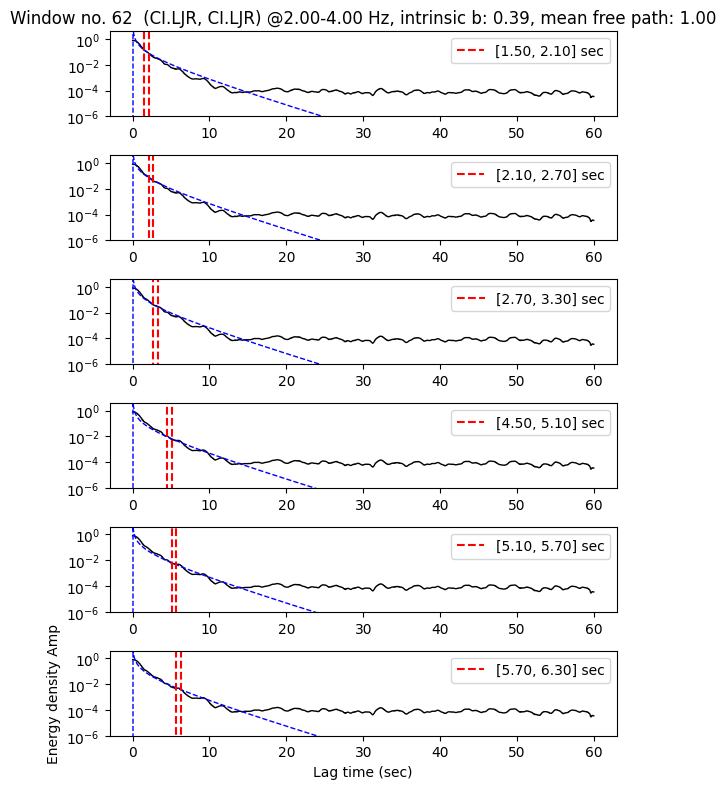

2024-09-27 12:25:17,237 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.39], mean_free: [1.2]
2024-09-27 12:25:17,249 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.2, 0.39) -- scaling amp: 7.72
2024-09-27 12:25:17,262 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.2, 0.39) -- scaling amp: 6.93
2024-09-27 12:25:17,274 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.2, 0.39) -- scaling amp: 6.55
2024-09-27 12:25:17,287 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.2, 0.39) -- scaling amp: 5.08
2024-09-27 12:25:17,298 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.2, 0.39) -- scaling amp: 4.94
2024-09-27 12:25:17,311 140207065536320 INFO attenuation_utils_mulwin.g

GET OPTIMAL


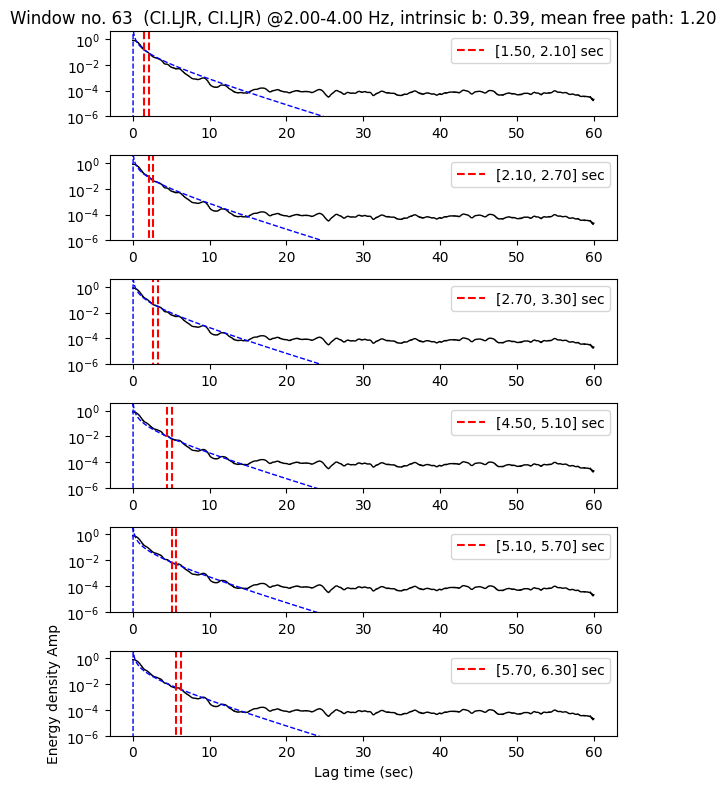

2024-09-27 12:25:17,690 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): Station Pair: (CI.LJR, CI.LJR), intrinsic_b [0.35], mean_free: [1.8]
2024-09-27 12:25:17,701 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 0, pair 0, (mfp, intb)=(1.8, 0.35) -- scaling amp: 10.95
2024-09-27 12:25:17,713 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 1, pair 0, (mfp, intb)=(1.8, 0.35) -- scaling amp: 9.76
2024-09-27 12:25:17,725 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 2, pair 0, (mfp, intb)=(1.8, 0.35) -- scaling amp: 8.74
2024-09-27 12:25:17,737 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 3, pair 0, (mfp, intb)=(1.8, 0.35) -- scaling amp: 6.16
2024-09-27 12:25:17,749 140207065536320 INFO attenuation_utils_mulwin.get_optimal_Esyn(): nwindow 4, pair 0, (mfp, intb)=(1.8, 0.35) -- scaling amp: 6.48
2024-09-27 12:25:17,762 140207065536320 INFO attenuation_utils_mulwin.

GET OPTIMAL


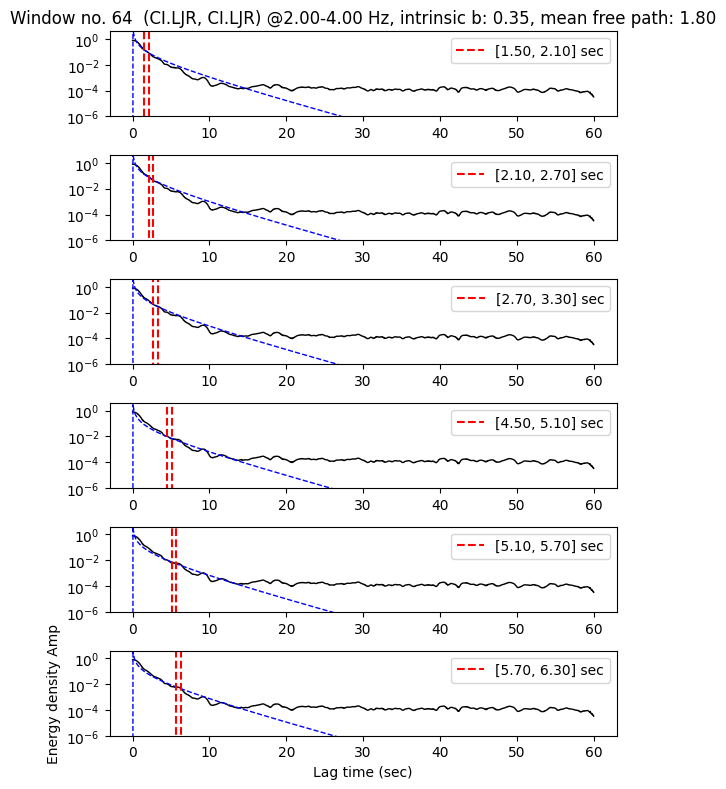

In [40]:
# getting the optimal value from the SSR
result_intb=np.zeros((nwin))
result_mfp=np.zeros((nwin))

Eobs=np.ndarray((fnum, nwin, nwindows, half_npts+1))
Esyn=np.ndarray((fnum, nwin, nwindows, half_npts+1))
scaling_amp=np.ndarray((nwin,nwindows))

fmin=freq1
fmax=freq2
wfcen=2.0*np.pi*((freq1+freq2)/2.0)

for ntw in range(nwin):
    
    fmsv_mean_single = np.zeros((fnum, half_npts+1))
    fmsv_mean_single[0] = fmsv_mean[ntw,1,:]

    # parameters for getting the sum of squared residuals (SSR) between Eobs and Esyn 
    para={ 'fmin':fmin, 'fmax':fmax, 'vdist':vdist, 'npts':npts_one_segmt, 'dt':dt, 'cvel':cvel,  \
            'mfp':mfpx, 'intb':intby, 'twin':coda_single_band, 'fmsv':fmsv_mean_single, \
            'SSR':SSR[ntw] , 'sta':sta_pair }
    # call function get_SSR
    #SSR_final, mfpx, intby = get_optimal_Esyn(para)
    result_intb[ntw], result_mfp[ntw], Eobs[fnum-1, ntw], Esyn[fnum-1, ntw], scaling_amp[ntw] = get_optimal_Esyn(para)
    
    # plotting fitting results
    #if ntw == 32:
    plot_fitting_result(result_mfp[ntw],result_intb[ntw],fmsv_mean[ntw,0,:],Eobs[fnum-1, ntw],Esyn[fnum-1, ntw],
                        sta_pair,vdist,coda_single_band[fnum-1],fmin,fmax,ntw)

intQ=np.zeros((nwin)) 
intQ=wfcen/result_intb


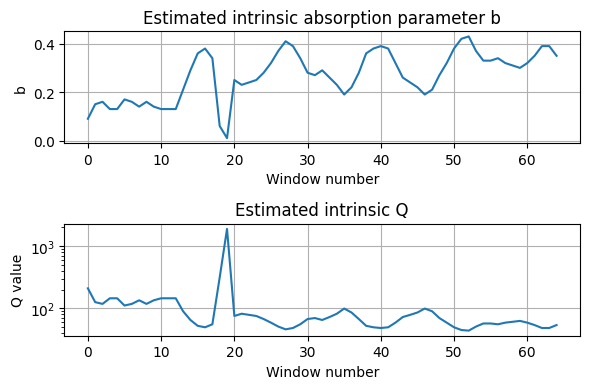

In [41]:
fig,ax=plt.subplots(2,1,figsize=(6,4))
ax[0].plot(result_intb, label='intrinsic b')
ax[0].grid(True)
ax[0].set_title('Estimated intrinsic absorption parameter b')
ax[0].set_xlabel('Window number')
ax[0].set_ylabel('b')

ax[1].plot(intQ, label='Q')
ax[1].set_yscale("log")
ax[1].grid(True)
ax[1].set_title('Estimated intrinsic Q')
ax[1].set_xlabel('Window number')
ax[1].set_ylabel('Q value')
plt.tight_layout()

### Step : Output results as a csv file

In [43]:
# Restore calendar time from cc_time array 
#cal_time=win_time[:nwin]
cal_time=win_time[:len(win_time)//3]
print(len(cal_time),results_dvv.shape,result_intb[:].shape, intQ.shape )


65 (65,) (65,) (65,)


In [44]:
from datetime import datetime

midpoint = np.zeros(nev, dtype=datetime)
for iev in range(nev):
    #print(timespans[iev], type(timespans[iev]))

    start_datetime = timespans[iev].start_datetime
    end_datetime = timespans[iev].end_datetime

    # Calculate the midpoint
    midpoint[iev] = start_datetime + (end_datetime - start_datetime) / 2
    

In [46]:
import pandas as pd

fieldnames = ['time', 'dvv','err','int_b','wfcen', 'Q']
fcsv="Monitoring_output.csv"
data={
'time': midpoint,
'dvv':  results_dvv,
'err':  results_err,
'int_b': result_intb[:],
'wfcen': np.full((nwin),wfcen),
'Q': intQ[:],
}

df=pd.DataFrame(data)
df.to_csv(fcsv,columns=fieldnames,sep=',',index = None, header=True, float_format="%.4f" )

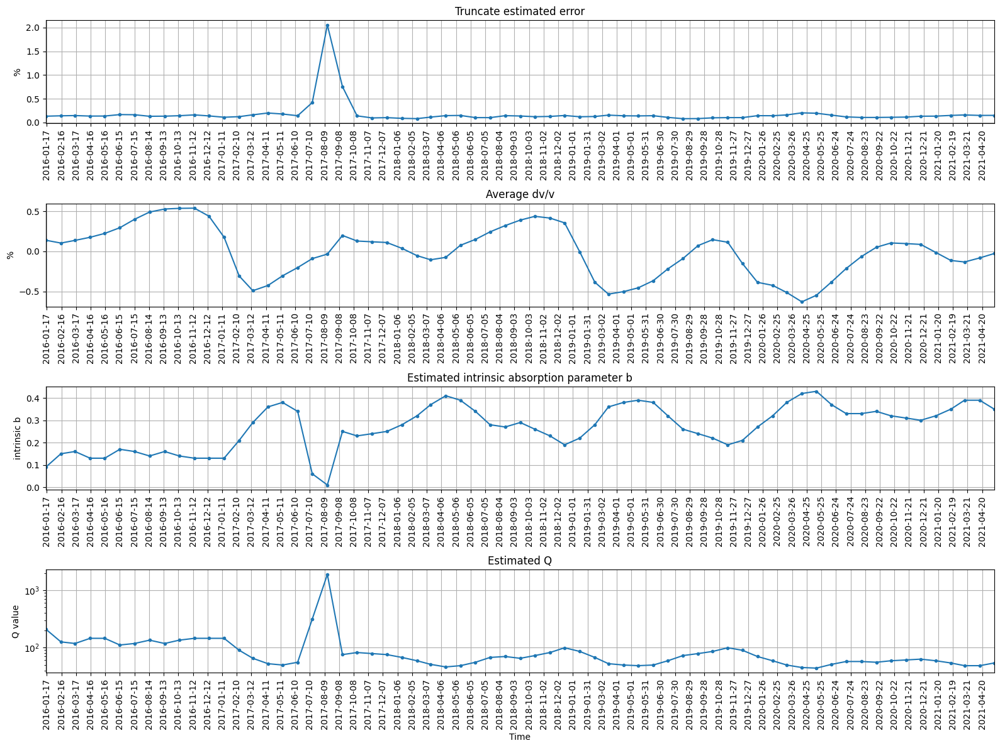

In [47]:
import matplotlib.dates as mdates

fig,ax=plt.subplots(4,1,figsize=(16,12))

#t=[ timespans[d] for d in cal_time]
t=midpoint


ax[0].plot_date(t, results_err, '.-', label='error of dv/v (%)')
ax[0].set_title('Truncate estimated error')
ax[0].set_ylabel('%')

ax[1].plot_date(t, results_dvv, '.-', label='dv/v (%)')
ax[1].set_title('Average dv/v')
ax[1].set_ylabel('%')

ax[2].plot_date(t, result_intb[:], '.-', label='intrinsic b')
ax[2].set_title('Estimated intrinsic absorption parameter b')
ax[2].set_ylabel('intrinsic b')

ax[3].plot_date(t,intQ[:],'.-',  label='Q')
ax[3].set_title('Estimated Q')
ax[3].set_ylabel('Q value')
ax[3].set_xlabel('Time')
ax[3].set_yscale('log')
for k in range(4):
    ax[k].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax[k].set_xlim(np.datetime64(t[0]), np.datetime64(t[-1]))
    ax[k].xaxis.set_major_locator(mdates.DayLocator(interval=30))
    ax[k].tick_params('x',labelrotation=90)
    ax[k].grid(True)

plt.tight_layout()

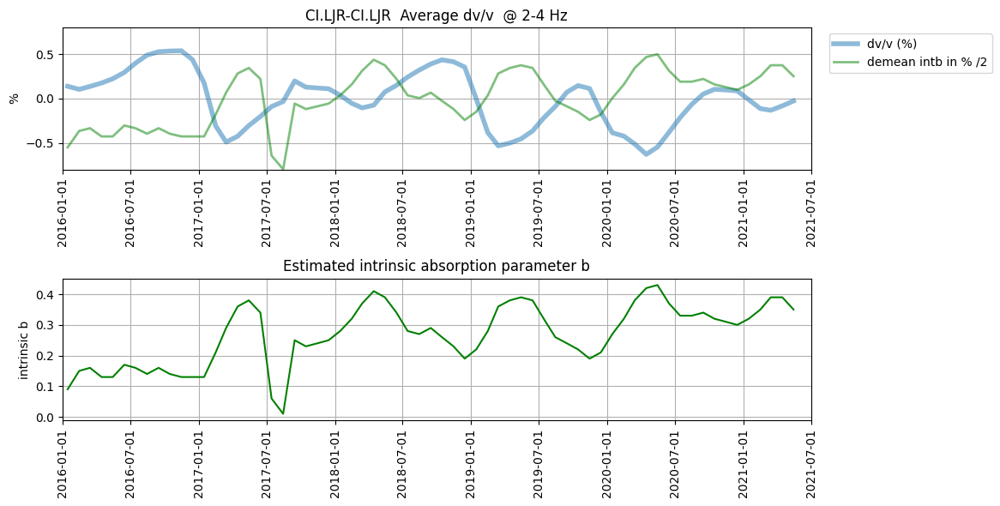

In [49]:
import matplotlib.dates as mdates

fig,ax=plt.subplots(2,1,figsize=(12,6))

demeanQ=np.zeros((nwin,1))
demeanQ=(intQ[:]-np.mean(intQ[:]))
demeanQ=demeanQ/np.max(demeanQ)
 
demeanB=np.zeros((nwin,1))
demeanB=(result_intb[:]-np.mean(result_intb[:]))
demeanB=demeanB/np.max(demeanB)


ax[0].plot_date(t, results_dvv, '-', lw=4, alpha=0.5, label=f'dv/v (%)')
ax[0].set_title(f'{src}-{rec}  Average dv/v  @ {fmin}-{fmax} Hz')
ax[0].set_ylabel('%')
ax[0].set_ylim(-0.8,0.8)
#ax[0].plot_date(t, demeanQ*2, '-', alpha=0.5,  label='demean intQ in % *2')
ax[0].plot_date(t, demeanB/2, '-', alpha=0.5, lw=2, color='green', label='demean intb in % /2')
ax[0].legend(loc='upper right', bbox_to_anchor=(1.25,1))

ax[1].plot_date(t, result_intb[:], '-', color='green', label='intrinsic b')
ax[1].set_title('Estimated intrinsic absorption parameter b')
ax[1].set_ylabel('intrinsic b')
# ax[1].set_ylim(np.percentile(result_intb,5),np.percentile(result_intb,5)*1.2)

specific_months = pd.date_range(start='2016-01-01', end='2021-12-31', freq='6MS')

for k in range(2):
    ax[k].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax[k].set_xlim(np.datetime64(t[0]), np.datetime64(t[-1]))
    ax[k].xaxis.set_major_locator(mdates.YearLocator(base=1))
    ax[k].set_xticks(specific_months)
    ax[k].tick_params('x',labelrotation=90)
    ax[k].grid(True)


plt.tight_layout()